# AML Model
### MS996 | Management Science Project
#### Nicholas Ballingall | March 2026

## Notebook Setup

In [550]:
# --- 0.1 Fix Apple Silicon C++ Issue ---
"""
The C++ code underlying Gradient Boost libraries has some known issues
with both MacOS and Apple's M-series chips. This causes the kernel to die.
Below is a work-around that stps the issue but limits performance.
"""

import os
# Force OpenMP to use a single thread to prevent the Mac SegFault
os.environ['OMP_NUM_THREADS'] = '1'
# Prevent library conflicts from crashing the kernel
os.environ['KMP_DUPLICATE_LIB_OK'] = 'True'

In [551]:
# --- 0.2 Import Libraries ---

# Data Processing
import pandas as pd
import numpy as np
import re
from collections import defaultdict # dynamic key referencing

# Visualisation
import matplotlib.pyplot as plt
import seaborn as sns

# Machine Learning
from sklearn.metrics import precision_recall_curve, classification_report, confusion_matrix, f1_score
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import HistGradientBoostingClassifier
from sklearn.inspection import permutation_importance
from sklearn.ensemble import StackingClassifier

from imblearn.over_sampling import SMOTE
import networkx as nx

import optuna

# System
import logging
import warnings

In [552]:
# --- 0.3 Configure Formatting ---

# Using some partial copies dataframes throughout – suppress warnings
from pandas.errors import SettingWithCopyWarning
warnings.simplefilter(action = 'ignore', category = SettingWithCopyWarning)

# Optuna can be very chatty – this keeps the output clean
optuna.logging.set_verbosity(optuna.logging.WARNING)

# Output Readability
ind = '   ' # 3-space indent
pd.options.display.float_format = '{:,.2f}'.format # 2 decimal places (dealing with cash)

# Output Titles
accounts_title = f"\n\n{'='*25} ACCOUNTS {'='*25}\n"
transactions_title = f"\n\n{'='*25} TRANSACTIONS {'='*25}\n"
alerts_title = f"\n\n{'='*25} TITLES {'='*25}\n"

# Plot Style
sns.set_style('whitegrid')
plt.rcParams['figure.dpi'] = 300

In [553]:
# --- 0.4 Import Data ---

# Filepath
local_path = '/Users/nickballingall/Library/CloudStorage/OneDrive-UniversityofStrathclyde/MSc FInTech/Uni Projects/Management Science'

accounts = pd.read_csv(f'{local_path}/Data/accounts.csv')
transactions = pd.read_csv(f'{local_path}/Data/transactions.csv')
alerts = pd.read_csv(f'{local_path}/Data/alerts.csv')

data_list = ['accounts', 'transactions', 'alerts']

# Copy original datasets for reference
for dataset in data_list:
    original_df = globals()[f'{dataset}']
    raw_df = original_df.copy()
    globals()[f'{dataset}_raw'] = raw_df

## A. Eploratory Analysis

### 1. EDA Functions

In [556]:
# --- 1.1 Data Cleaning ---

# Null Values
def _find_null(df):
    """
    Finds null/NaN values in a series of dataframes.
    """
    # Drop null values + validation
    df.dropna(inplace = True)
    null_counts = df.isna().sum()
    null_cols = null_counts[null_counts > 0]

    if not null_cols.empty:
        print(f"\n--- Null Values ---\n")
        print(f"\n{len(null_cols)} columns with null values:\n")
        
        for col, count in null_cols.items(): # get no. of nulls in each column
            if count > 1:
                print(f"{ind}> {col}: {count} nulls")
            else:
                print(f"{ind}> {col}: {count} null") # minor & unnessecary but nice to have
    else:
        print("\nNo null values found")


# Non-Standard Characters (NSC)
def _find_nsc(df):
    """
    Returns any Non-Standard Characters (NSC) in a dataframe as a list.
    """
    nsc_cells = []
    pattern = re.compile(r'[^a-zA-Z0-9\-\(\)\,\'\"\ \.\_\/]') # 'safe' characters

    for col in df.columns:
        for index, value in df[col].dropna().items(): # drop nulls
            if isinstance(value, str) and pattern.search(value):  # limit to string vals
                nsc_cells.append((index, col, value))

    return nsc_cells

corrections = {} # dictionary of manual corrections

def _fix_nsc (df, corrections = corrections):
    """
    Swaps NSC in a dataframe using corrections dictionary.
    (e.g. subbing ň for n)

    Paramters:
        - df: dataframe
        - corrections: dict of corrections
    """
    for col in df.columns:
        for index, value in df[col].dropna().items():
            if isinstance(value, str) and value in corrections:
                df.at[index, col] = corrections[value]  # replace nsc
    return df

# Cardinality
def _cardinality_drop(df, num_vals):
    """
    Drops dataframe columns with =< X no. of unique values

    Args:
        - df (dataframe): input dataframe
        - num_vals (int): 'X' number of values
    """
    unique_vals = df.nunique() # .nunique automatically handles nulls
    drop_cols = unique_vals[unique_vals <= num_vals].index
    
    if not drop_cols.empty:
        print(f"\nDropping columns with =< {num_vals} unique value(s)...")
        for col in list(drop_cols):
            print(f"{ind}> {col}")
        df = df.drop(drop_cols, axis = 1) 
    else:
        print(f"\nNo columns dropped – all have > {num_vals} unique valiues")
        
    return df

# Duplicate Data
def duplicate_check(data, cols, drop_col, drop=False):
    """
    Check for duplicate data across columns & optionally drop
    fully duplicate rows.

    Args:
        - data(pd.DataFrame): The input dataset
        - cols(list): The columns to compare
        - drop_col(str/list): which column(s) to drop
        - drop(bool): if True, drop drop_col
    """
    
   # Validate column list
    if not isinstance(cols, list) or len(cols) < 2:
        raise ValueError("Provide at least two column names in the 'cols' argument")

    # A row matches if all specified columns have exactly 1 unique value between them
    # NaNs are treated as identical (1 unique value), dropna=False
    match_mask = data[cols].nunique(axis=1, dropna=False) == 1
    
    match_rows = data[match_mask]
    diff_rows = data[~match_mask]
    
    num_diff = len(diff_rows)
    num_match = len(match_rows)
    
    # Check if columns are totally identical
    if num_diff == 0:
        print(f"Columns {cols} are fully identical")
        if drop:
            print(f"{ind}> '{drop_col}' dropped.") 
            data = data.drop(drop_col, axis=1)
            
    # Check if columns are totally different
    elif num_match == 0:
        print(f"Columns {cols} are completely different (0 matching rows)")
            
    # Handle partial matches
    else:
        print(f"Partial match for {cols}: {num_match} matching vs {num_diff} differing rows")
        
        # Identify outliers - display lesser count
        if num_diff < num_match:
            print("--- DIFFERING ROWS (lesser count) ---") 
            display(diff_rows)
            
        elif num_match < num_diff:
            print("--- MATCHING ROWS (lesser count) ---") 
            display(match_rows)
            
        else:
            print("Match and difference counts are equal – displaying both\n")
            print("--- MATCHING ROWS ---")
            display(match_rows)
            print("--- DIFFERING ROWS ---")
            display(diff_rows)
            
    return data

In [557]:
# --- 1.2 Summary Stats ---

def process_dataframe(df, clean_data=True, min_cardinality=1):
    """
    Performs exploration and optional cleaning on a given dataframe.
    Shows nulls, cardinality, unique values & has a nicer format than df.describe().
    
    Args:
        - df (pd.DataFrame): The dataframe to process.
        - dataset_name (str): The string name of the dataset (for titles).
        - clean_data (bool, optional): Whether to run the cleaning stage.
        - min_cardinality (int, optional): The minimum cardinality for a 
          column to be kept during the cleaning stage.
    
    Returns:
        - pd.DataFrame: The processed (and potentially cleaned) dataframe.
    """
    
    df.columns = df.columns.str.lower() # lowercase column names

    # Convert lists to tuples for compatability (hashable)
    for col in df.columns:
        if df[col].map(lambda x: isinstance(x, list)).any():
            df[col] = df[col].apply(lambda x: tuple(x) if isinstance(x, list) else x)

    print("\n--- Column Analysis ---")
    min_list, max_list, mean_list, mode_list = [], [], [], []

    for col in df.columns:
        # Continious cols
        if pd.api.types.is_numeric_dtype(df[col]) and df[col].dtype != 'bool':
            min_list.append(df[col].min())
            max_list.append(df[col].max())
            mean_list.append(f"{df[col].mean():.2f}") # for readability
            mode_list.append('-')
        else:
            # Categorical cols
            min_list.append('-')
            max_list.append('-')
            mean_list.append('-')
            try:
                # If multiple modes, take the first
                mode_list.append(df[col].mode().iloc[0])
            except IndexError:
                # Full null column
                mode_list.append('N/A')

    # Combine all series into single df
    display_df = pd.DataFrame({
        'Null Count': df.isnull().sum(),
        'Null %': (df.isnull().sum() / len(df) * 100).round(2),
        'Cardinality': df.nunique(),
        'Min': min_list,
        'Max': max_list,
        'Mean': mean_list,
        'Mode': mode_list,
        'Unique Values': df.apply(lambda col: col.unique())
    })
    
    display(display_df)

    # Clean data
    if clean_data:
        print("\n--- Cleaning Data ---")
        df.drop_duplicates(inplace=True)
        _find_null(df)
        
        nsc = _find_nsc(df)
        if nsc:
            print("\nNon-Standard Characters found:")
            for row, col, value in nsc:
                # Fixed bug: 'ind' was not defined
                print(f"- '{value}' at Column {col}, Row {row}") 
        
        df = _cardinality_drop(df, min_cardinality) # drop cols with <= 'min_cardinality' unique value(s)
        print("\nCleaning Complete")
    else:
        print("\n--- Cleaning Skipped ---")

    return df

In [558]:
# --- 1.3 Relationship Visualisation ---

def plot_features_vs_target(df, target_feature, hue_feature, comparison_features=None):
    """
    Generates a grid of scatterplots comparing a target feature against 
    other features, with a categorical hue.

    Args:
        - df (pd.DataFrame): The input dataset
        - target_feature (str): Y-axis feature name
        - hue_feature (str): Categorical feature name (for plot hue)
        - comparison_features (list, optional): X-axis features. If None, defaults to
            all columns in 'df' except 'target_feature' and 'hue_feature'
    """
    plot_df = df.copy()
    
    # Convert list columns into comma-separated strings
    for col in plot_df.columns:
        if plot_df[col].map(lambda x: isinstance(x, list)).any():
            plot_df[col] = plot_df[col].apply(
                lambda x: ', '.join(map(str, x)) if isinstance(x, list) and len(x) > 0 
                else ('None' if isinstance(x, list) else x)
            )
            
    # Configure Features
    if comparison_features is None:
        # Default to all columns except the target and hue
        ex_cols = [target_feature, hue_feature]
        feature_cols = [col for col in df.columns if col not in ex_cols]
    else:
        # Use the user-provided list
        feature_cols = comparison_features

    # Dynamic Colors
    hue_categories = sorted(df[hue_feature].unique())
    n_colors = len(hue_categories)
    
    # Using 'tab10' palette, but will repeat if > 10 categories
    palette = sns.color_palette("tab10", n_colors=n_colors) 
    color_map = dict(zip(hue_categories, palette))

    # Set up Plots Grid
    num_features = len(feature_cols)
    cols = 3  # Grid columns
    rows = -(-num_features // cols)  # Calculate rows (ceiling division)

    fig, axes = plt.subplots(rows, cols, figsize=(18, 6 * rows))
    fig.suptitle(f'{target_feature.title()} vs. Features (Hued by {hue_feature.title()})', 
                 fontsize=18, y=1.02)
    
    # Ensure axes is always iterable even if there's only 1 subplot
    if num_features == 1:
        axes = [axes]
    else:
        axes = axes.flatten()

    # Plot Data
    for i, feature in enumerate(feature_cols):
        ax = axes[i]
        
        # Validate feature (must be numeric)
        if pd.api.types.is_numeric_dtype(df[feature]):
            sns.scatterplot(
                data=df, 
                x=feature, 
                y=target_feature, 
                hue=hue_feature, 
                ax=ax, 
                alpha=0.6, 
                palette=color_map, 
                legend=False # Better-fitting legend created below
            )
            ax.set_title(f'{target_feature} vs. {feature}')
            ax.set_xlabel(feature)
            ax.set_ylabel(target_feature)

            # x-ticks adjustments
            ax.tick_params(axis='x', rotation=45)
            ax.set_xticks(ax.get_xticks()) # Avoids warning
            ax.set_xticklabels(ax.get_xticklabels(), ha='right')
        else:
            # Handle non-numeric features
            ax.text(0.5, 0.5, f"Skipping {feature} – non-numeric",
                    horizontalalignment='center', verticalalignment='center',
                    transform=ax.transAxes, fontsize=12, color='gray')
            ax.set_title(f"Skipping '{feature}'")

    # Create Separate Legend
    fig_legend, ax_legend = plt.subplots(figsize=(18, 3))
    
    handles = [plt.Line2D([0], [0], marker='o', color='w', markersize=8, 
                          markerfacecolor=col) for col in color_map.values()]
    labels = list(color_map.keys())
    
    ax_legend.legend(handles, labels, title=hue_feature.title(), 
                     loc='center', ncol=len(labels))
    ax_legend.axis('off')

    # Hide unused subplots
    for j in range(i + 1, len(axes)):
        fig.delaxes(axes[j])

    # Display Plots
    fig.tight_layout(rect=[0, 0.03, 1, 0.95]) # Adjust layout
    plt.show(fig)
    plt.show(fig_legend)

In [559]:
# --- 1.4 Time-Series Visualisation ---

# Prep Time-Series Data
def prep_custom_timeline(master_statement, accounts_df, alerts_df, hue_feature):
    """
    Aggregates the master ledger into time-based metrics based on any categorical feature.
    Dynamically fetches the hue_feature from the appropriate dataframe.

    Args:
        - master_statement(pd.DataFrame): master ledger of all transactions
        - accounts_df(pd.DataFrame): accounts' details
        - alerts_df(pd.DatFreame): all alerted transactions
        - hue_feature(str): the feature to use when applying hue to plots

    Returns:
        - timeline_df(pd.DataFrame): aggregated features in chronological order
    """
    ms_merged = master_statement.copy()

    # Fetch Hue Feature – Accounts
    if hue_feature in accounts_df.columns and hue_feature not in ms_merged.columns:
        ms_merged = ms_merged.merge(
            accounts_df[['account_id', hue_feature]], 
            on='account_id', 
            how='left'
        )
        
    # Fetch Hue Feature – Alerts
    elif hue_feature in alerts_df.columns and hue_feature not in ms_merged.columns:
        unique_alerts = alerts_df[['alert_id', hue_feature]].drop_duplicates()
        ms_merged = ms_merged.merge(
            unique_alerts, 
            on='alert_id', 
            how='left'
        )
        # Clean up nulls specifically if looking at alert_type
        # NOTE: Maybe just do this with the dataframe anyway?
        if hue_feature == 'alert_type':
            ms_merged['alert_type'] = ms_merged['alert_type'].fillna('no_alert')

    # Catch-all validation just in case
    if hue_feature not in ms_merged.columns:
        raise KeyError(f"Could not find '{hue_feature}' in master_statement, accounts, or alerts dataframes")

    # Group by timestamp & hue_feature
    timeline_df = ms_merged.groupby(['timestamp', hue_feature]).agg(
        num_transactions=('tx_id', 'count'),
        avg_running_balance=('running_balance', 'mean'),
        net_balance_change=('tx_value', 'sum'),
        total_spending=('tx_value', lambda x: x[x < 0].abs().sum()),
        total_received=('tx_value', lambda x: x[x > 0].sum())
    ).reset_index()

    # Calculate Send/Receive Ratio
    # NOTE: Removed from direct inclusion in accounts df as it's only used here (might move it back for clarity)
    # Adding tiny wee number to prevent division by 0
    timeline_df['send_vs_receive_ratio'] = timeline_df['total_spending'] / (timeline_df['total_received'] + 1e-9)
    timeline_df['send_vs_receive_ratio'] = timeline_df['send_vs_receive_ratio'].clip(upper=10)

    return timeline_df


# Time-Series Plotting Function
def plot_timeline(df, time_feature, hue_feature, comparison_features):
    """
    Generates a grid of scatterplots comparing features over a fixed time axis.
    Adapted from plot_features_vs_target.

    Args:
        - df(pd.DataFrame): input dataframe containing time-series(-ish) data
        - time_feature(str): column with chronological data (doesn't work w/ datetime)
        - hue_feature(str): the feature to use when applying hue to plots
        - comparison_features(list): features to plot over time
    """
    plot_df = df.copy()

    # Dynamic Colors
    hue_categories = sorted(plot_df[hue_feature].unique())
    palette = sns.color_palette("tab10", n_colors=len(hue_categories)) 
    color_map = dict(zip(hue_categories, palette))

    # Set up Plots Grid
    num_features = len(comparison_features)
    cols = 3  
    rows = -(-num_features // cols) 

    fig, axes = plt.subplots(rows, cols, figsize=(18, 6 * rows))
    fig.suptitle(f'Activity Metrics Over Time (Hued by {hue_feature.title()})', 
                 fontsize=18, y=1.02)
    
    axes = np.array(axes).flatten() # Ensure axes is flat even for 1 row

    # Plot Data
    for i, feature in enumerate(comparison_features):
        ax = axes[i]
        
        # NOTE: X & Y axes swapped here compared to OG function
        sns.scatterplot(
            data=plot_df, 
            x=time_feature, # time locked to X-axis
            y=feature,        
            hue=hue_feature, 
            ax=ax, 
            alpha=0.6, 
            palette=color_map, 
            legend=False 
        )
        ax.set_title(f'{feature} over Time')
        ax.set_xlabel(time_feature)
        ax.set_ylabel(feature)

    # Create Separate Legend
    fig_legend, ax_legend = plt.subplots(figsize=(18, 1.5))
    
    handles = [plt.Line2D([0], [0], marker='o', color='w', markersize=8, 
                          markerfacecolor=col) for col in color_map.values()]
    labels = list(color_map.keys())
    
    ax_legend.legend(handles, labels, title=hue_feature.title(), 
                     loc='center', ncol=len(labels))
    ax_legend.axis('off')

    # Hide unused subplots
    for j in range(num_features, len(axes)):
        fig.delaxes(axes[j])

    fig.tight_layout(rect=[0, 0.03, 1, 0.95]) 
    plt.show(fig)
    plt.show(fig_legend)

In [560]:
# --- 1.5 Population Wealth Analysis ---

# Wealth Summary
def generate_wealth_summary(accounts_df):
    """
    Creates a summary dataframe showing population size, wealth, debt, 
    and wealth concentration anchored to the system's starting liquidity.
    """
    # 1. Calculate System Totals
    total_pop = len(accounts_df)
    total_start = accounts_df['init_balance'].sum()
    total_end = accounts_df['close_balance'].sum()
    
    # Isolate system-wide debt (sum of all balances < 0)
    total_start_debt = accounts_df.loc[accounts_df['init_balance'] < 0, 'init_balance'].sum()
    total_end_debt = accounts_df.loc[accounts_df['close_balance'] < 0, 'close_balance'].sum()
    
    summary_rows = []

    # Add System Total Row
    summary_rows.append({
        'group': 'total_system',
        'population_size': total_pop,
        'starting_wealth': total_start,
        'final_wealth': total_end,
        'starting_debt': total_start_debt,
        'final_debt': total_end_debt,
        'starting_concentration_pct': 100.0,
        'final_concentration_pct': (total_end / total_start) * 100 if total_start else 0
    })

    # Helper function to process cohorts
    def _process_cohort(groupby_col, prefix):
        grouped = accounts_df.groupby(groupby_col).agg(
            pop=('account_id', 'count'),
            start_wealth=('init_balance', 'sum'),
            end_wealth=('close_balance', 'sum'),
            # Isolate debt by only summing negative values
            start_debt=('init_balance', lambda x: x[x < 0].sum()),
            end_debt=('close_balance', lambda x: x[x < 0].sum())
        ).reset_index()
        
        for _, row in grouped.iterrows():
            summary_rows.append({
                'group': f"{prefix}: {row[groupby_col]}",
                'population_size': row['pop'],
                'starting_wealth': row['start_wealth'],
                'final_wealth': row['end_wealth'],
                'starting_debt': row['start_debt'],
                'final_debt': row['end_debt'],
                'starting_concentration_pct': (row['start_wealth'] / total_start) * 100 if total_start else 0,
                'final_concentration_pct': (row['end_wealth'] / total_start) * 100 if total_start else 0
            })

    # Process Alert Status & Behavior IDs
    if 'alert_status' in accounts_df.columns:
        _process_cohort('alert_status', 'alert_status')
    if 'tx_behavior_id' in accounts_df.columns:
        _process_cohort('tx_behavior_id', 'behavior_id')

    # Compile and format as DF
    summary_df = pd.DataFrame(summary_rows)
    
    # Calculate Net Changes
    summary_df['net_wealth_change'] = summary_df['final_wealth'] - summary_df['starting_wealth']
    summary_df['accrued_debt'] = summary_df['final_debt'] - summary_df['starting_debt']
    summary_df['sys_wealth_capture_pct'] = summary_df['final_concentration_pct'] - summary_df['starting_concentration_pct']
    
    # Reorder columns for a clean financial ledger readout
    cols = [
        'group', 'population_size', 
        'starting_wealth', 'final_wealth', 'net_wealth_change',
        'starting_debt', 'final_debt', 'accrued_debt',
        'starting_concentration_pct', 'final_concentration_pct', 'sys_wealth_capture_pct'
    ]
    return summary_df[cols]

# Visualise Walth Shifts
def plot_balance_shifts(wealth_df):
    """
    Plots grouped bar charts comparing initial vs closing balances using the summary dataframe.
    """
    # Filter out the 'total_system' row for the plots
    plot_data = wealth_df[wealth_df['group'] != 'total_system'].copy()
    
    # Split back into our two cohorts based on the string prefix
    status_df = plot_data[plot_data['group'].str.startswith('alert_status')].copy()
    behavior_df = plot_data[plot_data['group'].str.startswith('behavior_id')].copy()
    
    # Clean up the Group names for the x-axis
    status_df['group'] = status_df['group'].str.replace('alert_status: ', '')
    behavior_df['group'] = behavior_df['group'].str.replace('behavior_id: ', '')

    fig, axes = plt.subplots(1, 2, figsize=(16, 6))
    fig.suptitle('System Liquidity Shifts (Initial vs. Close Balance)', fontsize=16, y=1.05)

    # Melt dataframes for seaborn
    status_melted = status_df[['group', 'starting_wealth', 'final_wealth']].melt(
        id_vars='group', var_name='balance_type', value_name='amount'
    )
    behavior_melted = behavior_df[['group', 'starting_wealth', 'final_wealth']].melt(
        id_vars='group', var_name='balance_type', value_name='amount'
    )

    # Plot 1: Alert Status
    sns.barplot(
        data=status_melted, x='group', y='amount', hue='balance_type', 
        palette=['#4C72B0', '#55A868'], ax=axes[0]
    )
    axes[0].set_title('Total Balances by Alert Status')
    axes[0].set_ylabel('Total Amount ($)')
    axes[0].set_xlabel('alert_status')

    # Plot 2: Behavior ID
    sns.barplot(
        data=behavior_melted, x='group', y='amount', hue='balance_type', 
        palette=['#4C72B0', '#55A868'], ax=axes[1]
    )
    axes[1].set_title('Total Balances by Behavior ID')
    axes[1].set_ylabel('Total Amount ($)')
    axes[1].set_xlabel('behavior_id')
    axes[1].tick_params(axis='x', rotation=45)

    # Format Y-axes to show readable currency
    for ax in axes:
        ax.yaxis.set_major_formatter(plt.FuncFormatter(lambda x, loc: f"${int(x/1e6):,}M"))

    plt.tight_layout()
    plt.show()

In [561]:
# --- 1.6 Behaviour Gorup Profiling ---

# Alerts
def profile_behavior_groups(accounts_df):
    """
    Calculates the quantities and ratios of alerted vs non-alerted accounts per behavior ID,
    and provides a percentage breakdown of the specific alert types triggered.
    """
    print("--- Population & Alert Ratios by Behavior ID ---")
    
    # Group by Behavior ID & Alert Status; count accounts
    base_counts = accounts_df.groupby(['tx_behavior_id', 'alert_status'])['account_id'].count().unstack(fill_value=0)
    base_counts.columns.name = None # fix index name
    
    # Calculate Totals & Percentages
    base_counts['Total Accounts'] = base_counts.sum(axis=1)
    
    # Dynamically calculate % for whatever statuses exist
    for col in base_counts.columns:
        if col != 'Total Accounts':
            base_counts[f'{col} (%)'] = (base_counts[col] / base_counts['Total Accounts']) * 100
            
    # Reorder columns to put Total first
    cols = ['Total Accounts'] + [c for c in base_counts.columns if c != 'Total Accounts']
    base_counts = base_counts[cols]
    
    # Format & display
    format_dict_base = {col: "{:.2f}%" for col in base_counts.columns if '(%)' in col}
    display(base_counts.style.format(format_dict_base))
    
    
    print("\n--- Alert Type Breakdown (Alerted Accounts Only) ---")
    
    # Filter down to ONLY alerted accounts
    alerted_df = accounts_df[accounts_df['unique_alert_count'] > 0].copy()
    
    # Unpack the lists of alert types so each gets its own row
    exploded_alerts = alerted_df.explode('associated_alert_types')
    exploded_alerts['associated_alert_types'] = exploded_alerts['associated_alert_types'].fillna('None')
    
    # Count unique accounts per alert type, per behaviour ID
    alert_counts = exploded_alerts.groupby(['tx_behavior_id', 'associated_alert_types'])['account_id'].nunique().unstack(fill_value=0)
    alert_counts.columns.name = None
    
    # Calculate what % of the alerted accounts in that group triggered each alert
    # (divide by the total number of alerted accounts in that specific group)
    total_alerted_per_group = alerted_df.groupby('tx_behavior_id')['account_id'].count()
    alert_pcts = alert_counts.div(total_alerted_per_group, axis=0) * 100
    
    # Rename columns (add % for clarity)
    alert_pcts.columns = [f"% triggered '{col}'" for col in alert_pcts.columns]
    
    # Merge the absolute counts and the percentages together
    alert_breakdown = pd.concat([alert_counts, alert_pcts], axis=1)
    
    # Format & display
    format_dict_alerts = {col: "{:.2f}%" for col in alert_breakdown.columns if '%' in col}
    display(alert_breakdown.style.format(format_dict_alerts))

# Alert Typologies
def profile_typology_roles(accounts_df):
    """
    Leverages existing 'fan_in_role' and 'cycle_role' columns to break down 
    the specific roles alerted accounts play within each behavior ID group.
    """
    # Filter down to only alerted accounts
    alerted_df = accounts_df[accounts_df['unique_alert_count'] > 0].copy()
    
    # Get the total alerted population per behaviour ID
    total_alerted_per_group = alerted_df.groupby('tx_behavior_id')['account_id'].count()

    print("--- Fan-In Roles by Behaviour ID ---")
    
    # Explode the existing fan_in_role lists and drop the NaN rows 
    fan_in_exploded = alerted_df.explode('fan_in_role')
    fan_in_exploded = fan_in_exploded.dropna(subset=['fan_in_role'])
    
    if not fan_in_exploded.empty:
        # Cross-tabulate Behaviour ID vs Role
        fan_in_counts = pd.crosstab(fan_in_exploded['tx_behavior_id'], fan_in_exploded['fan_in_role'])
        
        # Calculate percentages (Role Count / Total Alerted Accounts in that Behaviour ID)
        fan_in_pcts = fan_in_counts.div(total_alerted_per_group, axis=0) * 100
        fan_in_pcts.columns = [f"% '{col}'" for col in fan_in_pcts.columns]
        
        # Merge counts and percentages into a single summary table
        fan_in_summary = pd.concat([fan_in_counts, fan_in_pcts], axis=1).fillna(0)
        
        # Format for clean display
        format_dict_fan = {col: "{:.2f}%" for col in fan_in_summary.columns if '%' in col}
        display(fan_in_summary.style.format(format_dict_fan))
    else:
        print("No Fan-In roles found to profile")

    print("\n--- Cycle Roles by Behavior ID ---")
    
    # Explode the existing cycle_role lists + drop NaN rows
    cycle_exploded = alerted_df.explode('cycle_role')
    cycle_exploded = cycle_exploded.dropna(subset=['cycle_role'])
    
    if not cycle_exploded.empty:
        # Cross-tabulate Behaviour ID vs Role
        cycle_counts = pd.crosstab(cycle_exploded['tx_behavior_id'], cycle_exploded['cycle_role'])
        
        # Calculate percentages
        cycle_pcts = cycle_counts.div(total_alerted_per_group, axis=0) * 100
        cycle_pcts.columns = [f"% '{col}'" for col in cycle_pcts.columns]
        
        # Merge counts and percentages into a single summary table
        cycle_summary = pd.concat([cycle_counts, cycle_pcts], axis=1).fillna(0)
        
        # Format for clean display
        format_dict_cycle = {col: "{:.2f}%" for col in cycle_summary.columns if '%' in col}
        display(cycle_summary.style.format(format_dict_cycle))
    else:
        print("No Cycle roles found to profile")

In [562]:
# --- 1.7 Data Imbalance Check ---

def check_data_imbalance(df):
    """
    Calculates class imbalance and breaks down the specific fraud typologies,
    highlighting accounts with overlapping risk markers.
    """
    df = df.copy()
    
    # Base Binary Target
    df['is_alerted'] = (df['unique_alert_count'] > 0).astype(int)
    
    # Identify Risk Markers
    # Safely check if the role columns contain populated lists
    df['has_fan_in'] = df['fan_in_role'].apply(lambda x: isinstance(x, list) and len(x) > 0)
    df['has_cycle'] = df['cycle_role'].apply(lambda x: isinstance(x, list) and len(x) > 0)
    
    # Categorise Accounts by Typology Overlap
    def _categorise_typology(row):
        if not row['is_alerted']:
            return 'Non-Alerted'
        elif row['has_fan_in'] and row['has_cycle']:
            return 'Multiple Markers (Both)'
        elif row['has_fan_in']:
            return 'Fan-In Only'
        elif row['has_cycle']:
            return 'Cycle Only'
        else:
            return 'Alerted (Other)'
            
    df['typology_group'] = df.apply(_categorise_typology, axis=1)
    
    # Print Statistical Readout
    print("--- Data Imbalance Report ---")
    total = len(df)
    alerted_total = df['is_alerted'].sum()
    clean_total = total - alerted_total
    
    print(f"Total Accounts:  {total:,}")
    print(f"Non-Alerted (0): {clean_total:,} ({(clean_total/total)*100:.2f}%)")
    print(f"Alerted (1):     {alerted_total:,} ({(alerted_total/total)*100:.2f}%)")
    
    if alerted_total > 0:
        print(f"Imbalance Ratio: 1 Alerted account for every {int(clean_total/alerted_total)} Non-Alerted accounts\n")
        
    print("--- Typology Breakdown (Alerted Accounts Only) ---")
    alerted_df = df[df['is_alerted'] == 1]
    typo_counts = alerted_df['typology_group'].value_counts()
    
    for cat, count in typo_counts.items():
        pct = (count / alerted_total) * 100
        print(f"{cat.ljust(25)}: {count:,} ({pct:.2f}%)")
        
    # --- Visualisation ---
    fig, axes = plt.subplots(1, 2, figsize=(16, 6))
    
    # Plot 1: Binary Imbalance
    sns.countplot(
        data=df, x='is_alerted', hue='is_alerted', # avoids future warning
        palette=['green', 'red'], ax=axes[0], legend=False
    )
    axes[0].set_title('Overall Target Distribution', fontsize=14, pad=10)
    axes[0].set_xlabel('Account Status (0 = Clean, 1 = Alerted)', fontsize=12)
    axes[0].set_ylabel('Number of Accounts', fontsize=12)
    
    # Annotate Plot 1
    for p in axes[0].patches:
        height = p.get_height()
        if height > 0:
            axes[0].text(p.get_x() + p.get_width() / 2., height + (total * 0.01), 
                         f'{(height/total)*100:.1f}%', ha='center', fontweight='bold')

    # Plot 2: Typology Breakdown (alerted only)
    # Plotted ONLY the alerted accounts here so the clean accounts don't crush the scale
    order = ['Fan-In Only', 'Cycle Only', 'Multiple Markers (Both)', 'Alerted (Other)']
    sns.countplot(
        data=alerted_df, x='typology_group', hue='typology_group', 
        order=order, palette='magma', ax=axes[1], legend=False
    )
    
    axes[1].set_title('Typology Breakdown (Alerted Accounts)', fontsize=14, pad=10)
    axes[1].set_xlabel('Typology Marker', fontsize=12)
    axes[1].set_ylabel('Number of Accounts', fontsize=12)
    axes[1].tick_params(axis='x', rotation=25)
    
    # Annotate Plot 2
    for p in axes[1].patches:
        height = p.get_height()
        if pd.notna(height) and height > 0: 
            axes[1].text(p.get_x() + p.get_width() / 2., height + (alerted_total * 0.01), 
                         f'{(height/alerted_total)*100:.1f}%', ha='center', fontweight='bold')

    sns.despine()
    plt.tight_layout()
    plt.show()

In [563]:
# --- 1.8 Create Bank Statements ---

def create_master_statement(transactions_df, accounts_df):
    """
    Transforms a transaction log into a double-entry master bank statement,
    calculating chronoligcal running balances for all accounts.

    Args:
        - transactions_df(pd.DataFrame): transactions ledger
        - accounts_df(pd.DataFrame): account details

    Returns:
        - master_ledger(pd.DataFrame): newly formated account-based ledger
    """
    
    # Create Sender Perspective (money out == negative value)
    sender_df = transactions_df[['tx_id', 'sender_account_id', 'receiver_account_id', 'tx_amount', 'timestamp', 'is_fraud', 'alert_id']].copy()
    sender_df = sender_df.rename(columns={'sender_account_id': 'account_id', 'receiver_account_id': 'counterparty_id'})
    sender_df['tx_value'] = -sender_df['tx_amount'] # negative for outgoing
    sender_df['tx_direction'] = 'OUT'

    # Create Receiver Perspective (money in == positive value)
    receiver_df = transactions_df[['tx_id', 'sender_account_id', 'receiver_account_id', 'tx_amount', 'timestamp', 'is_fraud', 'alert_id']].copy()
    receiver_df = receiver_df.rename(columns={'receiver_account_id': 'account_id', 'sender_account_id': 'counterparty_id'})
    receiver_df['tx_value'] = receiver_df['tx_amount'] # positive for incoming
    receiver_df['tx_direction'] = 'IN'

    # Stack them together into a single ledger
    master_ledger = pd.concat([sender_df, receiver_df], ignore_index=True)

    # Bring in the initial balance from the accounts dataframe
    master_ledger = master_ledger.merge(
        accounts_df[['account_id', 'init_balance']], 
        on='account_id', 
        how='left' # attached init_balance to every row linked to each account
    )

    # Sort chronologically (CRITICAL for running balance)
    master_ledger = master_ledger.sort_values(by=['account_id', 'timestamp'], ascending=[True, True])

    # Calculate Running Balance
    # Group by account, take the cumulative sum of the tx_values, and add it to the init_balance
    master_ledger['running_balance'] = master_ledger.groupby('account_id')['tx_value'].cumsum() + master_ledger['init_balance']

    # Final Sorting & Cleanup
    # Sort account_id descending, but keep timestamp ascending within each account's block
    master_ledger = master_ledger.sort_values(by=['account_id', 'timestamp'], ascending=[False, True]).reset_index(drop=True)

    # Reorder columns for a clean, readable bank statement format
    final_cols = [
        'account_id', 'timestamp', 'tx_id', 'tx_direction', 'counterparty_id', 
        'tx_amount', 'tx_value', 'init_balance', 'running_balance', 'is_fraud', 'alert_id'
    ]
    
    return master_ledger[final_cols]

### 2. Summary Statistics

In [565]:
# --- 2.1 Summary Stats ---

for dataset in data_list:
    print(f"\n\n{'='*25} {dataset.upper()} {'='*25}\n") # output title
    original_df = globals()[f'{dataset}']
    
    processed_df = process_dataframe(
        df=original_df, 
        clean_data=True,
        min_cardinality=1
    )

    print("\n--- Feature Correlations ---")
    display(processed_df.select_dtypes(include=['number', 'bool']).corr())
    
    # Save new df in-place of original
    globals()[f'{dataset}'] = processed_df



========================= ACCOUNTS =========================


--- Column Analysis ---


,Null Count,Null %,Cardinality,Min,Max,Mean,Mode,Unique Values
account_id,0,0.00,10000,0,9999,4999.50,-,"[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13,..."
customer_id,0,0.00,10000,-,-,-,C_0,"[C_0, C_1, C_2, C_3, C_4, C_5, C_6, C_7, C_8, ..."
init_balance,0,0.00,8818,100.00,599.60,280.12,-,"[184.44, 175.8, 142.06, 125.89, 151.13, 140.49..."
country,0,0.00,1,-,-,-,US,[US]
account_type,0,0.00,1,-,-,-,I,[I]
is_fraud,0,0.00,2,-,-,-,False,"[False, True]"
tx_behavior_id,0,0.00,5,1,5,3.00,-,"[1, 2, 3, 4, 5]"



--- Cleaning Data ---

No null values found

Dropping columns with =< 1 unique value(s)...
   > country
   > account_type

Cleaning Complete

--- Feature Correlations ---


,account_id,init_balance,is_fraud,tx_behavior_id
account_id,1.00,0.01,0.18,0.10
init_balance,0.01,1.00,-0.01,0.15
is_fraud,0.18,-0.01,1.00,0.05
tx_behavior_id,0.10,0.15,0.05,1.00




========================= TRANSACTIONS =========================


--- Column Analysis ---


,Null Count,Null %,Cardinality,Min,Max,Mean,Mode,Unique Values
tx_id,0,0.00,1048575,1,1048575,524288.00,-,"[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14..."
sender_account_id,0,0.00,9999,1,9999,6028.08,-,"[6456, 7516, 2445, 2576, 3524, 7123, 8506, 382..."
receiver_account_id,0,0.00,9914,3,9999,6806.76,-,"[9069, 9543, 9356, 4617, 1773, 3327, 9711, 466..."
tx_type,0,0.00,1,-,-,-,TRANSFER,[TRANSFER]
tx_amount,0,0.00,38139,0.00,"21,500,000.00",29812.85,-,"[465.05, 564.64, 598.94, 466.07, 405.63, 11.38..."
timestamp,0,0.00,159,0,158,79.31,-,"[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13,..."
is_fraud,0,0.00,2,-,-,-,False,"[False, True]"
alert_id,0,0.00,306,-1,398,-0.73,-,"[-1, 193, 377, 189, 130, 183, 267, 176, 170, 8..."



--- Cleaning Data ---

No null values found

Dropping columns with =< 1 unique value(s)...
   > tx_type

Cleaning Complete

--- Feature Correlations ---


,tx_id,sender_account_id,receiver_account_id,tx_amount,timestamp,is_fraud,alert_id
tx_id,1.00,-0.00,-0.00,0.10,1.00,-0.00,-0.00
sender_account_id,-0.00,1.00,0.05,-0.03,-0.00,0.01,0.00
receiver_account_id,-0.00,0.05,1.00,0.00,-0.00,-0.00,-0.00
tx_amount,0.10,-0.03,0.00,1.00,0.10,-0.00,-0.00
timestamp,1.00,-0.00,-0.00,0.10,1.00,-0.00,-0.00
is_fraud,-0.00,0.01,-0.00,-0.00,-0.00,1.00,0.88
alert_id,-0.00,0.00,-0.00,-0.00,-0.00,0.88,1.00




========================= ALERTS =========================


--- Column Analysis ---


,Null Count,Null %,Cardinality,Min,Max,Mean,Mode,Unique Values
alert_id,0,0.00,391,0,399,208.07,-,"[193, 377, 189, 130, 183, 267, 176, 170, 8, 20..."
alert_type,0,0.00,2,-,-,-,cycle,"[fan_in, cycle]"
is_fraud,0,0.00,1,-,-,-,True,[True]
tx_id,0,0.00,1719,82,1322711,665495.93,-,"[82, 949, 6280, 7999, 12975, 17715, 19832, 227..."
sender_account_id,0,0.00,1484,49,9999,6507.79,-,"[6976, 5776, 9999, 1089, 7025, 3988, 3033, 690..."
receiver_account_id,0,0.00,1030,91,9999,6449.36,-,"[9739, 2570, 9530, 7352, 9708, 8996, 4204, 423..."
tx_type,0,0.00,1,-,-,-,TRANSFER,[TRANSFER]
tx_amount,0,0.00,392,2.54,19.92,9.76,-,"[4.85, 10.27, 2.74, 3.53, 3.87, 16.8, 2.72, 3...."
timestamp,0,0.00,200,0,199,100.56,-,"[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13,..."



--- Cleaning Data ---

No null values found

Dropping columns with =< 1 unique value(s)...
   > is_fraud
   > tx_type

Cleaning Complete

--- Feature Correlations ---


,alert_id,tx_id,sender_account_id,receiver_account_id,tx_amount,timestamp
alert_id,1.00,-0.05,-0.01,0.01,0.80,-0.05
tx_id,-0.05,1.00,0.04,-0.03,-0.02,1.00
sender_account_id,-0.01,0.04,1.00,-0.01,0.02,0.04
receiver_account_id,0.01,-0.03,-0.01,1.00,0.04,-0.03
tx_amount,0.80,-0.02,0.02,0.04,1.00,-0.02
timestamp,-0.05,1.00,0.04,-0.03,-0.02,1.00


### <span style="color:red">Observations</span>
- tx_amount is positively correlated with alert_id
- timestamp is **perfectly** correlated with tx_id *(because they're both continious)*
- is_fraud is positively correlated with alert_id

In [567]:
# --- 2.2 Drop Duplicate Data ---
"""
# Check if tx_id is just the timestamp (test)
print(transactions_title)
transactions_cols = ['tx_id', 'timestamp']

transactions = duplicate_check(
    data=transactions,
    cols=transactions_cols,
    drop_col = transactions_cols[1], # drop timestamp
    drop=True
)
display(transactions)
"""

# Check if customers can have >1 account
print(accounts_title)
# Drop "C_" from customer_id + change to int (to match account_id)
accounts['customer_id'] = accounts['customer_id'].str[2:].astype(int)

accounts_cols = ['account_id', 'customer_id']

accounts = duplicate_check(
    data=accounts,
    cols=accounts_cols,
    drop_col = accounts_cols[1], # drop customer_id
    drop=True
)
display(accounts)



========================= ACCOUNTS =========================

Columns ['account_id', 'customer_id'] are fully identical
   > 'customer_id' dropped.


,account_id,init_balance,is_fraud,tx_behavior_id
0,0,184.44,False,1
1,1,175.80,False,1
2,2,142.06,False,1
3,3,125.89,False,1
4,4,151.13,False,1
...,...,...,...,...
9995,9995,394.35,True,5
9996,9996,344.98,True,5
9997,9997,260.85,True,5
9998,9998,323.79,True,5


### 3. Alert Analysis

In [569]:
# --- 3.1 Check 'Alerts' Scope ---
fraud_transactions = transactions.loc[transactions['is_fraud'] == True]
sneaky_frauds = fraud_transactions[~fraud_transactions['tx_id'].isin(alerts['tx_id'])]

if sneaky_frauds.empty:
    print("All fraud transactions are in alerts df.")
else:
    print("Fraud transactions not in alerts df:")
    display(sneaky_frauds)

All fraud transactions are in alerts df.


### <span style="color:red">Observations</span>
- alert_id == -1 is bascially the same as is_fraud == False

In [571]:
# --- 3.2 Check 'alert_id' Meaning ---

# Confirm non-alert tag
non_alerts = transactions[transactions['alert_id'] == -1]
alerted_non_alerts = alerts[alerts['tx_id'].isin(non_alerts['tx_id'])]

if alerted_non_alerts.empty:
    print("'alert_id' == -1 is indicative of a non-alerted transaction")
else:
    print("Alerted Non-Alerts:")
    display(alerted_non_alerts)

'alert_id' == -1 is indicative of a non-alerted transaction


In [572]:
# --- 3.3 Categorise by Transaction Alerts ---

# Base Summaries
# Group by sender & get lists of unique tx_ids and alert_ids
sender_summary = transactions.groupby('sender_account_id').agg(
    sender_tx_ids=('tx_id', lambda x: list(x.unique())),
    sender_alert_ids=('alert_id', lambda x: list(x.unique()))
).rename_axis('account_id') # Rename index to 'account_id' for a smooth merge

# Group by receiver & get lists of unique tx_ids and alert_ids
receiver_summary = transactions.groupby('receiver_account_id').agg(
    receiver_tx_ids=('tx_id', lambda x: list(x.unique())),
    receiver_alert_ids=('alert_id', lambda x: list(x.unique()))
).rename_axis('account_id')

# Alerted Summaries (alert_id != -1)
alerted_txs = transactions[transactions['alert_id'] != -1]

# Group alerted transactions by sender
sender_alerts = alerted_txs.groupby('sender_account_id').agg(
    alerted_sender_tx_ids=('tx_id', lambda x: list(x.unique())),
    sender_alert_count=('tx_id', 'count') # Get the count of alerted sent txs
).rename_axis('account_id')

# Group alerted transactions by receiver
receiver_alerts = alerted_txs.groupby('receiver_account_id').agg(
    alerted_receiver_tx_ids=('tx_id', lambda x: list(x.unique())),
    receiver_alert_count=('tx_id', 'count') # Get the count of alerted received txs
).rename_axis('account_id')


# Combine Summaries
# Outer join base summaries (keeps alla ccounts)
account_activity = sender_summary.join(receiver_summary, how='outer')

# Joint alerted summaries
account_activity = account_activity.join(sender_alerts, how='left')
account_activity = account_activity.join(receiver_alerts, how='left')


# Clean Up & Calculate Totals
# Fill missing lists with empty lists []
list_cols = ['sender_tx_ids', 'sender_alert_ids', 'receiver_tx_ids', 'receiver_alert_ids', 
             'alerted_sender_tx_ids', 'alerted_receiver_tx_ids']

for col in list_cols:
    account_activity[col] = account_activity[col].apply(lambda x: x if isinstance(x, list) else [])

# Total alert count
account_activity['sender_alert_count'] = account_activity['sender_alert_count'].fillna(0)
account_activity['receiver_alert_count'] = account_activity['receiver_alert_count'].fillna(0)
account_activity['total_alert_count'] = account_activity['sender_alert_count'] + account_activity['receiver_alert_count']

# Drop temp split counts
#account_activity = account_activity.drop(columns=['sender_alert_count', 'receiver_alert_count'])


# Calculate Unique alert_ids

# Drop non-alerted accounts
def get_real_alerts(row):
    all_alerts = set(row['sender_alert_ids'] + row['receiver_alert_ids'])
    all_alerts.discard(-1)
    return list(all_alerts)

# Count the unique alert IDs and flag accounts with > 1 alert type
account_activity['unique_alerts'] = account_activity.apply(get_real_alerts, axis=1)
account_activity['unique_alert_count'] = account_activity['unique_alerts'].apply(len)
account_activity['multiple_alerts'] = account_activity['unique_alert_count'] > 1
account_activity = account_activity.reset_index()

multi_alert_accounts = account_activity[account_activity['multiple_alerts'] == True]

# Display the accounts that have more than one alert
print("Accounts tied to multiple alerts:")
display(multi_alert_accounts)

Accounts tied to multiple alerts:


,account_id,sender_tx_ids,sender_alert_ids,receiver_tx_ids,receiver_alert_ids,alerted_sender_tx_ids,sender_alert_count,alerted_receiver_tx_ids,receiver_alert_count,total_alert_count,unique_alerts,unique_alert_count,multiple_alerts
367,368,"[37428, 41564, 86249, 90885, 101441, 154712, 1...","[-1, 151, 379]","[3006, 27649, 58199, 66208, 70018, 70703, 7180...","[-1, 379]","[201581, 324057]",2.00,[360582],1.00,3.00,"[379, 151]",2,True
991,992,"[18551, 27902, 83404, 154490, 238557, 289375, ...","[-1, 96, 277]","[10913, 23915, 27432, 30541, 35315, 37891, 406...","[-1, 8, 277]","[473597, 571245]",2.00,"[23915, 40680, 49816, 60928, 547354]",5.00,7.00,"[96, 8, 277]",3,True
1987,1988,"[5121, 11342, 20986, 58273, 83133, 132746, 212...","[-1, 24]","[9477, 20573, 48092, 65501, 69200, 80332, 8513...","[-1, 14]",[268043],1.00,"[48092, 65501, 80332, 88603]",4.00,5.00,"[24, 14]",2,True
2490,2491,"[9030, 13492, 19048, 26193, 32480, 40449, 4611...","[-1, 97]","[13093, 47660, 53141, 58667, 79369, 113637, 11...","[-1, 22]",[293460],1.00,"[529210, 544181, 555916, 566525]",4.00,5.00,"[97, 22]",2,True
2521,2522,"[14231, 20526, 24534, 32955, 37925, 44879, 514...","[-1, 386, 293]","[8044, 13049, 19749, 23321, 25288, 27890, 3295...","[-1, 386, 293]","[256739, 1006864]",2.00,"[250389, 1042559]",2.00,4.00,"[386, 293]",2,True
...,...,...,...,...,...,...,...,...,...,...,...,...,...
9991,9992,"[46699, 71264, 96146, 96147, 96148, 96149, 961...","[32, 145, -1, 304]","[124, 148, 312, 1392, 1550, 2399, 2926, 3492, ...","[-1, 304]","[46699, 71264, 315431]",3.00,[320701],1.00,4.00,"[32, 145, 304]",3,True
9993,9994,"[130074, 130075, 130076, 130077, 130078, 13007...","[-1, 237, 99]","[1100, 2160, 2234, 2908, 2942, 3293, 3650, 372...","[-1, 237]","[306153, 636553]",2.00,[304654],1.00,3.00,"[99, 237]",2,True
9995,9996,"[53029, 72344, 72345, 72346, 72347, 72348, 723...","[41, -1, 233]","[386, 481, 975, 2301, 3232, 5732, 6997, 7092, ...","[-1, 233]","[53029, 382737]",2.00,[395651],1.00,3.00,"[41, 233]",2,True
9997,9998,"[88221, 88222, 88223, 88224, 88225, 88226, 882...","[-1, 34, 292]","[22, 370, 590, 955, 1328, 1730, 1910, 2056, 21...","[-1, 292]","[647308, 1001716]",2.00,[963101],1.00,3.00,"[34, 292]",2,True


In [573]:
# --- 3.4 Filter for Recurring alert_ids ---

# Filter for >1 alert_id Occurences
alert_counts = alerts['alert_id'].value_counts()
recurring_alert_ids = alert_counts[alert_counts > 1].index

recurring_alerts = alerts[alerts['alert_id'].isin(recurring_alert_ids)]

# Stack (merge) Sender & Reciever ID Columns
# NOTE: Maybe would be cleaner to reference from accounts or transactions df?
melted_alerts_rec = pd.melt(
    recurring_alerts, 
    id_vars=['alert_id', 'alert_type'], # keep in tact
    value_vars=['sender_account_id', 'receiver_account_id'], # stack
    value_name='account_id' # name stacked column
)

# Group by alert_id & create lists of each account involved
grouped_alerts = melted_alerts_rec.groupby(['alert_id', 'alert_type']).agg(
    involved_accounts=('account_id', lambda x: list(x.unique())),
    account_count=('account_id', 'nunique') # Count unique accounts are involved
).reset_index()

# Sort Descending by Number of Accounts
grouped_alerts = grouped_alerts.sort_values(by='account_count', ascending=False)

print(f"Found {len(grouped_alerts)} recurring alerts")
display(grouped_alerts)

Found 388 recurring alerts


,alert_id,alert_type,involved_accounts,account_count
0,0,fan_in,"[9810, 9332, 2962, 8181, 9997]",5
192,194,fan_in,"[1168, 8425, 8128, 1894, 6626]",5
263,268,cycle,"[3788, 8768, 9486, 9603, 3963]",5
262,267,cycle,"[690, 4204, 9639, 4237, 9776]",5
261,266,cycle,"[7718, 3799, 9934, 4549, 9319]",5
...,...,...,...,...
191,193,fan_in,"[6976, 4596, 1950, 9739]",4
371,381,cycle,"[3919, 9503, 9304]",3
142,144,fan_in,"[4874, 6092, 7064]",3
52,53,fan_in,"[3740, 7565, 9683]",3


### <span style="color:red">Alert Types Summary</span>

- **Fan-in typology** means the transfer of funds from multiple accounts into a single account.
- **Cycle typology** describes a transaction that traverses multiple accounts before returning to the initiating account.
- Fan-out typology involves the transfer of funds from a single account into multiple accounts.
- Mutual typology focuses on the two accounts that rapidly exchange funds between each other.

**Source:** [Phyu and Uttama, 2024](https://ieeexplore.ieee.org/document/10613724)

In [575]:
# --- 3.5 Group alert_ids by Transaction Occurrences ---

# Stack (merge) Sender & Reciever ID Columns
# Use the raw 'alerts' dataframe here to capture ALL alerts & add 'tx_id' to id_vars to count it
melted_alerts_tx = pd.melt(
    alerts, 
    id_vars=['alert_id', 'alert_type', 'tx_id'], 
    value_vars=['sender_account_id', 'receiver_account_id'], 
    value_name='account_id' 
)

# Group by alert_id & create lists of accounts + count transactions
all_grouped_alerts_tx = melted_alerts_tx.groupby(['alert_id', 'alert_type']).agg(
    involved_accounts=('account_id', lambda x: list(x.unique())),
    tx_count=('tx_id', 'nunique') # Count unique transactions involved in this alert
).reset_index()

# Slice into two dataframes based on tx_count
# DF 1: Recurring alerts (> 1 transaction)
recurring_tx_alerts = all_grouped_alerts_tx[all_grouped_alerts_tx['tx_count'] > 1].copy()
recurring_tx_alerts = recurring_tx_alerts.sort_values(by='tx_count', ascending=False)

# DF 2: Single-occurrence alerts (== 1 transaction)
single_tx_alerts = all_grouped_alerts_tx[all_grouped_alerts_tx['tx_count'] == 1].copy()

# Display Results
print(f"Found {len(recurring_tx_alerts)} alerts tied to multiple transactions")
display(recurring_tx_alerts)

print(f"\nFound {len(single_tx_alerts)} alerts tied to a single transaction")
display(single_tx_alerts)

Found 388 alerts tied to multiple transactions


,alert_id,alert_type,involved_accounts,tx_count
390,399,cycle,"[9084, 9053, 8680, 8959, 5687]",5
258,260,cycle,"[7933, 3495, 7095, 9999, 9510]",5
268,271,cycle,"[9971, 4534, 7865, 5782, 8502]",5
267,270,cycle,"[7439, 4102, 4590, 806, 5833]",5
266,269,cycle,"[5129, 9619, 9555, 9567, 9650]",5
...,...,...,...,...
221,222,cycle,"[8378, 9446, 91, 790]",2
53,53,fan_in,"[3740, 7565, 9683]",2
143,144,fan_in,"[4874, 6092, 7064]",2
317,321,cycle,"[9852, 754, 8987]",2



Found 3 alerts tied to a single transaction


,alert_id,alert_type,involved_accounts,tx_count
44,44,fan_in,"[1453, 8709]",1
230,231,cycle,"[3040, 1565]",1
269,272,cycle,"[2465, 707]",1


### <span style="color:red">Observation</span>

- The above two cells confirm that each alert_id is tied to a single case, not a single transactions. Some cases (seemingly most) span multiple transactions.

In [577]:
# --- 3.6 Accounts Involved in Multiple Alerts ---

# Stack (merge) Sender & Receiver ID Columns from the alerts dataframe
# NOTE: doing this 3 times seems redundant. Maybe combine 2.6 – 2.8 into single cell?
melted_accounts = pd.melt(
    alerts, 
    id_vars=['alert_id', 'alert_type'], # Keep these to list them out
    value_vars=['sender_account_id', 'receiver_account_id'], 
    value_name='account_id' 
)

# Group by account_id & compile lists of the alerts they triggered
account_alerts_summary = melted_accounts.groupby('account_id').agg(
    associated_alerts=('alert_id', lambda x: list(x.unique())),
    associated_alert_types=('alert_type', lambda x: list(x.unique())),
    unique_alert_count=('alert_id', 'nunique') # Count distinct alerts
).reset_index()

# Slice into two dataframes based on asociated alert_ids
# DF 1: Super-offenders (> 1 unique alert)
multi_alert_accounts = account_alerts_summary[account_alerts_summary['unique_alert_count'] > 1].copy()
multi_alert_accounts = multi_alert_accounts.sort_values(by='unique_alert_count', ascending=False)

# DF 2: Single-alert offenders (== 1 unique alert)
single_alert_accounts = account_alerts_summary[account_alerts_summary['unique_alert_count'] == 1].copy()

# Display results
print(f"Found {len(multi_alert_accounts)} accounts involved in MULTIPLE distinct alerts")
display(multi_alert_accounts)

print(f"\nFound {len(single_alert_accounts)} accounts involved in exactly ONE alert")
display(single_alert_accounts)

Found 228 accounts involved in MULTIPLE distinct alerts


,account_id,associated_alerts,associated_alert_types,unique_alert_count
1638,9999,"[189, 374, 260, 154, 223, 285, 281]","[fan_in, cycle]",7
1629,9990,"[235, 225, 308, 390, 6]","[cycle, fan_in]",5
1589,9940,"[257, 376, 238, 349, 173]","[cycle, fan_in]",5
1608,9967,"[58, 85, 254, 262, 9]","[fan_in, cycle]",5
1461,9701,"[8, 96, 367, 320, 113]","[fan_in, cycle]",5
...,...,...,...,...
1040,8004,"[40, 142]",[fan_in],2
1045,8025,"[137, 162]",[fan_in],2
1049,8051,"[134, 280]","[fan_in, cycle]",2
1076,8215,"[226, 141]","[cycle, fan_in]",2



Found 1411 accounts involved in exactly ONE alert


,account_id,associated_alerts,associated_alert_types,unique_alert_count
0,49,[84],[fan_in],1
1,67,[18],[fan_in],1
2,86,[58],[fan_in],1
3,91,[222],[cycle],1
4,113,[66],[fan_in],1
...,...,...,...,...
1612,9972,[109],[fan_in],1
1614,9974,[243],[cycle],1
1616,9976,[148],[fan_in],1
1632,9993,[245],[cycle],1


In [578]:
# --- 3.7 Add Alerts Data to Accounts DF ---

cols_to_merge = account_alerts_summary.columns.to_list()

# Left Merge Alert Summary Into Accounts DF
accounts = pd.merge(
    accounts, 
    account_alerts_summary[cols_to_merge], 
    on='account_id', 
    how='left'
)

# Clean Up Missing Values For Non-Alerted Accounts
accounts['unique_alert_count'] = accounts['unique_alert_count'].fillna(0).astype(int) # fill w/ 0

list_cols = ['associated_alerts', 'associated_alert_types']
for col in list_cols:
    # Fill with empty lists
    accounts[col] = accounts[col].apply(lambda x: x if isinstance(x, list) else [])

# Display Updated Accounts DF
display(accounts)

,account_id,init_balance,is_fraud,tx_behavior_id,associated_alerts,associated_alert_types,unique_alert_count
0,0,184.44,False,1,[],[],0
1,1,175.80,False,1,[],[],0
2,2,142.06,False,1,[],[],0
3,3,125.89,False,1,[],[],0
4,4,151.13,False,1,[],[],0
...,...,...,...,...,...,...,...
9995,9995,394.35,True,5,[13],[fan_in],1
9996,9996,344.98,True,5,"[41, 233, 243]","[fan_in, cycle]",3
9997,9997,260.85,True,5,"[29, 49, 187, 0]",[fan_in],4
9998,9998,323.79,True,5,"[34, 292, 159]","[fan_in, cycle]",3


### 4. Accounts Analysis

In [580]:
# --- 4.1 Expand Accounts Features ---

# Total Transaction Values
total_tx_sent = transactions.groupby('sender_account_id')['tx_amount'].sum().reset_index()
total_tx_sent = total_tx_sent.rename(columns = {'tx_amount': 'total_sent'})

total_tx_rec = transactions.groupby('receiver_account_id')['tx_amount'].sum().reset_index()
total_tx_rec = total_tx_rec.rename(columns = {'tx_amount': 'total_received'})

# Merge into accounts df
accounts = pd.merge( # Sent
    accounts,
    total_tx_sent,
    left_on = 'account_id',
    right_on = 'sender_account_id',
    how = 'left'
)
accounts = pd.merge( # Recieved
    accounts,
    total_tx_rec,
    left_on = 'account_id',
    right_on = 'receiver_account_id',
    how = 'left'
)

# Handle null values (no cash sent/recieved)
accounts['total_sent'] = accounts['total_sent'].fillna(0)
accounts['total_received'] = accounts['total_received'].fillna(0)

# Drop duplicate columns
accounts = accounts.drop(columns = ['sender_account_id', 'receiver_account_id'], axis=1)

# Enhanced Balance Info
accounts['close_balance'] = accounts['init_balance'] - accounts['total_sent'] + accounts['total_received']
accounts['overdrawn'] = accounts['close_balance'] < 0

In [581]:
# --- 4.2 Split Into Alerted & Non-Alerted Accounts ---

alerted_accounts = accounts[accounts['unique_alert_count'] > 0].reset_index(drop=True)
non_alerted_accounts = accounts[accounts['unique_alert_count'] == 0].drop(columns=list_cols).reset_index(drop=True)

### <span style="color:red">Observation</span>

- The timestamps in this dataset being silly nonsense is now going to cause problems because I want to delve further into the laundering typologies, which involves knowing the order of transactions.
- I could crudely assume that the default order of the transactions df is chronological and add my own timestamp based on that (*result: higher fidelity nonsense*), but let's just try working with it first.

In [583]:
# --- 4.3 Map Laundering Typology (alert_type) Roles – Overlap Method ---
"""
Checks for overlapping groups of senders and recievers in each timestamp to
identify the order of transactions between accounts linked by an alert code.
Workaround for the arbitrary timestamp system in the dataset.
"""

# Separate the alerts by type
fan_in_alerts = grouped_alerts[grouped_alerts['alert_type'] == 'fan_in']['alert_id'].tolist()
cycle_alerts = grouped_alerts[grouped_alerts['alert_type'] == 'cycle']['alert_id'].tolist()

# Store roles in dictionaries (sets prevent duplicate tags)
fan_in_roles = defaultdict(set)
cycle_roles = defaultdict(set)

# Fan-In Logic
# (Timestamps don't strictly matter here, just the structure of senders --> targets)
fan_in_tx = transactions[transactions['alert_id'].isin(fan_in_alerts)]

for alert_id, group in fan_in_tx.groupby('alert_id'):
    targets = group['receiver_account_id'].unique()
    senders = group['sender_account_id'].unique()
    
    for t in targets:
        fan_in_roles[t].add('target')
    for s in senders:
        fan_in_roles[s].add('sender')

# Cycle Logic
cycle_tx = transactions[transactions['alert_id'].isin(cycle_alerts)]

for alert_id, group in cycle_tx.groupby('alert_id'):
    # Find the absolute first and last timestamp integers for this alert
    min_ts = group['timestamp'].min()
    max_ts = group['timestamp'].max()
    
    # Get all senders from the first timestamp, and all receivers from the last
    first_senders = set(group[group['timestamp'] == min_ts]['sender_account_id'])
    last_receivers = set(group[group['timestamp'] == max_ts]['receiver_account_id'])
    
    # An origin account must be in BOTH sets (they initiated it and got the cash back)
    origins = first_senders.intersection(last_receivers)
    
    # Get all unique accounts involved in this cycle
    all_involved = set(group['sender_account_id']).union(set(group['receiver_account_id']))
    
    if origins:
        # The loop successfully closed
        for o in origins:
            cycle_roles[o].add('origin')
            
        # Everyone else involved is a mule
        mules = all_involved - origins
        for m in mules:
            cycle_roles[m].add('mule')
    else:
        # No account was both a first-sender and last-receiver
        for acc in all_involved:
            cycle_roles[acc].add('incomplete cycle')

# Map to alerted_accounts DF
# Convert the sets back to lists and map them. Fill missing with empty lists [].
alerted_accounts['fan_in_role'] = alerted_accounts['account_id'].map(lambda x: list(fan_in_roles.get(x, [])))
alerted_accounts['cycle_role'] = alerted_accounts['account_id'].map(lambda x: list(cycle_roles.get(x, [])))

print("Typology roles mapped successfully based on integer timestamps")
display(alerted_accounts)

Typology roles mapped successfully based on integer timestamps


,account_id,init_balance,is_fraud,tx_behavior_id,associated_alerts,associated_alert_types,unique_alert_count,total_sent,total_received,close_balance,overdrawn,fan_in_role,cycle_role
0,49,196.75,True,1,[84],[fan_in],1,"3,348.79",0.00,"-3,152.04",True,[sender],[]
1,67,138.49,True,1,[18],[fan_in],1,"1,526.36",123.75,"-1,264.12",True,[sender],[]
2,86,181.16,True,1,[58],[fan_in],1,"2,902.74","197,310.60","194,589.02",False,[sender],[]
3,91,157.97,True,1,[222],[cycle],1,"3,317.16","2,184,082.29","2,180,923.10",False,[],[]
4,113,157.39,True,1,[66],[fan_in],1,"2,203.32","460,074.10","458,028.17",False,[target],[]
...,...,...,...,...,...,...,...,...,...,...,...,...,...
1634,9995,394.35,True,5,[13],[fan_in],1,"69,408.98","73,185,307.81","73,116,293.18",False,[sender],[]
1635,9996,344.98,True,5,"[41, 233, 243]","[fan_in, cycle]",3,"78,678.94","95,373,078.08","95,294,744.12",False,[sender],[incomplete cycle]
1636,9997,260.85,True,5,"[29, 49, 187, 0]",[fan_in],4,"34,436.49","58,187,284.25","58,153,108.61",False,[sender],[]
1637,9998,323.79,True,5,"[34, 292, 159]","[fan_in, cycle]",3,"97,156.61","105,261,258.47","105,164,425.65",False,[sender],[incomplete cycle]


### <span style="color:red">Typology Roles Guide</span>
**Fan-In:**
- Target: *Account set to recieve funds*
- Sender: *Account which sends funds to Target*

**Cycle:**
- Origin: *First sender & final recipient of the funds*
- Mule: *Account which funds pass through*
- Incomplete Cycle: *Alerted as Cycle, but full cycle could not be identified (customers cannot have multiple accounts)*

In [585]:
# --- Run Summary Stats on Expanded/Mapped DF ---
# Helps check if typology mapping was a big failure

alerted_accounts_stats = process_dataframe(
    df=alerted_accounts, 
    clean_data=True,
    min_cardinality=0
)

typology_cols = ['fan_in_role', 'cycle_role']
print("\n--- Value Counts – Typology Columns ---")

for col in typology_cols:
    count = alerted_accounts[col].explode().value_counts()
    print(f"\n{count}")

print("\n--- Feature Correlations ---")
display(alerted_accounts_stats.select_dtypes(include=['number', 'bool']).corr())


--- Column Analysis ---


,Null Count,Null %,Cardinality,Min,Max,Mean,Mode,Unique Values
account_id,0,0.00,1639,49,9999,6189.39,-,"[49, 67, 86, 91, 113, 138, 153, 177, 182, 189,..."
init_balance,0,0.00,1601,100.01,599.57,278.53,-,"[196.75, 138.49, 181.16, 157.97, 157.39, 135.0..."
is_fraud,0,0.00,1,-,-,-,True,[True]
tx_behavior_id,0,0.00,5,1,5,3.15,-,"[1, 2, 3, 4, 5]"
associated_alerts,0,0.00,613,-,-,-,"(1,)","[(84,), (18,), (58,), (222,), (66,), (123,), (..."
associated_alert_types,0,0.00,4,-,-,-,"(fan_in,)","[(fan_in,), (cycle,), (fan_in, cycle), (cycle,..."
unique_alert_count,0,0.00,6,1,7,1.18,-,"[1, 2, 3, 4, 5, 7]"
total_sent,0,0.00,1639,"1,038.50","91,234,080.51",2879904.69,-,"[3348.79, 1526.36, 2902.74, 3317.1600000000003..."
total_received,0,0.00,1635,0.00,"105,261,258.47",5373669.66,-,"[0.0, 123.75, 197310.6, 2184082.29, 460074.100..."
close_balance,0,0.00,1639,"-89,337,078.91","105,164,425.65",2494043.49,-,"[-3152.04, -1264.12, 194589.02000000002, 21809..."



--- Cleaning Data ---

No null values found

No columns dropped – all have > 0 unique valiues

Cleaning Complete

--- Value Counts – Typology Columns ---

fan_in_role
sender    569
target    153
Name: count, dtype: int64

cycle_role
incomplete cycle    442
mule                225
origin               58
Name: count, dtype: int64

--- Feature Correlations ---


,account_id,init_balance,is_fraud,tx_behavior_id,unique_alert_count,total_sent,total_received,close_balance,overdrawn
account_id,1.00,-0.00,NaN,0.18,0.23,-0.02,0.39,0.30,-0.20
init_balance,-0.00,1.00,NaN,0.13,0.03,0.04,0.02,-0.01,0.08
is_fraud,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
tx_behavior_id,0.18,0.13,NaN,1.00,0.15,-0.30,0.24,0.37,-0.24
unique_alert_count,0.23,0.03,NaN,0.15,1.00,-0.06,0.36,0.30,-0.11
total_sent,-0.02,0.04,NaN,-0.30,-0.06,1.00,-0.07,-0.67,0.59
total_received,0.39,0.02,NaN,0.24,0.36,-0.07,1.00,0.79,-0.23
close_balance,0.30,-0.01,NaN,0.37,0.30,-0.67,0.79,1.00,-0.53
overdrawn,-0.20,0.08,NaN,-0.24,-0.11,0.59,-0.23,-0.53,1.00


In [586]:
# --- 4.4 Map Laundering Typology (alert_type) Roles – Index Method ---
"""
Treats the 'transactions' df index as a more accurate timestamp, with each
row listed as chronological entries.
"""

# Separate the alerts by type
fan_in_alerts = grouped_alerts[grouped_alerts['alert_type'] == 'fan_in']['alert_id'].tolist()
cycle_alerts = grouped_alerts[grouped_alerts['alert_type'] == 'cycle']['alert_id'].tolist()

# Store roles in dictionaries (sets prevent duplicate tags)
fan_in_roles = defaultdict(set)
cycle_roles = defaultdict(set)

# Fan-In Logic
# (Timestamps don't strictly matter here, just the structure of senders --> targets)
fan_in_tx = transactions[transactions['alert_id'].isin(fan_in_alerts)]

for alert_id, group in fan_in_tx.groupby('alert_id'):
    targets = group['receiver_account_id'].unique()
    senders = group['sender_account_id'].unique()
    
    for t in targets:
        fan_in_roles[t].add('target')
    for s in senders:
        fan_in_roles[s].add('sender')

# Cycle Logic
cycle_tx = transactions[transactions['alert_id'].isin(cycle_alerts)]

for alert_id, group in cycle_tx.groupby('alert_id'):
    # Find the absolute first and last row indexes for this alert
    min_idx = group.index.min()
    max_idx = group.index.max()
    
    # Extract the sender from the first row and receiver from the last row
    # Wrap them in sets {} to maintain compatibility with the intersection logic below
    first_senders = {group.loc[min_idx, 'sender_account_id']}
    last_receivers = {group.loc[max_idx, 'receiver_account_id']}
    
    # An origin account must be in BOTH sets (they initiated it and got the cash back)
    origins = first_senders.intersection(last_receivers)
    
    # Get all unique accounts involved in this cycle
    all_involved = set(group['sender_account_id']).union(set(group['receiver_account_id']))
    
    if origins:
        # The loop successfully closed
        for o in origins:
            cycle_roles[o].add('origin')
            
        # Everyone else involved is a mule
        mules = all_involved - origins
        for m in mules:
            cycle_roles[m].add('mule')
    else:
        # No account was both a first-sender and last-receiver
        for acc in all_involved:
            cycle_roles[acc].add('incomplete cycle')

# Map to alerted_accounts DF
# Convert the sets back to lists and map them. Fill missing with empty lists []
alerted_accounts_alt = alerted_accounts.drop(columns=['fan_in_role', 'cycle_role'])
alerted_accounts_alt['fan_in_role'] = alerted_accounts['account_id'].map(lambda x: list(fan_in_roles.get(x, [])))
alerted_accounts_alt['cycle_role'] = alerted_accounts['account_id'].map(lambda x: list(cycle_roles.get(x, [])))

print("Typology roles mapped successfully based on row index chronology")
display(alerted_accounts_alt)

Typology roles mapped successfully based on row index chronology


,account_id,init_balance,is_fraud,tx_behavior_id,associated_alerts,associated_alert_types,unique_alert_count,total_sent,total_received,close_balance,overdrawn,fan_in_role,cycle_role
0,49,196.75,True,1,"(84,)","(fan_in,)",1,"3,348.79",0.00,"-3,152.04",True,[sender],[]
1,67,138.49,True,1,"(18,)","(fan_in,)",1,"1,526.36",123.75,"-1,264.12",True,[sender],[]
2,86,181.16,True,1,"(58,)","(fan_in,)",1,"2,902.74","197,310.60","194,589.02",False,[sender],[]
3,91,157.97,True,1,"(222,)","(cycle,)",1,"3,317.16","2,184,082.29","2,180,923.10",False,[],[]
4,113,157.39,True,1,"(66,)","(fan_in,)",1,"2,203.32","460,074.10","458,028.17",False,[target],[]
...,...,...,...,...,...,...,...,...,...,...,...,...,...
1634,9995,394.35,True,5,"(13,)","(fan_in,)",1,"69,408.98","73,185,307.81","73,116,293.18",False,[sender],[]
1635,9996,344.98,True,5,"(41, 233, 243)","(fan_in, cycle)",3,"78,678.94","95,373,078.08","95,294,744.12",False,[sender],[incomplete cycle]
1636,9997,260.85,True,5,"(29, 49, 187, 0)","(fan_in,)",4,"34,436.49","58,187,284.25","58,153,108.61",False,[sender],[]
1637,9998,323.79,True,5,"(34, 292, 159)","(fan_in, cycle)",3,"97,156.61","105,261,258.47","105,164,425.65",False,[sender],[incomplete cycle]


In [587]:
# --- Compare Typology Mapping Methods ---

typology_cols = ['fan_in_role', 'cycle_role']

print("\n--- Typology Value Counts – Overlap Method ---")
for col in typology_cols:
    count = alerted_accounts[col].explode().value_counts()
    print(f"\n{count}")

print("\n--- Typology Value Counts – Index Method ---")
for col in typology_cols:
    count = alerted_accounts_alt[col].explode().value_counts()
    print(f"\n{count}")


--- Typology Value Counts – Overlap Method ---

fan_in_role
sender    569
target    153
Name: count, dtype: int64

cycle_role
incomplete cycle    442
mule                225
origin               58
Name: count, dtype: int64

--- Typology Value Counts – Index Method ---

fan_in_role
sender    569
target    153
Name: count, dtype: int64

cycle_role
incomplete cycle    562
mule                119
origin               30
Name: count, dtype: int64


### <span style="color:red">Mapping Method Choice</span>

- The 'Overlap Method' will be used going forward. It provides richer data, likely due to the transactions not being listed perferclty chronologically within each timestamp cohort.
- Given the timestamp structure, it wouldn't be unreasonable to treat each entry within a timestamp as happening simultaniously. If this is the case, then there isn't really any specific implied chronological order to them and the overlap method works better to parse each group for relevant transactions.



========================= ACCOUNTS =========================


--- Behaviour ID & Fraud Flag ----


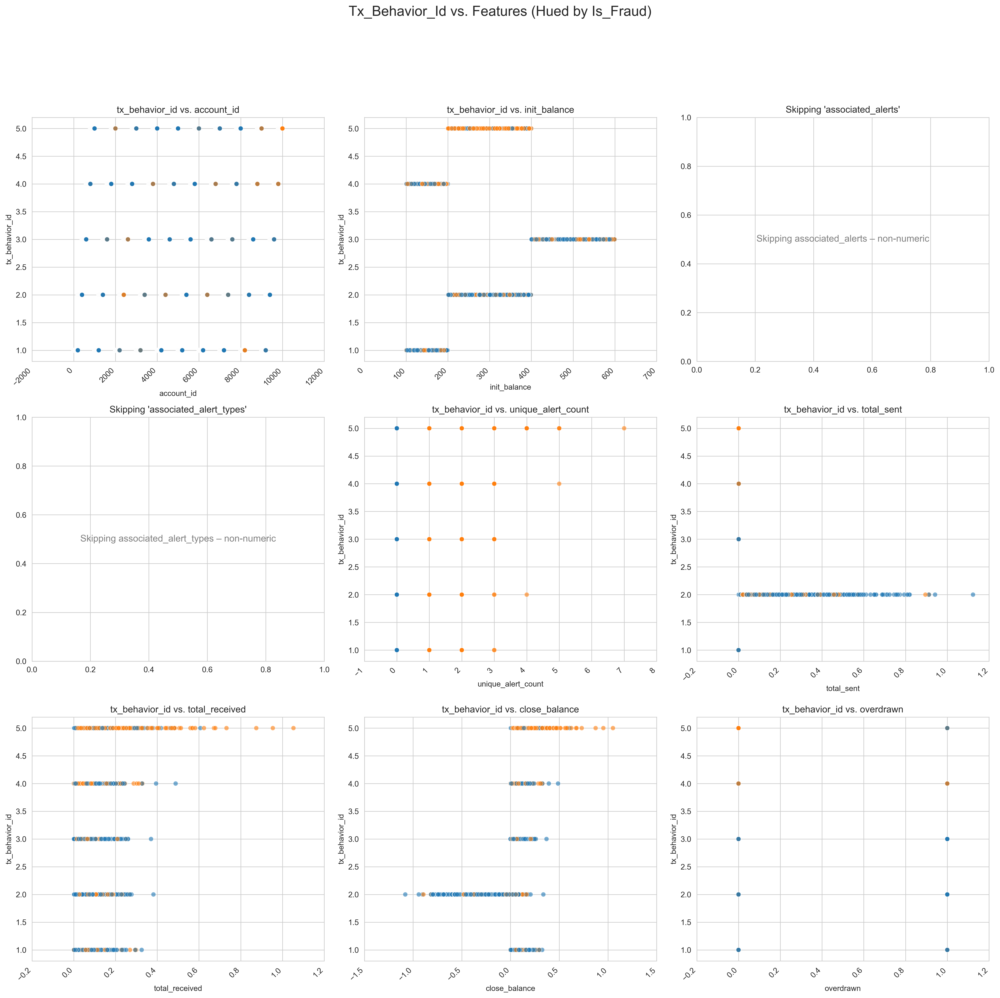

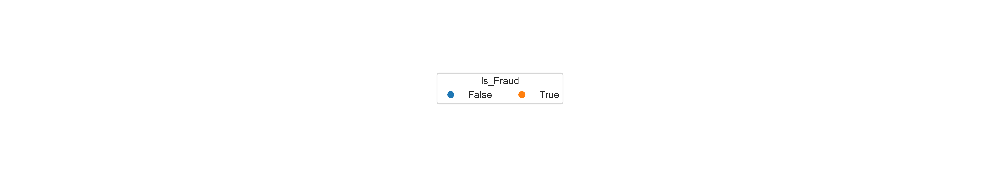

In [589]:
# --- 4.5 Visualise Feature Relationships ---

# Accounts
print(f"\n\n{'='*25} ACCOUNTS {'='*25}\n")

print("\n--- Behaviour ID & Fraud Flag ----")
plot_features_vs_target(
    df=accounts, 
    target_feature='tx_behavior_id', 
    hue_feature='is_fraud'
)

### <span style="color:red">Observations</span>

- behaviour_id is seemingly (at least partially) based on init_balance ranges:
- 1. 100 - 200
  2. 200 - 400
  3. 400 - 600
  4. 100 - 200
  5. 200 - 400
- behaviour_id starting balance groups were maybe created via repeating pattern? The graph looks like stacked staircases.
- behaviour_id group 5 has wayyyyy more fraud than the rest, but the same starting balance range as group 3. Could be a good test & control?



========================= ALERTED ACCOUNTS =========================


--- Financial Flow Based on Cycle Roles ----


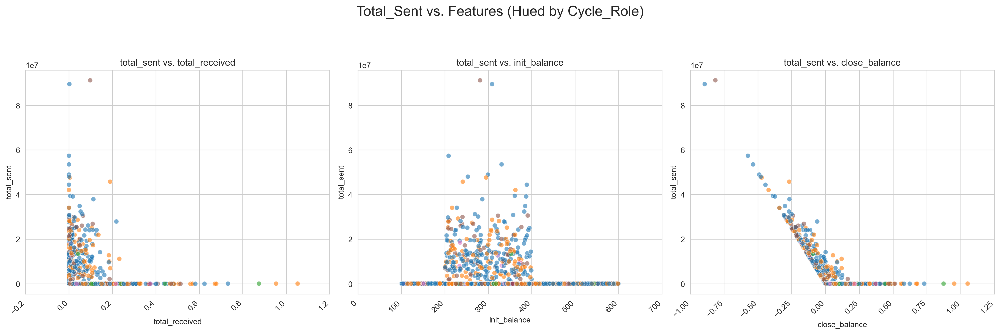

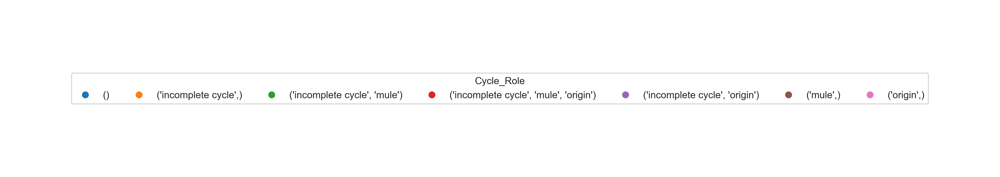


--- Alert Noise vs. True Fraud ----


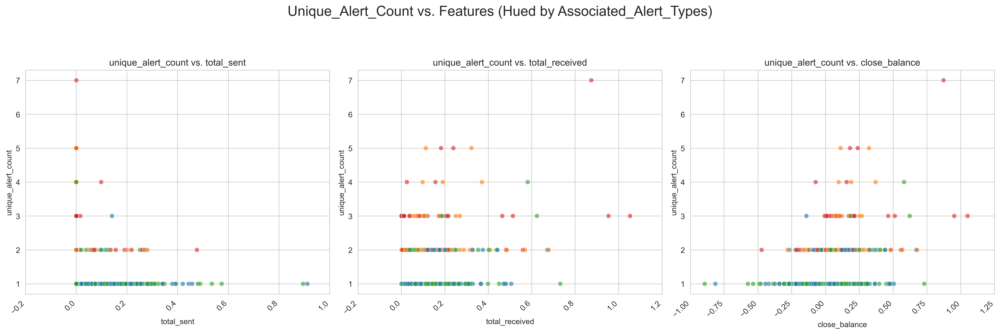

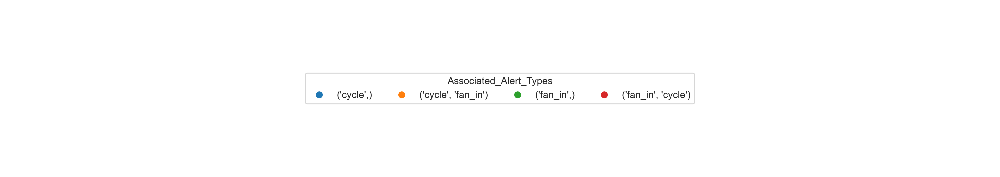


--- Account Depletion Check ----


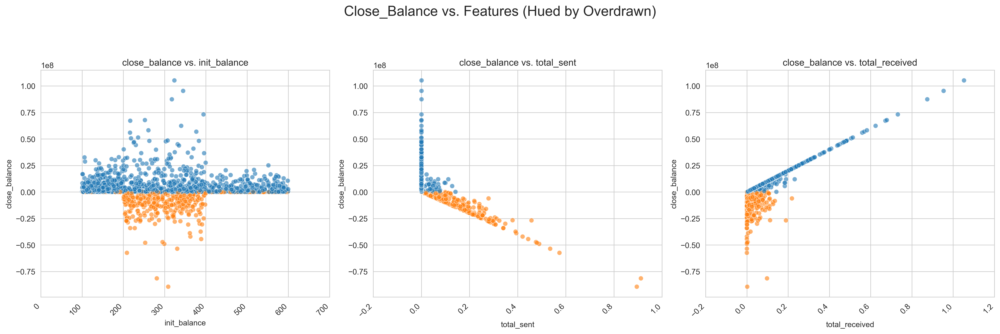

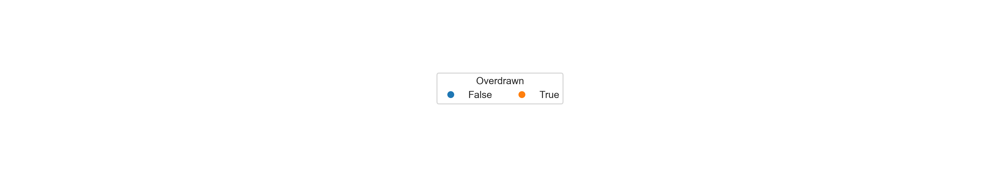

In [591]:
# Alerted Accounts
print(f"\n\n{'='*25} ALERTED ACCOUNTS {'='*25}\n")

print("\n--- Financial Flow Based on Cycle Roles ----")
plot_features_vs_target(
    df=alerted_accounts, 
    target_feature='total_sent', 
    hue_feature='cycle_role',
    comparison_features=['total_received', 'init_balance', 'close_balance']
)

print("\n--- Alert Noise vs. True Fraud ----")
plot_features_vs_target(
    df=alerted_accounts,
    target_feature='unique_alert_count',
    hue_feature='associated_alert_types',
    comparison_features=['total_sent', 'total_received', 'close_balance']
)

print("\n--- Account Depletion Check ----")
plot_features_vs_target(
    df=alerted_accounts,
    target_feature='close_balance',
    hue_feature='overdrawn',
    comparison_features=['init_balance', 'total_sent', 'total_received']
)

### <span style="color:red">Observations</span>

- Alerted accounts can be involved in more than one type of money laundering typology

NOTE: come back and fix with more justified variables. Currently just an educated guess.

### 5. Transactions Analysis

In [594]:
# --- 5.1 Create Credit & Debit Statements for Each Account ---

master_statement = create_master_statement(transactions, accounts) # see 1.7

print(f"Master Statement created with {len(master_statement)} ledger lines")
display(master_statement)

Master Statement created with 2097150 ledger lines


,account_id,timestamp,tx_id,tx_direction,counterparty_id,tx_amount,tx_value,init_balance,running_balance,is_fraud,alert_id
0,9999,0,74,IN,7072,12.94,12.94,317.65,330.59,False,-1
1,9999,0,120,IN,6049,12.10,12.10,317.65,342.69,False,-1
2,9999,0,262,IN,3611,111.29,111.29,317.65,453.98,False,-1
3,9999,0,1249,IN,8048,10.16,10.16,317.65,464.14,False,-1
4,9999,0,1296,IN,2636,116.77,116.77,317.65,580.91,False,-1
...,...,...,...,...,...,...,...,...,...,...,...
2097145,1,146,964418,OUT,884,175.80,-175.80,175.80,"-2,109.60",False,-1
2097146,1,148,977009,OUT,884,175.80,-175.80,175.80,"-2,285.40",False,-1
2097147,1,155,1029127,OUT,884,175.80,-175.80,175.80,"-2,461.20",False,-1
2097148,1,156,1035984,OUT,884,175.80,-175.80,175.80,"-2,637.00",False,-1


--- Visualising Timeline by Alert Status ---


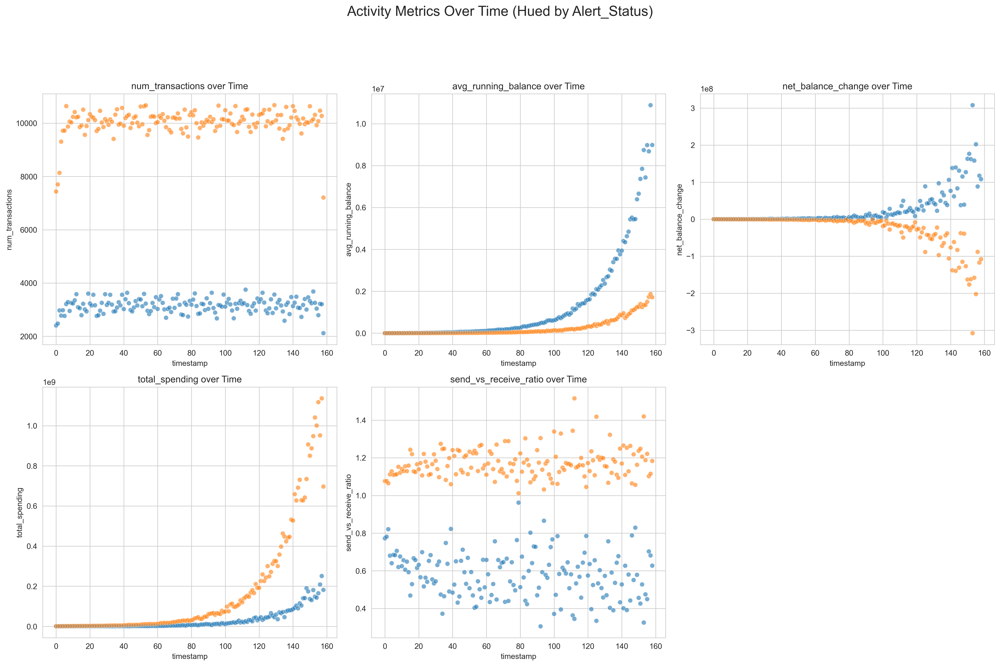

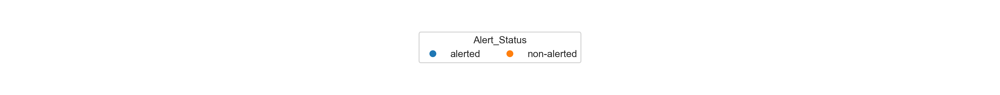


--- Visualising Timeline by Alert Type ---


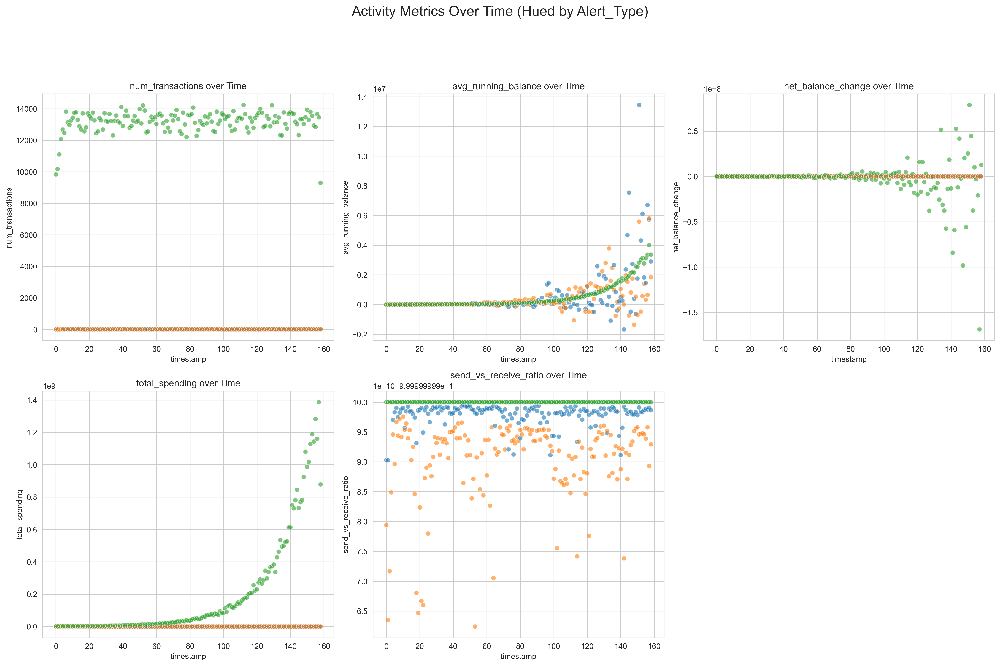

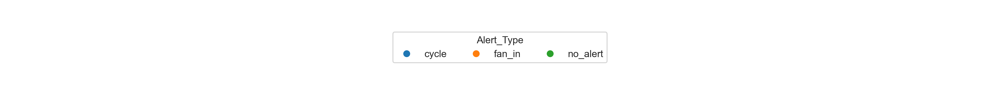


--- Visualising Timeline by Behaviour ID ---


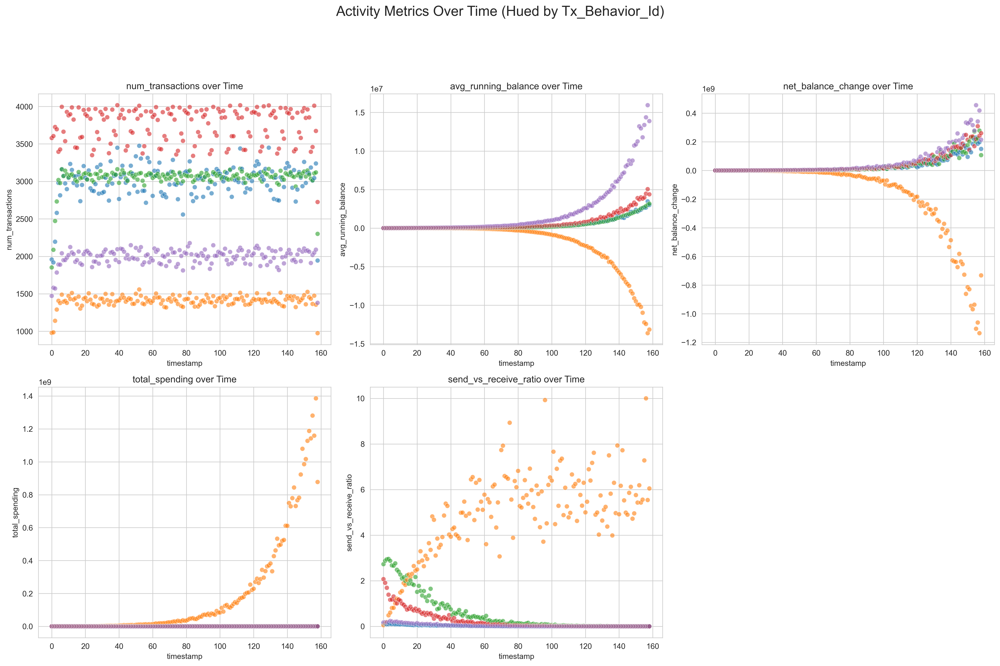

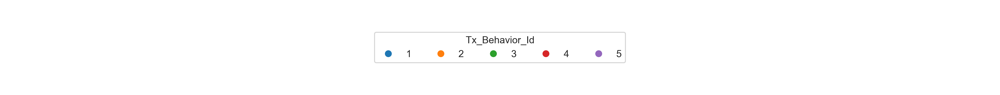

In [595]:
# --- 5.2 Visualise Transactions Activity Over Time ---
# NOTE: Combined Cells for clarity

# Set Standard Metrics
metrics_to_plot = [
    'num_transactions', 
    'avg_running_balance', 
    'net_balance_change', 
    'total_spending', 
    'send_vs_receive_ratio'
]

# --- Alerted vs Non-Alerted Accounts ---

# Add 'alert_status' to accounts df
if 'alert_status' not in accounts.columns:
    accounts['alert_status'] = accounts['unique_alert_count'].apply(
        lambda x: 'alerted' if x > 0 else 'non-alerted'
    )

print("--- Visualising Timeline by Alert Status ---")
# Generate the aggregated timeline dataset
timeline_data_status = prep_custom_timeline(
    master_statement=master_statement, 
    accounts_df=accounts, 
    alerts_df=alerts, 
    hue_feature='alert_status'
)

# Generate Ploys
plot_timeline(
    df=timeline_data_status,
    time_feature='timestamp',
    hue_feature='alert_status',
    comparison_features=metrics_to_plot
)

# --- Alert Type ---

print("\n--- Visualising Timeline by Alert Type ---")
alert_timeline = prep_custom_timeline(master_statement, accounts, alerts, hue_feature='alert_type')

# No Alert Filter
# alert_timeline = alert_timeline[alert_timeline['alert_type'] != 'no_alert']

plot_timeline(
    df=alert_timeline,
    time_feature='timestamp',
    hue_feature='alert_type',
    comparison_features=metrics_to_plot
)

# --- Behaviour ID ---

print("\n--- Visualising Timeline by Behaviour ID ---")
behavior_timeline = prep_custom_timeline(master_statement, accounts, alerts, hue_feature='tx_behavior_id')

plot_timeline(
    df=behavior_timeline,
    time_feature='timestamp',
    hue_feature='tx_behavior_id',
    comparison_features=metrics_to_plot
)

### <span style="color:red">Observations</span>

- Alerted (fraud) accounts have overall fewer transactions at any given timestamp than non-alerted accounts (purpose-built accounts?). The elvel of transactions holds steady for both over time.
- Each behaviour ID has a set level of transactions that remains consistent over time.
- Average running balance over time diverges for Behaviour ID & non-alerted accounts end up with an average higher balance, but cycle 'origin' accounts can be outliers who finish with very high balances (maybe filter for successful cycle frauds vs. non-successful)
- Alerted accounts net balance change is significantly higher over time, and aggresivel ramps up near the end where non-alrted accounts ramps down. Similar changes can be seen for behaviour ID, where 2 is an outlier that ramps down.
- Total spending over time is also much higher for behaviour ID group 2 and non-alerted accounts accelerate this much more aggresively than alerted accounts.
- Send:Rec ratio is much higher for non-alerted accounts than alerted accounts, but remains quite consistent for both over time.
- Behaviour ID group 2 shows an inverse behaviour to all other groups for their send:rec ratio, meaning they're doing more sending than receiving.

**Behaviour ID Group 2** may be the 'senders' part of the population and their size or aggresiveness is perhaps causing a skew in the population?

### 6. Population & Behaviour Group Analysis

In [598]:
print(wealth_summary_df.columns)

Index(['group', 'population_size', 'starting_wealth', 'final_wealth',
       'net_wealth_change', 'starting_debt', 'final_debt', 'accrued_debt',
       'starting_concentration_pct', 'final_concentration_pct',
       'sys_wealth_capture_pct'],
      dtype='object')


--- System Wealth Concentration ---


,group,population_size,starting_wealth,final_wealth,net_wealth_change,starting_debt,final_debt,accrued_debt,starting_concentration_pct,final_concentration_pct,sys_wealth_capture_pct
0,total_system,"10,000","$2,801,186.33","$2,801,186.33",$0.00,$0.00,"$-26,559,275,506.34","$-26,559,275,506.34",100.00%,100.00%,+0.00%
1,alert_status: alerted,"1,639","$456,502.69","$4,087,737,275.83","$4,087,280,773.14",$0.00,"$-3,703,398,310.58","$-3,703,398,310.58",16.30%,145928.79%,+145912.49%
2,alert_status: non-alerted,"8,361","$2,344,683.64","$-4,084,936,089.50","$-4,087,280,773.14",$0.00,"$-22,855,877,195.76","$-22,855,877,195.76",83.70%,-145828.79%,-145912.49%
3,behavior_id: 1.0,"2,000","$299,934.81","$4,897,844,101.78","$4,897,544,166.97",$0.00,"$-235,734.00","$-235,734.00",10.71%,174848.92%,+174838.21%
4,behavior_id: 2.0,"2,000","$601,860.07","$-25,607,430,169.17","$-25,608,032,029.24",$0.00,"$-26,523,010,338.17","$-26,523,010,338.17",21.49%,-914163.76%,-914185.24%
5,behavior_id: 3.0,"2,000","$1,001,355.93","$5,539,394,884.21","$5,538,393,528.28",$0.00,"$-29,551,735.61","$-29,551,735.61",35.75%,197751.75%,+197716.00%
6,behavior_id: 4.0,"2,000","$300,195.33","$6,330,817,415.33","$6,330,517,220.00",$0.00,"$-5,980,527.10","$-5,980,527.10",10.72%,226004.87%,+225994.15%
7,behavior_id: 5.0,"2,000","$597,840.19","$8,842,174,954.18","$8,841,577,113.99",$0.00,"$-497,171.46","$-497,171.46",21.34%,315658.22%,+315636.88%


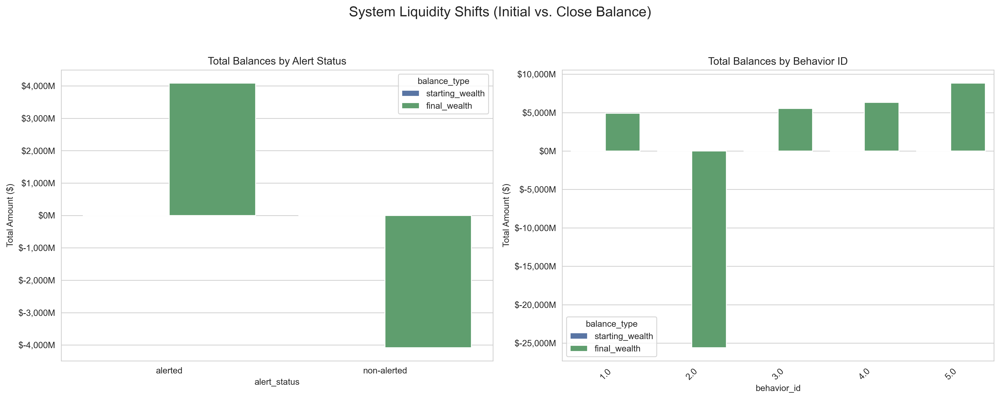

In [599]:
# --- 6.1 Wealth Concentration & Shifts ---

# Generate and display the formatted table
wealth_summary_df = generate_wealth_summary(accounts)

print("--- System Wealth Concentration ---")
# Using Pandas Styler for a clean financial readout (NOTE: maybe do this system-wide?)
display(wealth_summary_df.style.format({
    'population_size': "{:,.0f}",
    'starting_wealth': "${:,.2f}",
    'final_wealth': "${:,.2f}",
    'net_wealth_change': "${:,.2f}",
    'starting_debt': "${:,.2f}",
    'final_debt': "${:,.2f}",
    'accrued_debt': "${:,.2f}",
    'starting_concentration_pct': "{:.2f}%", # reminder: WEALTH concentration
    'final_concentration_pct': "{:.2f}%",
    'sys_wealth_capture_pct': "{:+.2f}%" 
}))

# Visualise Wealth Shifts
plot_balance_shifts(wealth_summary_df)

### <span style="color:red">Observations</span>

- ALL of the wealth (+ significant debt) flows from non-alerted accounts to alerted accounts.
- **This changes the context of this population: it's not a system of normal transactions with some fruad; it's ALL fraud-related**
- Given that the typologies are specific to money-laundering, does that make everyone a fraudster? Is everyone in on it in some way? Or is it fraud, then laundering the fraudulent cash? Or... is it just a quirk of the synthetic dataset? **Treat non-alerted as victims for now**
- Behaviour ID group 2 are even more suspect now. They're not just 'spenders', they might all be mules. Could even be account take-over (ATO) situations, but that's not really mentioned in the scope of the alerts. Not sure if I should dig for more complex fraud/laundering systems or stop here and try building a model.
- Each behaviour ID being split evenly population-wise means that the prior observed impacts from group 2 is entirely behaviouraly-driven.

In [601]:
# --- 6.2 Alert Typologies & Ratios ---

profile_behavior_groups(accounts)

# --- 6.3 Typology Role Breakdown by Behaviour ID ---

print('\n') # fix in function later
profile_typology_roles(alerted_accounts) # see 4.3

--- Population & Alert Ratios by Behavior ID ---


,Total Accounts,alerted,non-alerted,alerted (%),non-alerted (%)
tx_behavior_id,,,,,
1,2000,282,1718,14.10%,85.90%
2,2000,321,1679,16.05%,83.95%
3,2000,300,1700,15.00%,85.00%
4,2000,345,1655,17.25%,82.75%
5,2000,391,1609,19.55%,80.45%



--- Alert Type Breakdown (Alerted Accounts Only) ---


,cycle,fan_in,% triggered 'cycle',% triggered 'fan_in'
tx_behavior_id,,,,
1,147,148,52.13%,52.48%
2,176,164,54.83%,51.09%
3,159,164,53.00%,54.67%
4,179,186,51.88%,53.91%
5,211,231,53.96%,59.08%




--- Fan-In Roles by Behaviour ID ---


,sender,target,% 'sender',% 'target'
tx_behavior_id,,,,
1,86,28,30.50%,9.93%
2,107,21,33.33%,6.54%
3,101,27,33.67%,9.00%
4,123,35,35.65%,10.14%
5,152,42,38.87%,10.74%



--- Cycle Roles by Behavior ID ---


,incomplete cycle,mule,origin,% 'incomplete cycle',% 'mule',% 'origin'
tx_behavior_id,,,,,,
1,76,37,10,26.95%,13.12%,3.55%
2,91,46,5,28.35%,14.33%,1.56%
3,70,44,13,23.33%,14.67%,4.33%
4,92,44,15,26.67%,12.75%,4.35%
5,113,54,15,28.90%,13.81%,3.84%


### NOTE:

**The numbers for accounts involved in each alert type doesn't match between the 'accounts' and 'alerted_accounts' DFs.**

Almost certainly some dodgy code. I have a suspicion it's to do with the 'overlap method' used in section 4.3, but could also be something like badly handling NaN rows.

### 7. Prepare Master Datasets

In [604]:
# --- 7.1 Expand Accounts DF w/ Typology Data ---

# Merge Datasets
columns_to_merge = ['account_id', 'fan_in_role', 'cycle_role']
accounts_expanded = accounts.merge(
    alerted_accounts[columns_to_merge], 
    on='account_id', 
    how='left'
)

# Drop basic fraud marker
accounts_expanded.drop(columns='is_fraud', inplace=True)

# Parse strings back into lists (keep this func. here)
def safe_list_eval(x):
    # Keep existing list items
    if isinstance(x, list):
        return x
    
    # Replace NaNs with list
    if pd.isna(x):
        return []
        
    # Handle Strings
    if isinstance(x, str):
        x = x.strip()
        
        # If it's the literal string 'None' or empty, return empty list
        if x == 'None' or x == '':
            return []
            
        # Case A: It looks like a Python list string (e.g. "['mule']")
        if x.startswith('[') and x.endswith(']'):
            try:
                parsed = ast.literal_eval(x)
                return parsed if isinstance(parsed, list) else []
            except (ValueError, SyntaxError):
                pass # Fall through to string splitting if it fails
                
        # Case B: It's a plain string or comma-separated (e.g., "sender" or "mule, origin")
        # Split it by comma, clean up the whitespace, and make it a list
        return [item.strip() for item in x.split(',')]
        
    # Catch-all for anything else
    return []

# Apply Parser
for col in ['fan_in_role', 'cycle_role']:
    accounts_expanded[col] = accounts_expanded[col].apply(safe_list_eval)

print(f"accounts_expanded has {accounts_expanded.shape[1]} columns")
display(accounts_expanded)

# --- 7.2 Master Transactions Statement ---

# Created in 5.1
print(f"\nmaster_statement has {master_statement.shape[1]} columns")
display(master_statement)

accounts_expanded has 13 columns


,account_id,init_balance,tx_behavior_id,associated_alerts,associated_alert_types,unique_alert_count,total_sent,total_received,close_balance,overdrawn,alert_status,fan_in_role,cycle_role
0,0,184.44,1,[],[],0,0.00,0.00,184.44,False,non-alerted,[],[]
1,1,175.80,1,[],[],0,"2,988.60",0.00,"-2,812.80",True,non-alerted,[],[]
2,2,142.06,1,[],[],0,"1,846.65",0.00,"-1,704.59",True,non-alerted,[],[]
3,3,125.89,1,[],[],0,"1,510.56",245.34,"-1,139.33",True,non-alerted,[],[]
4,4,151.13,1,[],[],0,"2,266.95",0.00,"-2,115.82",True,non-alerted,[],[]
...,...,...,...,...,...,...,...,...,...,...,...,...,...
9995,9995,394.35,5,[13],[fan_in],1,"69,408.98","73,185,307.81","73,116,293.18",False,alerted,[],[]
9996,9996,344.98,5,"[41, 233, 243]","[fan_in, cycle]",3,"78,678.94","95,373,078.08","95,294,744.12",False,alerted,[],[]
9997,9997,260.85,5,"[29, 49, 187, 0]",[fan_in],4,"34,436.49","58,187,284.25","58,153,108.61",False,alerted,[],[]
9998,9998,323.79,5,"[34, 292, 159]","[fan_in, cycle]",3,"97,156.61","105,261,258.47","105,164,425.65",False,alerted,[],[]



master_statement has 11 columns


,account_id,timestamp,tx_id,tx_direction,counterparty_id,tx_amount,tx_value,init_balance,running_balance,is_fraud,alert_id
0,9999,0,74,IN,7072,12.94,12.94,317.65,330.59,False,-1
1,9999,0,120,IN,6049,12.10,12.10,317.65,342.69,False,-1
2,9999,0,262,IN,3611,111.29,111.29,317.65,453.98,False,-1
3,9999,0,1249,IN,8048,10.16,10.16,317.65,464.14,False,-1
4,9999,0,1296,IN,2636,116.77,116.77,317.65,580.91,False,-1
...,...,...,...,...,...,...,...,...,...,...,...
2097145,1,146,964418,OUT,884,175.80,-175.80,175.80,"-2,109.60",False,-1
2097146,1,148,977009,OUT,884,175.80,-175.80,175.80,"-2,285.40",False,-1
2097147,1,155,1029127,OUT,884,175.80,-175.80,175.80,"-2,461.20",False,-1
2097148,1,156,1035984,OUT,884,175.80,-175.80,175.80,"-2,637.00",False,-1


--- Data Imbalance Report ---
Total Accounts:  10,000
Non-Alerted (0): 8,361 (83.61%)
Alerted (1):     1,639 (16.39%)
Imbalance Ratio: 1 Alerted account for every 5 Non-Alerted accounts

--- Typology Breakdown (Alerted Accounts Only) ---
Alerted (Other)          : 1,639 (100.00%)


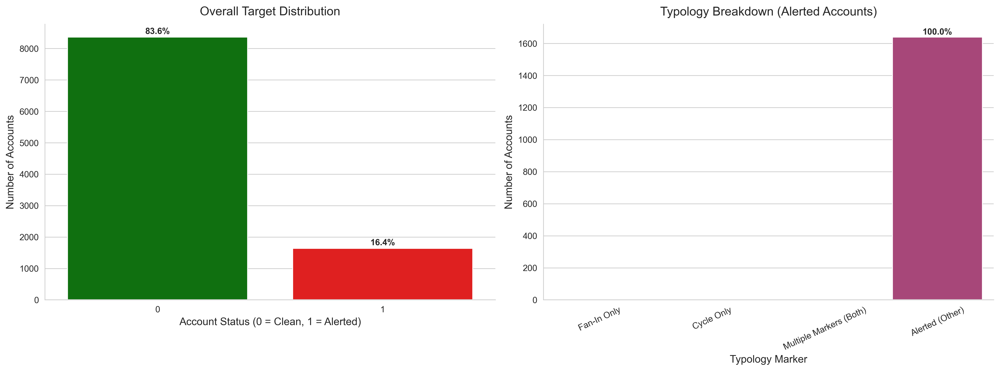

In [605]:
# --- 7.2 Check Data Imbalance by Alert & Typology ---

check_data_imbalance(accounts_expanded)

### <span style="color:red">Observations</span>

- There is only a moderarte imbalance in the data, which makes life a little easier.
- This could be a quick of the dataset, but maybe ties into the 'everything is fraud' stuff from ealrier somehow. Real-world bank fraud is <1% of transactions.

### NOTE:

**There is a problem in 7.1 where the typology columns aren't being populated correctly and I cannot figure out why. Fix later. (didn't fix – didn't need)**

## B. Baseline Model Development

### 8. Simple Regression Model

In [609]:
# --- 8.1 Logistic Regression Model Pipeline ---

def run_lr_model(
    df,
    list_columns,
    columns_to_drop, 
    test_size=0.2, 
    random_state=27, 
    lr_params=None,
    show_plots=True,   
    verbose=True       
):
    """
    Preprocesses data, scales features, trains a Logistic Regression model, 
    optimises the decision threshold, and outputs evaluation metrics and coefficients.

    Args:
        - df (pd.DataFrame): input dataset containing account and transaction features
        - list_columns (list): columns containing list objects to be encoded
        - columns_to_drop (list): columns to remove before training – prevents data leakage & drops identifiers
        - test_size (float, optional): proportion of the dataset to include in the test split
        - random_state (int, optional): RNG seed
        - lr_params (dict, optional): hyperparameters to pass to the model
        - show_plots (bool, optional): if True, renders the confusion matrix and feature weight visualisations
        - verbose (bool, optional): if True, prints pipeline progress, optimal threshold metrics, & the classification report
    
    Returns (tuple):
        - lr_model (sklearn LogisticRegression): the fully trained regression model
        - feature_names (list): final list of feature column names used for model training
        - best_threshold (float): the optimised probability threshold calculated to maximise F1-score
        - best_f1 (float): maximum F1-score achieved on the test set (using optimal threshold)
    """
    if verbose: print("--- Data Preprocessing & Scaling ---")
    ml_df = df.copy()

    # Define the Target Variable
    y = ml_df['alert_status'].map({'alerted': 1, 'non-alerted': 0})
    if y.isnull().any() and verbose:
        print("Warning: Some 'alert_status' values were not 'alerted' or 'non-alerted'")

    # Drop Data Leakage and Identifier Columns
    ml_df = ml_df.drop(columns=[col for col in columns_to_drop if col in ml_df.columns])

    # Encode List Columns
    for col in list_columns:
        if col in ml_df.columns:
            joined_strings = ml_df[col].apply(lambda x: '|'.join(map(str, x)) if isinstance(x, list) else '')
            dummies = joined_strings.str.get_dummies(sep='|').add_prefix(f"{col}_")
            ml_df = pd.concat([ml_df, dummies], axis=1).drop(columns=[col])

    # Encode Categorical Columns
    if 'tx_behavior_id' in ml_df.columns:
        ml_df['tx_behavior_id'] = ml_df['tx_behavior_id'].astype(str)
        behavior_dummies = pd.get_dummies(ml_df['tx_behavior_id'], prefix='behavior').astype(int)
        ml_df = pd.concat([ml_df, behavior_dummies], axis=1).drop(columns=['tx_behavior_id'])

    # Finalise Feature Matrix and FORCE float type
    X = ml_df.astype(float)
    feature_names = X.columns.tolist()
    
    if verbose:
        print(f"Feature Matrix (X) shape: {X.shape}")
        print(f"Target Vector (y) shape:  {y.shape}")
        print("\n--- Train/Test Split & Model Training ---")
    
    # Train/Test Split
    X_train, X_test, y_train, y_test = train_test_split(
        X, y, test_size=test_size, random_state=random_state, stratify=y
    )

    # Scaling (Mandatory for Logistic Regression)
    scaler = StandardScaler()
    X_train_scaled = scaler.fit_transform(X_train)
    X_test_scaled = scaler.transform(X_test)

    # Handle Model Parameters
    if lr_params is None:
        # max_iter=1000 gives the math engine plenty of time to converge
        # class_weight='balanced' helps counteract the 16% fraud imbalance
        lr_params = {'max_iter': 1000, 'random_state': random_state, 'class_weight': 'balanced'}
    elif 'random_state' not in lr_params:
        lr_params['random_state'] = random_state

    # Initialise & Train LR Model
    lr_model = LogisticRegression(**lr_params)
    lr_model.fit(X_train_scaled, y_train)

    # Output Probabilities
    y_probs = lr_model.predict_proba(X_test_scaled)[:, 1]
    if verbose: print("Model training complete")

    if verbose: print("\n--- Threshold Optimisation ---")
    precisions, recalls, thresholds = precision_recall_curve(y_test, y_probs)
    f1_scores = (2 * precisions[:-1] * recalls[:-1]) / (precisions[:-1] + recalls[:-1] + 1e-9)
    best_idx = np.argmax(f1_scores)
    best_threshold = thresholds[best_idx]
    best_f1 = f1_scores[best_idx]

    if verbose:
        print(f"Best Threshold: {best_threshold:.4f}")
        print(f"F1-Score:       {best_f1:.4f}")
        print(f"Precision:      {precisions[best_idx]:.4f}")
        print(f"Recall:         {recalls[best_idx]:.4f}")
        print("\n--- Final Evaluation ---")

    final_preds = (y_probs >= best_threshold).astype(int)
    
    if verbose:
        print("Classification Report:")
        print(classification_report(y_test, final_preds, target_names=['Clean (0)', 'Alerted (1)']))

    # Plots
    if show_plots:
        cm = confusion_matrix(y_test, final_preds)
        plt.figure(figsize=(6, 4))
        # Using Greens for LR to keep it distinct from RF (Blues) and GB (Oranges)
        sns.heatmap(cm, annot=True, fmt='d', cmap='Greens', cbar=False, 
                    xticklabels=['Predicted Clean', 'Predicted Alerted'],
                    yticklabels=['Actual Clean', 'Actual Alerted'])
        plt.title(f'Logistic Regression Confusion Matrix (Threshold = {best_threshold:.2f})')
        plt.tight_layout()
        plt.show()

        print("\n--- Check Feature Importance (Absolute Coefficients) ---")
        # Extract the absolute value of the mathematical weights
        importances = np.abs(lr_model.coef_[0])
        fi_df = pd.DataFrame({'Feature': feature_names, 'Importance': importances}).sort_values(by='Importance', ascending=False)
        
        print("Top 5 Features:")
        display(fi_df.head())

        plt.figure(figsize=(10, 6))
        sns.barplot(data=fi_df.head(10), x='Importance', y='Feature', hue='Feature', palette='crest', legend=False)
        plt.title('Logistic Regression Feature Weights', fontsize=14)
        plt.xlabel('Absolute Coefficient Value')
        plt.ylabel('Feature')
        sns.despine()
        plt.tight_layout()
        plt.show()
    
    return lr_model, feature_names, best_threshold, best_f1

--- Data Preprocessing & Scaling ---
Feature Matrix (X) shape: (10000, 10)
Target Vector (y) shape:  (10000,)

--- Train/Test Split & Model Training ---
Model training complete

--- Threshold Optimisation ---
Best Threshold: 0.5099
F1-Score:       0.3135
Precision:      0.2568
Recall:         0.4024

--- Final Evaluation ---
Classification Report:
              precision    recall  f1-score   support

   Clean (0)       0.87      0.77      0.82      1672
 Alerted (1)       0.26      0.40      0.31       328

    accuracy                           0.71      2000
   macro avg       0.56      0.59      0.57      2000
weighted avg       0.77      0.71      0.73      2000



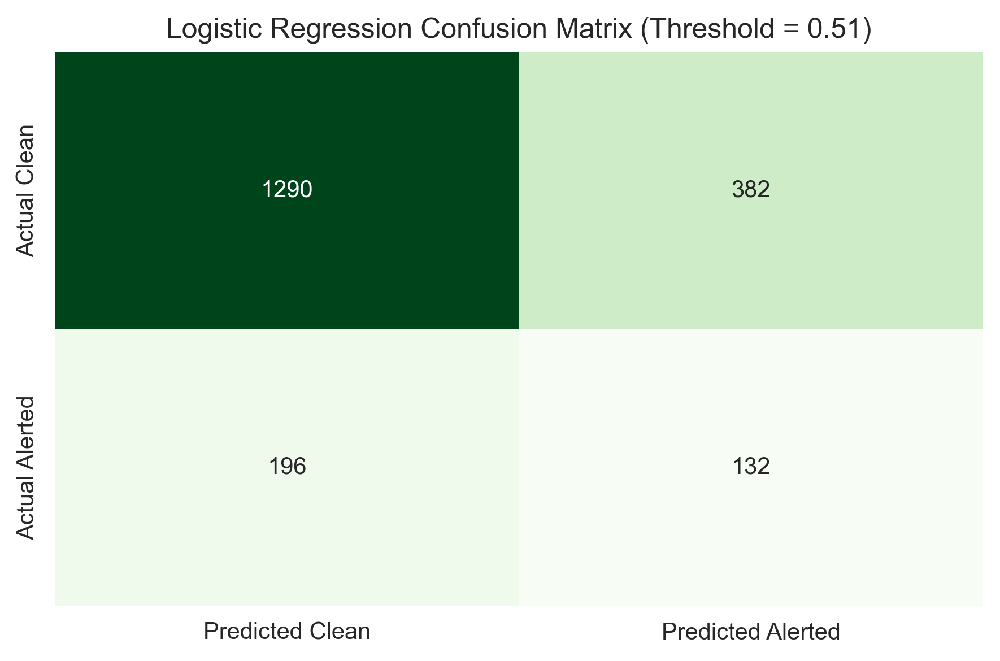


--- Check Feature Importance (Absolute Coefficients) ---
Top 5 Features:


,Feature,Importance
2,total_received,0.29
3,close_balance,0.12
5,behavior_1,0.11
4,overdrawn,0.11
0,init_balance,0.09


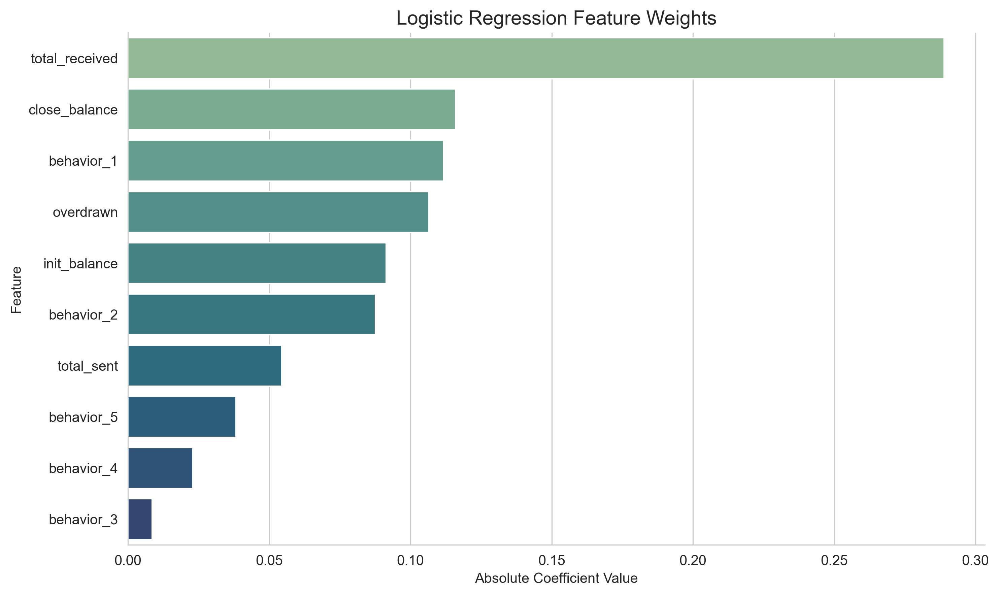

In [610]:
# --- 8.2 Logistic Regression Run 1 ---

# Standard LR Model Parameters
standard_lr_params = {
    'max_iter': 1000, 
    'class_weight': 'balanced', 
    'random_state': 27
}

# Columns containing lists
list_columns = ['fan_in_role', 'cycle_role']

# Columns to drop
run_1_drops = [
    'account_id', 'unique_alert_count', 'associated_alerts', 
    'alert_status', 'associated_alert_types', 'is_fraud'
]

model_lr_v1, features_lr_v1, thresh_lr_v1, f1_lr_v1 = run_lr_model(
    df=accounts_expanded,
    list_columns=list_columns,
    columns_to_drop=run_1_drops,
    test_size=0.2,
    lr_params=standard_lr_params,
    show_plots=True,
    verbose=True
)

### 9. Random Forest Model

In [612]:
# --- 9.1 Random Forest Model Pipeline ---

# Run RF Model
def run_rf_model(
    df,
    list_columns,
    columns_to_drop, 
    test_size=0.2, 
    random_state=27, 
    rf_params=None,
    show_plots=True,
    verbose=True
):
    """
    Preprocesses data, trains a Random Forest model, optimises the decision threshold,
    and outputs evaluation metrics and feature importances.

    Args:
        - df (pd.DataFrame): input dataset containing account and transaction features
        - list_columns (list): columns containing list objects to be encoded
        - columns_to_drop (list): columns to remove before training – prevents data leakage & drops identifiers
        - test_size (float, optional): proportion of the dataset to include in the test split
        - random_state (int, optional): RNG seed
        - lr_params (dict, optional): hyperparameters to pass to the model
        - show_plots (bool, optional): if True, renders the confusion matrix and feature weight visualisations
        - verbose (bool, optional): if True, prints pipeline progress, optimal threshold metrics, & the classification report
    
    Returns (tuple):
        - lr_model (sklearn LogisticRegression): the fully trained regression model
        - feature_names (list): final list of feature column names used for model training
        - best_threshold (float): the optimised probability threshold calculated to maximise F1-score
        - best_f1 (float): maximum F1-score achieved on the test set (using optimal threshold)
    """
    if verbose: print("--- Data Preprocessing ---")
    ml_df = df.copy()

    # Define the Target Variable (alert_status)
    y = ml_df['alert_status'].map({'alerted': 1, 'non-alerted': 0})
    if y.isnull().any() and verbose:
        print("Warning: Some 'alert_status' values were not 'alerted' or 'non-alerted'")

    # Drop Data Leakage & Identifier Columns
    ml_df = ml_df.drop(columns=[col for col in columns_to_drop if col in ml_df.columns])

    # Encode List Columns
    for col in list_columns:
        if col in ml_df.columns:
            joined_strings = ml_df[col].apply(lambda x: '|'.join(map(str, x)) if isinstance(x, list) else '')
            dummies = joined_strings.str.get_dummies(sep='|').add_prefix(f"{col}_")
            ml_df = pd.concat([ml_df, dummies], axis=1).drop(columns=[col])

    # Encode Categorical Columns
    if 'tx_behavior_id' in ml_df.columns:
        ml_df['tx_behavior_id'] = ml_df['tx_behavior_id'].astype(str)
        behavior_dummies = pd.get_dummies(ml_df['tx_behavior_id'], prefix='behavior').astype(int)
        ml_df = pd.concat([ml_df, behavior_dummies], axis=1).drop(columns=['tx_behavior_id'])

    # Finalise Feature Matrix
    X = ml_df
    
    if verbose:
        print(f"Feature Matrix (X) shape: {X.shape}")
        print(f"Target Vector (y) shape:  {y.shape}")
        print("\n--- Train/Test Split & Model Training ---")
    
    # Train/Test Split
    X_train, X_test, y_train, y_test = train_test_split(
        X, y, test_size=test_size, random_state=random_state, stratify=y
    )

    # Handle Model Parameters
    if rf_params is None:
        rf_params = {'n_estimators': 100, 'random_state': random_state, 'n_jobs': -1}
    elif 'random_state' not in rf_params:
        rf_params['random_state'] = random_state

    # Initialise & Train RF Model
    rf_model = RandomForestClassifier(**rf_params)
    rf_model.fit(X_train, y_train)

    # Output Probabilities
    y_probs = rf_model.predict_proba(X_test)[:, 1]
    if verbose: print("Model training complete")

    if verbose: print("\n--- Threshold Optimisation ---")
    precisions, recalls, thresholds = precision_recall_curve(y_test, y_probs)
    f1_scores = (2 * precisions[:-1] * recalls[:-1]) / (precisions[:-1] + recalls[:-1] + 1e-9)
    best_idx = np.argmax(f1_scores)
    best_threshold = thresholds[best_idx]
    best_f1 = f1_scores[best_idx]

    if verbose:
        print(f"Best Threshold: {best_threshold:.4f}")
        print(f"F1-Score:       {best_f1:.4f}")
        print(f"Precision:      {precisions[best_idx]:.4f}")
        print(f"Recall:         {recalls[best_idx]:.4f}")
        print("\n--- Final Evaluation ---")

    final_preds = (y_probs >= best_threshold).astype(int)
    
    if verbose:
        print("Classification Report:")
        print(classification_report(y_test, final_preds, target_names=['Clean (0)', 'Alerted (1)']))

    # Plots
    if show_plots:
        # Visualise the Confusion Matrix
        cm = confusion_matrix(y_test, final_preds)
        plt.figure(figsize=(6, 4))
        # Blue colours for RF model
        sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', cbar=False,
                    xticklabels=['Predicted Clean', 'Predicted Alerted'],
                    yticklabels=['Actual Clean', 'Actual Alerted'])
        plt.title(f'Confusion Matrix (Threshold = {best_threshold:.2f})')
        plt.tight_layout()
        plt.show()

        print("\n--- Check Feature Importance ---")
        importances = rf_model.feature_importances_
        features = X.columns
        fi_df = pd.DataFrame({'Feature': features, 'Importance': importances}).sort_values(by='Importance', ascending=False)
        
        print("Top 5 Features:")
        display(fi_df.head())

        plt.figure(figsize=(10, 6))
        sns.barplot(data=fi_df.head(10), x='Importance', y='Feature', hue='Feature', palette='viridis', legend=False)
        plt.title('Feature Importances', fontsize=14)
        plt.xlabel('Importance Score (0.0 to 1.0)')
        plt.ylabel('Feature')
        sns.despine()
        plt.tight_layout()
        plt.show()
    
    # Return the model, features, threshold, & best F1-score (for optuna)
    return rf_model, X.columns.tolist(), best_threshold, best_f1

# Optuna Optimisation Wrapper
def tune_and_run_rf(
    df, 
    list_columns, 
    columns_to_drop, 
    n_trials=30, 
    test_size=0.2, 
    random_state=27
):
    """
    Wraps the Optuna objective function so it can dynamically accept 
    different configurations.
    """
    
    def rf_objective(trial):
        """
        Optuna's objective function. Inherits df, list_columns, etc., from the outer scope.
        """
        rf_params = {
            'n_estimators': trial.suggest_int('n_estimators', 100, 500),
            'max_depth': trial.suggest_int('max_depth', 5, 40),
            'min_samples_split': trial.suggest_int('min_samples_split', 2, 20),
            'min_samples_leaf': trial.suggest_int('min_samples_leaf', 1, 10),
            'n_jobs': -1,
            'random_state': random_state
        }

        # Run silently during the search using the passed-in arguments
        model, features, thresh, f1 = run_rf_model(
            df=df,
            list_columns=list_columns,
            columns_to_drop=columns_to_drop,
            test_size=test_size,
            random_state=random_state,
            rf_params=rf_params,
            show_plots=False,  
            verbose=False      
        )

        return f1

    print("\nRunning Optuna Bayesian Optimisation for Random Forest")
    print("-" * 50)

    # Create the Study and run the optimisation
    rf_study = optuna.create_study(direction='maximize')
    rf_study.optimize(rf_objective, n_trials=n_trials)

    print("--- Optimisation Complete ---")
    print(f"\nBest F1-Score Achieved: {rf_study.best_value:.4f}")
    print("Optimal Parameters Found:")
    for key, value in rf_study.best_params.items():
        print(f"  > {key}: {value}")
    print("-" * 50)

    # Final model run with best parameters
    print("\n--- Running Final RF Model ---")
    
    # Extract the winning parameters and add back our static parameters
    best_rf_params = rf_study.best_params
    best_rf_params['random_state'] = random_state
    best_rf_params['n_jobs'] = -1

    # Run the function one last time w/ outputs on
    final_rf_model, final_rf_features, final_rf_thresh, final_rf_f1 = run_rf_model(
        df=df,
        list_columns=list_columns,
        columns_to_drop=columns_to_drop,
        test_size=test_size,
        random_state=random_state,
        rf_params=best_rf_params,
        show_plots=True,   
        verbose=True       
    )
    
    return final_rf_model, final_rf_features, final_rf_thresh, final_rf_f1


Running Optuna Bayesian Optimisation for Random Forest
--------------------------------------------------
--- Optimisation Complete ---

Best F1-Score Achieved: 0.3337
Optimal Parameters Found:
  > n_estimators: 110
  > max_depth: 5
  > min_samples_split: 3
  > min_samples_leaf: 5
--------------------------------------------------

--- Running Final RF Model ---
--- Data Preprocessing ---
Feature Matrix (X) shape: (10000, 10)
Target Vector (y) shape:  (10000,)

--- Train/Test Split & Model Training ---
Model training complete

--- Threshold Optimisation ---
Best Threshold: 0.1601
F1-Score:       0.3337
Precision:      0.2440
Recall:         0.5274

--- Final Evaluation ---
Classification Report:
              precision    recall  f1-score   support

   Clean (0)       0.88      0.68      0.77      1672
 Alerted (1)       0.24      0.53      0.33       328

    accuracy                           0.65      2000
   macro avg       0.56      0.60      0.55      2000
weighted avg       0.7

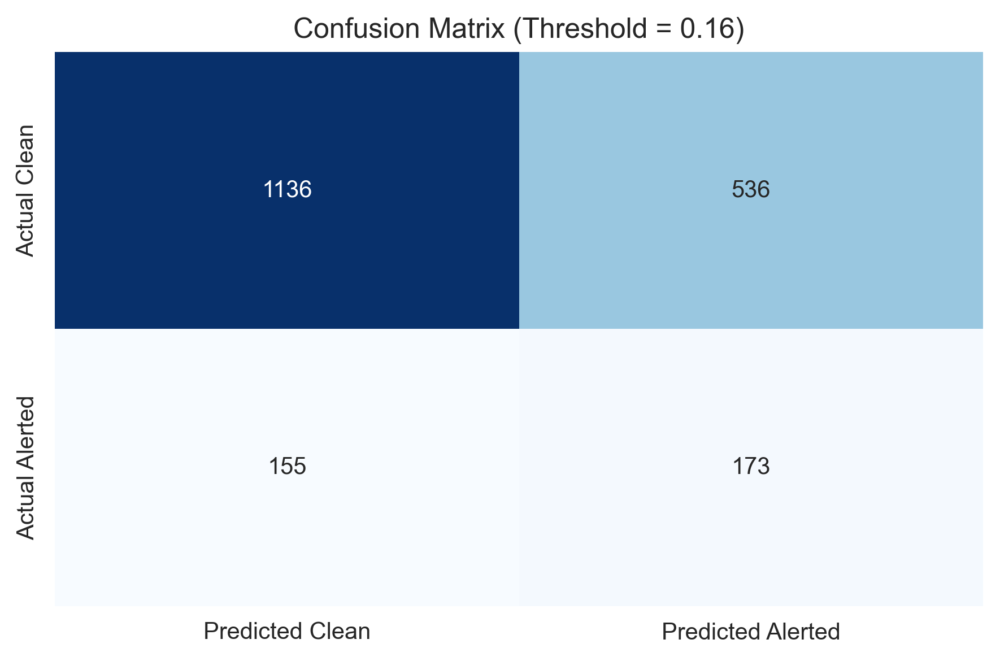


--- Check Feature Importance ---
Top 5 Features:


,Feature,Importance
2,total_received,0.29
3,close_balance,0.29
1,total_sent,0.21
0,init_balance,0.10
9,behavior_5,0.06


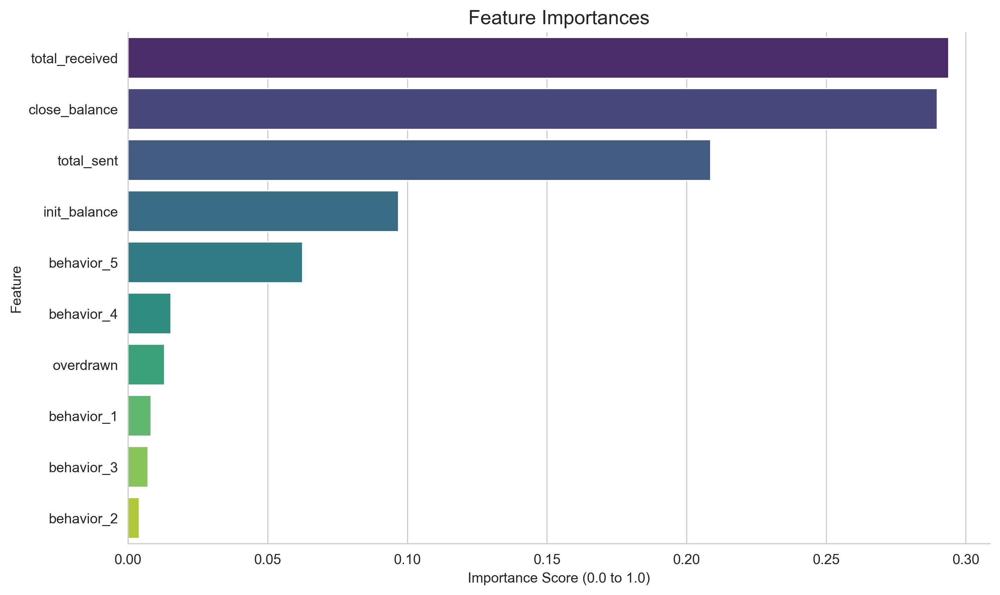

In [613]:
# --- 9.2 Optimised RF Run 1 ---

list_columns = ['fan_in_role', 'cycle_role']
run_1_drops = [
    'account_id', 'unique_alert_count', 'associated_alerts', 
    'alert_status', 'associated_alert_types', 'is_fraud'
]

model_rf, features_rf, thresh_rf, f1_rf = tune_and_run_rf(
    df=accounts_expanded,
    list_columns=list_columns,
    columns_to_drop=run_1_drops,
    n_trials=30
)

'accounts_expanded_2' has 13 columns


,account_id,init_balance,tx_behavior_id,associated_alerts,associated_alert_types,unique_alert_count,close_balance,overdrawn,alert_status,fan_in_role,cycle_role,associated_accounts,total_transactions,total_tx_received,total_tx_sent,total_money_received,total_money_sent,most_active_timestamp,accrued_debt
0,0,184.44,1,[],[],0,184.44,False,non-alerted,[],[],[],0.00,0.00,0.00,0.00,0.00,NaN,0.00
1,1,175.80,1,[],[],0,"-2,812.80",True,non-alerted,[],[],[884],17.00,0.00,17.00,0.00,"2,988.60",6.00,"-2,812.80"
2,2,142.06,1,[],[],0,"-1,704.59",True,non-alerted,[],[],[9356],13.00,0.00,13.00,0.00,"1,846.65",34.00,"-1,704.59"
3,3,125.89,1,[],[],0,"-1,139.33",True,non-alerted,[],[],"[9556, 4122]",30.00,18.00,12.00,245.34,"1,510.56",27.00,"-1,139.33"
4,4,151.13,1,[],[],0,"-2,115.82",True,non-alerted,[],[],[6083],15.00,0.00,15.00,0.00,"2,266.95",11.00,"-2,115.82"
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9995,9995,394.35,5,[13],[fan_in],1,"73,116,293.18",False,alerted,[],[],"[8621, 6693, 3055, 3070, 5116, 7041, 2169, 870...","1,522.00","1,345.00",177.00,"73,185,307.81","69,408.98",34.00,0.00
9996,9996,344.98,5,"[41, 233, 243]","[fan_in, cycle]",3,"95,294,744.12",False,alerted,[],[],"[8679, 2730, 1173, 9608, 9095, 9712, 3658, 161...","1,627.00","1,397.00",230.00,"95,373,078.08","78,678.94",88.00,0.00
9997,9997,260.85,5,"[29, 49, 187, 0]",[fan_in],4,"58,153,108.61",False,alerted,[],[],"[2747, 7616, 9674, 3725, 1667, 8630, 3051, 865...","1,600.00","1,467.00",133.00,"58,187,284.25","34,436.49",48.00,0.00
9998,9998,323.79,5,"[34, 292, 159]","[fan_in, cycle]",3,"105,164,425.65",False,alerted,[],[],"[6613, 5148, 658, 7003, 7652, 7778, 6152, 5147...","2,484.00","2,182.00",302.00,"105,261,258.47","97,156.61",32.00,0.00



Running Optuna Bayesian Optimisation for Random Forest
--------------------------------------------------
--- Optimisation Complete ---

Best F1-Score Achieved: 0.4077
Optimal Parameters Found:
  > n_estimators: 105
  > max_depth: 8
  > min_samples_split: 2
  > min_samples_leaf: 3
--------------------------------------------------

--- Running Final RF Model ---
--- Data Preprocessing ---
Feature Matrix (X) shape: (10000, 15)
Target Vector (y) shape:  (10000,)

--- Train/Test Split & Model Training ---
Model training complete

--- Threshold Optimisation ---
Best Threshold: 0.1744
F1-Score:       0.4077
Precision:      0.3146
Recall:         0.5793

--- Final Evaluation ---
Classification Report:
              precision    recall  f1-score   support

   Clean (0)       0.90      0.75      0.82      1672
 Alerted (1)       0.31      0.58      0.41       328

    accuracy                           0.72      2000
   macro avg       0.61      0.67      0.61      2000
weighted avg       0.8

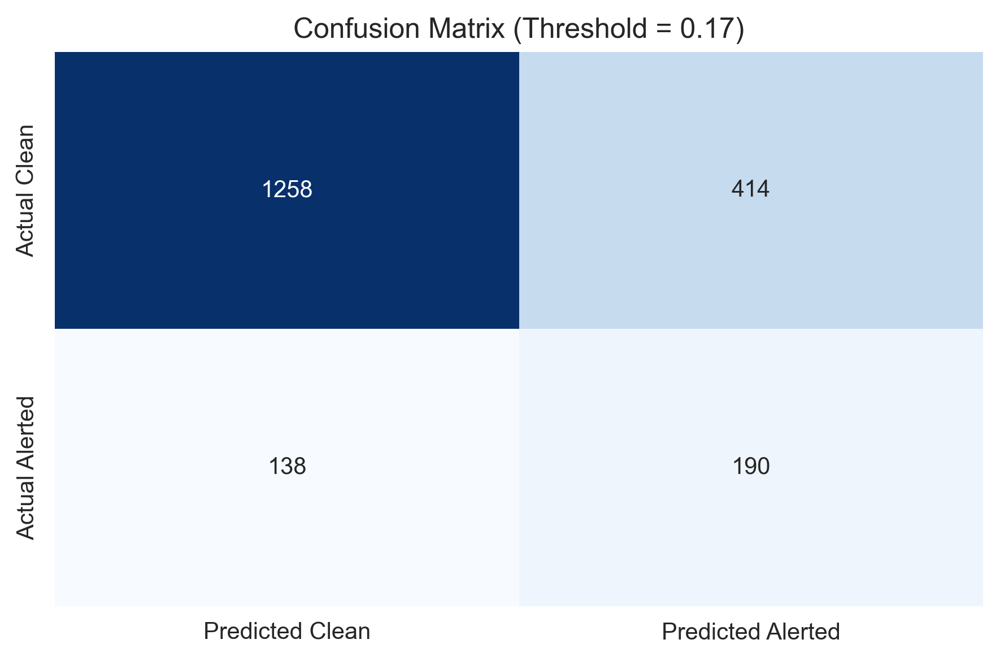


--- Check Feature Importance ---
Top 5 Features:


,Feature,Importance
5,total_tx_sent,0.17
4,total_tx_received,0.15
3,total_transactions,0.14
6,total_money_received,0.12
1,close_balance,0.11


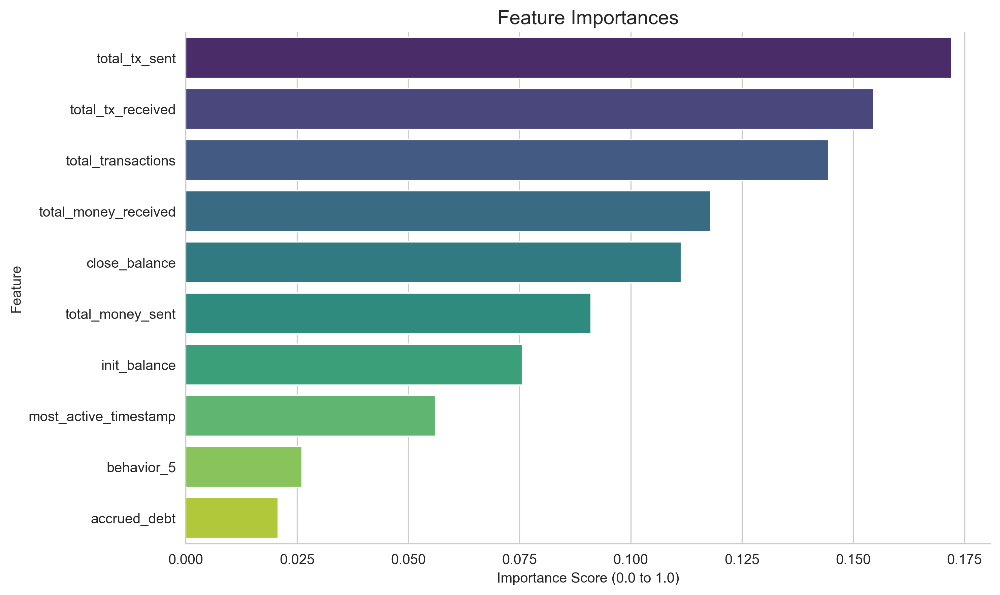

In [614]:
# --- 9.3 Optimised RF Run 2 ---
"""
Add a set of new features extrapolated from master_statement to
accounts_expanded.
"""
# --- Run 2 Setup ---

# Group by account_id and calculate the new metrics
# Use tx_value because positive means received and negative means sent
tx_metrics = master_statement.groupby('account_id').agg(
    associated_accounts=('counterparty_id', lambda x: list(x.dropna().unique())),
    total_transactions=('tx_id', 'count'),
    total_tx_received=('tx_value', lambda x: (x > 0).sum()),
    total_tx_sent=('tx_value', lambda x: (x < 0).sum()),
    
    # Use .abs() on sent money so it returns a positive total rather than a negative sum
    total_money_received=('tx_value', lambda x: x[x > 0].sum()),
    total_money_sent=('tx_value', lambda x: x[x < 0].abs().sum()),
    
    # .mode() finds the most frequent value. [0] grabs the top one if there's a tie.
    most_active_timestamp=('timestamp', lambda x: x.mode()[0] if not x.mode().empty else np.nan)
).reset_index()

# Merge the new metrics into accounts_expanded (& drop dupes)
cols_to_drop = [c for c in ['total_sent', 'total_received'] if c in accounts_expanded.columns]
accounts_expanded_2 = accounts_expanded.drop(columns=cols_to_drop)
accounts_expanded_2 = accounts_expanded_2.merge(tx_metrics, on='account_id', how='left')

# Calculate Accrued Debt
# .clip(upper=0) ignores any positive balances (setting them to 0) so we only measure actual debt.
accounts_expanded_2['accrued_debt'] = (
    accounts_expanded_2['close_balance'].clip(upper=0) - 
    accounts_expanded_2['init_balance'].clip(upper=0)
)

# Handle accounts with zero transactions (NaN fill)
accounts_expanded_2['associated_accounts'] = accounts_expanded_2['associated_accounts'].apply(lambda x: x if isinstance(x, list) else [])
fill_zero_cols = ['total_transactions', 'total_tx_received', 'total_tx_sent', 'total_money_received', 'total_money_sent', 'accrued_debt']
accounts_expanded_2[fill_zero_cols] = accounts_expanded_2[fill_zero_cols].fillna(0)

print(f"'accounts_expanded_2' has {accounts_expanded.shape[1]} columns")
display(accounts_expanded_2)

# --- Execute Run 2 ---

list_columns_2 = ['fan_in_role', 'cycle_role',]
run_2_drops = [
    'account_id', 'unique_alert_count', 'associated_alerts', 
    'alert_status', 'associated_alert_types', 'is_fraud', 'associated_accounts'
]

model_rf, features_rf, thresh_rf, f1_rf = tune_and_run_rf(
    df=accounts_expanded_2,
    list_columns=list_columns_2,
    columns_to_drop=run_2_drops,
    n_trials=30
)

### 10. RF Network Risk Propagation Model

In [616]:
# --- 10.1 RF Network Risk Propagation Pipeline ---

def run_rfnrp_model(
    df,
    list_columns,
    columns_to_drop, 
    pass_1_threshold=0.90, 
    test_size=0.2, 
    random_state=27, 
    rf_params=None,
    show_plots=True,
    verbose=True,
    abort_if_no_anchors=False,   
    min_anchors=5                
):
    """
    Executes a 2-pass Graph Machine Learning pipeline. 
    Pass 1: Identifies high-confidence 'Anchor' accounts.
    Pass 2: Propagates risk to connected accounts and retrains.

    Args:
        - df (pd.DataFrame): input dataset containing account and transaction features
        - list_columns (list): columns containing list objects to be encoded
        - columns_to_drop (list): columns to remove before training – prevents data leakage & drops identifiers
        - pass_1_threshold (float, optional): probability threshold for an account to be flagged as an anchor
        - test_size (float, optional): proportion of the dataset to include in the test split
        - random_state (int, optional): RNG seed
        - rf_params (dict, optional): hyperparameters to pass to the model
        - show_plots (bool, optional): if True, renders the confusion matrix and feature importance visualisations
        - verbose (bool, optional): if True, prints pipeline progress, optimal threshold metrics, & the classification report
        - abort_if_no_anchors (bool, optional): if True, terminates the function early if minimum anchors aren't found
        - min_anchors (int, optional): minimum required anchors to proceed to pass 2
    
    Returns (tuple):
        - pass_1_model (sklearn RandomForestClassifier): the fully trained Pass 1 anchor model
        - pass_2_model (sklearn RandomForestClassifier): the fully trained Pass 2 contextual model (None if aborted)
        - feature_names (list): final list of feature column names used for Pass 2 training (None if aborted)
        - best_threshold (float): the optimised probability threshold calculated to maximise F1-score (None if aborted)
        - best_f1 (float): maximum F1-score achieved on the test set (0.0 if aborted)
    """
    if verbose: print(f"--- Starting Multi-Pass Pipeline (Pass 1 Threshold: {pass_1_threshold:.2f}) ---")
    
    ml_df = df.copy()
    y = ml_df['alert_status'].map({'alerted': 1, 'non-alerted': 0})
    network_meta = ml_df[['account_id', 'associated_accounts']].copy()
    
    drop_list = columns_to_drop + ['account_id', 'associated_accounts']
    ml_df = ml_df.drop(columns=[col for col in drop_list if col in ml_df.columns])

    for col in list_columns:
        if col in ml_df.columns:
            joined_strings = ml_df[col].apply(lambda x: '|'.join(map(str, x)) if isinstance(x, list) else '')
            dummies = joined_strings.str.get_dummies(sep='|').add_prefix(f"{col}_")
            ml_df = pd.concat([ml_df, dummies], axis=1).drop(columns=[col])

    if 'tx_behavior_id' in ml_df.columns:
        ml_df['tx_behavior_id'] = ml_df['tx_behavior_id'].astype(str)
        behavior_dummies = pd.get_dummies(ml_df['tx_behavior_id'], prefix='behavior').astype(int)
        ml_df = pd.concat([ml_df, behavior_dummies], axis=1).drop(columns=['tx_behavior_id'])

    X_train_base, X_test_base, y_train, y_test, meta_train, meta_test = train_test_split(
        ml_df, y, network_meta, test_size=test_size, random_state=random_state, stratify=y
    )

    if rf_params is None:
        rf_params = {'n_estimators': 100, 'random_state': random_state, 'n_jobs': -1}

    # PASS 1: Anchor Model
    if verbose: print("\n[Pass 1] Training model to identify anchors")
    pass_1_model = RandomForestClassifier(**rf_params)
    pass_1_model.fit(X_train_base, y_train)

    train_probs = pass_1_model.predict_proba(X_train_base)[:, 1]
    test_probs = pass_1_model.predict_proba(X_test_base)[:, 1]

    train_anchors = set(meta_train[train_probs >= pass_1_threshold]['account_id'])
    test_anchors = set(meta_test[test_probs >= pass_1_threshold]['account_id'])
    all_known_anchors = train_anchors.union(test_anchors)
    
    if verbose:
        print(f"{ind}> [Pass 1] Found {len(train_anchors)} Anchors in Training set")
        print(f"{ind}> [Pass 1] Found {len(test_anchors)} Anchors in Testing set")

    # Abort Logic
    if abort_if_no_anchors and len(train_anchors) < min_anchors:
        if verbose: print(f"ABORTING PASS 2: Only {len(train_anchors)} anchors found (Minimum required: {min_anchors})")
        return pass_1_model, None, None, None, 0.0

    # NRP Logic
    if verbose: print("\n[Network Step] Propagating risk to associated accounts")
    
    def count_anchors(associated_list, anchor_set):
        if not isinstance(associated_list, list): return 0
        return len(set(associated_list).intersection(anchor_set))

    X_train_pass2 = X_train_base.copy()
    X_train_pass2['high_risk_connections'] = meta_train['associated_accounts'].apply(lambda x: count_anchors(x, train_anchors))

    X_test_pass2 = X_test_base.copy()
    X_test_pass2['high_risk_connections'] = meta_test['associated_accounts'].apply(lambda x: count_anchors(x, all_known_anchors))
    
    train_infections = (X_train_pass2['high_risk_connections'] > 0).sum()
    if verbose: print(f"[Network Step] {train_infections} training accounts flagged by association.")

    # PASS 2: Contextual Model
    if verbose: print("\n[Pass 2] Re-training model with network Context")
    pass_2_model = RandomForestClassifier(**rf_params)
    pass_2_model.fit(X_train_pass2, y_train)

    y_probs_pass2 = pass_2_model.predict_proba(X_test_pass2)[:, 1]

    precisions, recalls, thresholds = precision_recall_curve(y_test, y_probs_pass2)
    f1_scores = (2 * precisions[:-1] * recalls[:-1]) / (precisions[:-1] + recalls[:-1] + 1e-9)
    best_idx = np.argmax(f1_scores)
    best_threshold = thresholds[best_idx]
    best_f1 = f1_scores[best_idx]

    if verbose:
        print(f"\n--- Pass 2 Optimal Threshold: {best_threshold:.4f} ---")
        print(f"F1-Score:  {best_f1:.4f}")
        print(f"Precision: {precisions[best_idx]:.4f}")
        print(f"Recall:    {recalls[best_idx]:.4f}")

    final_preds = (y_probs_pass2 >= best_threshold).astype(int)

    # Plots
    if show_plots:
        cm = confusion_matrix(y_test, final_preds)
        plt.figure(figsize=(6, 4))
        sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', cbar=False,
                    xticklabels=['Predicted Clean', 'Predicted Alerted'],
                    yticklabels=['Actual Clean', 'Actual Alerted'])
        plt.title(f'Pass 2 Confusion Matrix (Threshold = {best_threshold:.2f})')
        plt.tight_layout()
        plt.show()

        importances = pass_2_model.feature_importances_
        fi_df = pd.DataFrame({'Feature': X_train_pass2.columns, 'Importance': importances})
        fi_df = fi_df.sort_values(by='Importance', ascending=False)
        
        print("--- Pass 2 Feature Importances ---")
        display(fi_df.head(6))

    return pass_1_model, pass_2_model, X_train_pass2.columns.tolist(), best_threshold, best_f1


# --- Optuna Optimisation Wrapper ---

def tune_and_run_rfnrp(
    df, 
    list_columns, 
    columns_to_drop, 
    n_trials=30, 
    min_anchors=5,
    test_size=0.2,
    random_state=27
):
    """
    Wraps the Optuna objective function so it can dynamically accept 
    different configurations for the silent model runs.
    """
    
    def rfnrp_objective(trial):
        # Tune the tree architecture
        rf_params = {
            'n_estimators': trial.suggest_int('n_estimators', 100, 500),
            'max_depth': trial.suggest_int('max_depth', 5, 40),
            'min_samples_split': trial.suggest_int('min_samples_split', 2, 20),
            'min_samples_leaf': trial.suggest_int('min_samples_leaf', 1, 10),
            'n_jobs': -1,
            'random_state': random_state
        }
        
        # Tune the anchor threshold aggressively (forcing it to find valid networks)
        dynamic_pass_1_threshold = trial.suggest_float('pass_1_threshold', 0.50, 0.95)

        # Run silently, but abort if it doesn't find enough anchors
        p1, p2, feats, thresh, f1 = run_rfnrp_model(
            df=df,
            list_columns=list_columns,
            columns_to_drop=columns_to_drop,
            pass_1_threshold=dynamic_pass_1_threshold,
            test_size=test_size,
            random_state=random_state,
            rf_params=rf_params,
            show_plots=False,  
            verbose=False,
            abort_if_no_anchors=True,  
            min_anchors=min_anchors    
        )

        return f1

    print("\nRunning Smart Optuna Search for RF Network Model")
    print("Trials with weak networks will be automatically aborted")
    print("-" * 50)

    # Run the optimisation
    rfnrp_study = optuna.create_study(direction='maximize')
    rfnrp_study.optimize(rfnrp_objective, n_trials=n_trials)

    print("--- Optimisation Complete ---")
    print(f"\nBest Final F1-Score Achieved: {rfnrp_study.best_value:.4f}")
    
    print("Optimal Parameters Found:")
    for key, value in rfnrp_study.best_params.items():
        print(f"  > {key}: {value}")
    print("-" * 50)

    # Final verbose run with best parameters
    print("\n--- Running Final RF Network Model ---")

    best_rfnrp_params = rfnrp_study.best_params
    best_pass_1_thresh = best_rfnrp_params.pop('pass_1_threshold')
    
    best_rfnrp_params['random_state'] = random_state
    best_rfnrp_params['n_jobs'] = -1

    # Run one last time with all visuals and no aborts
    final_p1, final_p2, final_feats, final_thresh, final_f1 = run_rfnrp_model(
        df=df,
        list_columns=list_columns,
        columns_to_drop=columns_to_drop,
        pass_1_threshold=best_pass_1_thresh,
        test_size=test_size,
        random_state=random_state,
        rf_params=best_rfnrp_params,
        show_plots=True,   
        verbose=True,
        abort_if_no_anchors=False  
    )
    
    return final_p1, final_p2, final_feats, final_thresh, final_f1


Running Smart Optuna Search for RF Network Model
Trials with weak networks will be automatically aborted
--------------------------------------------------
--- Optimisation Complete ---

Best Final F1-Score Achieved: 0.4201
Optimal Parameters Found:
  > n_estimators: 356
  > max_depth: 8
  > min_samples_split: 4
  > min_samples_leaf: 3
  > pass_1_threshold: 0.6150680866921289
--------------------------------------------------

--- Running Final RF Network Model ---
--- Starting Multi-Pass Pipeline (Pass 1 Threshold: 0.62) ---

[Pass 1] Training model to identify anchors
   > [Pass 1] Found 101 Anchors in Training set
   > [Pass 1] Found 14 Anchors in Testing set

[Network Step] Propagating risk to associated accounts
[Network Step] 3235 training accounts flagged by association.

[Pass 2] Re-training model with network Context

--- Pass 2 Optimal Threshold: 0.1852 ---
F1-Score:  0.4201
Precision: 0.3403
Recall:    0.5488


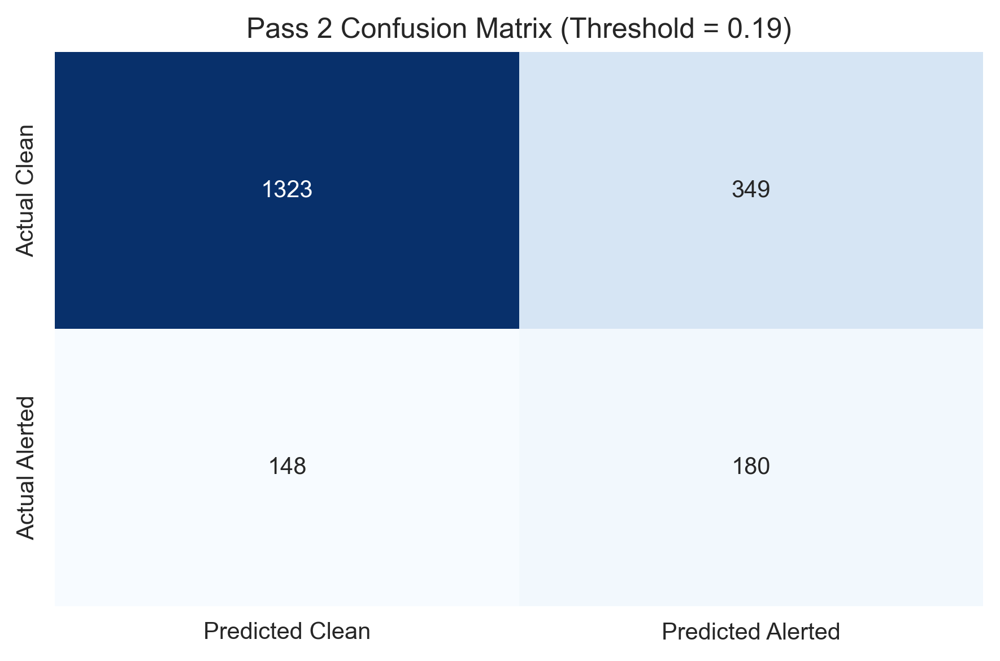

--- Pass 2 Feature Importances ---


,Feature,Importance
5,total_tx_sent,0.16
4,total_tx_received,0.15
3,total_transactions,0.13
6,total_money_received,0.11
1,close_balance,0.10
7,total_money_sent,0.09


In [617]:
# --- 10.2 RF NRP Run ---

list_cols = ['fan_in_role', 'cycle_role', 'associated_accounts']
drop_cols = ['unique_alert_count', 'associated_alerts', 'alert_status', 'associated_alert_types', 'is_fraud']

# Catch the 5 variables now returned by the updated wrapper
model_p1, model_p2, final_feats, final_thresh, final_f1_score = tune_and_run_rfnrp(
    df=accounts_expanded_2,
    list_columns=list_cols,
    columns_to_drop=drop_cols,
    n_trials=30,
    min_anchors=10
)

### 11. Gradient Boosting Model

**NOTE:** XGBoost has an issue with MacOS that causes the kernel to die. It's not a Python problem, but actually in the underlying C++ code of the package. I don't have the skill or time to look into fixing that. Scikit-Learn has it's own gradient booster which works off the same principles – I will use this instead.

In [619]:
# --- 11.1 Gradient Boosting Model Pipeline ---

def run_gb_model(
    df,
    list_columns,
    columns_to_drop, 
    test_size=0.2, 
    random_state=27, 
    gb_params=None,
    show_plots=True,
    verbose=True
):
    """
    Preprocesses data, trains a HistGradientBoosting model, optimises the decision threshold,
    and outputs evaluation metrics and permutation feature importances.

    Args:
        - df (pd.DataFrame): input dataset containing account and transaction features
        - list_columns (list): columns containing list objects to be encoded
        - columns_to_drop (list): columns to remove before training – prevents data leakage & drops identifiers
        - test_size (float, optional): proportion of the dataset to include in the test split
        - random_state (int, optional): RNG seed
        - gb_params (dict, optional): hyperparameters to pass to the model
        - show_plots (bool, optional): if True, renders the confusion matrix and feature importance visualisations
        - verbose (bool, optional): if True, prints pipeline progress, optimal threshold metrics, & the classification report
    
    Returns (tuple):
        - gb_model (sklearn HistGradientBoostingClassifier): the fully trained Gradient Boosting model
        - feature_names (list): final list of feature column names used for model training
        - best_threshold (float): the optimised probability threshold calculated to maximise F1-score
        - best_f1 (float): maximum F1-score achieved on the test set (using optimal threshold)
    """
    if verbose: print("--- Data Preprocessing ---")
    ml_df = df.copy()

    # Define the Target Variable
    y = ml_df['alert_status'].map({'alerted': 1, 'non-alerted': 0})

    # Drop Data Leakage and Identifier Columns
    ml_df = ml_df.drop(columns=[col for col in columns_to_drop if col in ml_df.columns])

    # Encode List Columns
    for col in list_columns:
        if col in ml_df.columns:
            joined_strings = ml_df[col].apply(lambda x: '|'.join(map(str, x)) if isinstance(x, list) else '')
            dummies = joined_strings.str.get_dummies(sep='|').add_prefix(f"{col}_")
            ml_df = pd.concat([ml_df, dummies], axis=1).drop(columns=[col])

    # Encode Categorical Columns
    if 'tx_behavior_id' in ml_df.columns:
        ml_df['tx_behavior_id'] = ml_df['tx_behavior_id'].astype(str)
        behavior_dummies = pd.get_dummies(ml_df['tx_behavior_id'], prefix='behavior').astype(int)
        ml_df = pd.concat([ml_df, behavior_dummies], axis=1).drop(columns=['tx_behavior_id'])

    # Finalise Feature Matrix and FORCE float type
    X = ml_df.astype(float)
    
    if verbose:
        print(f"Feature Matrix (X) shape: {X.shape}")
        print(f"Target Vector (y) shape:  {y.shape}")
        print("\n--- Train/Test Split & Model Training ---")
    
    X_train, X_test, y_train, y_test = train_test_split(
        X, y, test_size=test_size, random_state=random_state, stratify=y
    )

    if gb_params is None:
        gb_params = {'random_state': random_state, 'max_iter': 100}

    # Initialise & Train GB Model
    gb_model = HistGradientBoostingClassifier(**gb_params)
    gb_model.fit(X_train, y_train)

    y_probs = gb_model.predict_proba(X_test)[:, 1]
    if verbose: print("Model training complete!")

    if verbose: print("\n--- Threshold Optimisation ---")
    precisions, recalls, thresholds = precision_recall_curve(y_test, y_probs)
    f1_scores = (2 * precisions[:-1] * recalls[:-1]) / (precisions[:-1] + recalls[:-1] + 1e-9)
    best_idx = np.argmax(f1_scores)
    best_threshold = thresholds[best_idx]
    best_f1 = f1_scores[best_idx]

    if verbose:
        print(f"Best Threshold: {best_threshold:.4f}")
        print(f"F1-Score:       {best_f1:.4f}")
        print(f"Precision:      {precisions[best_idx]:.4f}")
        print(f"Recall:         {recalls[best_idx]:.4f}")
        print("\n--- Final Evaluation ---")

    final_preds = (y_probs >= best_threshold).astype(int)
    
    if verbose:
        print("Classification Report:")
        print(classification_report(y_test, final_preds, target_names=['Clean (0)', 'Alerted (1)']))

    # Plots
    if show_plots:
        # Visualise the Confusion Matrix
        cm = confusion_matrix(y_test, final_preds)
        plt.figure(figsize=(6, 4))
        sns.heatmap(cm, annot=True, fmt='d', cmap='Oranges', cbar=False,
                    xticklabels=['Predicted Clean', 'Predicted Alerted'],
                    yticklabels=['Actual Clean', 'Actual Alerted'])
        plt.title(f'Gradient Boost Confusion Matrix (Threshold = {best_threshold:.2f})')
        plt.tight_layout()
        plt.show()

        print("\n--- Check Feature Importance ---")
        result = permutation_importance(gb_model, X_test, y_test, n_repeats=5, random_state=random_state)
        fi_df = pd.DataFrame({'Feature': X.columns, 'Importance': result.importances_mean})
        fi_df = fi_df.sort_values(by='Importance', ascending=False)
        
        print("Top 5 Most Important Features:")
        display(fi_df.head())

        plt.figure(figsize=(10, 6))
        sns.barplot(data=fi_df.head(10), x='Importance', y='Feature', hue='Feature', palette='magma', legend=False)
        plt.title('Gradient Boost Feature Importances', fontsize=14)
        plt.xlabel('Importance Score')
        plt.ylabel('Feature')
        sns.despine()
        plt.tight_layout()
        plt.show()
    
    return gb_model, X.columns.tolist(), best_threshold, best_f1

# --- Optuna Optimisation Wrapper ---

def tune_and_run_gb(
    df, 
    list_columns, 
    columns_to_drop, 
    n_trials=30, 
    test_size=0.2, 
    random_state=27
):
    """
    Wraps the Optuna objective function so it can dynamically accept 
    different configurations for the Gradient Boosting pipeline.
    """
    
    def gb_objective(trial):
        """
        Optuna's objective function.
        Inherits df, list_columns, etc., from the outer scope.
        """
        gb_params = {
            'max_iter': trial.suggest_int('max_iter', 100, 500),
            'max_depth': trial.suggest_int('max_depth', 3, 15),
            'learning_rate': trial.suggest_float('learning_rate', 0.01, 0.3, log=True),
            'l2_regularization': trial.suggest_float('l2_regularization', 1e-8, 10.0, log=True),
            'random_state': random_state
        }

        # Run silently during the search
        model, features, thresh, f1 = run_gb_model(
            df=df,
            list_columns=list_columns,
            columns_to_drop=columns_to_drop,
            test_size=test_size,
            random_state=random_state,
            gb_params=gb_params,
            show_plots=False,  
            verbose=False      
        )

        return f1

    print("\nRunning Optuna Bayesian Optimisation for Gradient Boosting Model")
    print("-" * 50)

    # Create the Study & run the optimisation
    gb_study = optuna.create_study(direction='maximize')
    gb_study.optimize(gb_objective, n_trials=n_trials)

    print("--- Optimisation Complete ---")
    print(f"\nBest F1-Score Achieved: {gb_study.best_value:.4f}")
    print("Optimal Parameters Found:")
    for key, value in gb_study.best_params.items():
        print(f"  > {key}: {value}")
    print("-" * 50)

    # Final model run with best parameters
    print("\n--- Running Final GB Model ---")
    
    best_gb_params = gb_study.best_params
    best_gb_params['random_state'] = random_state

    # Final run with visuals & printouts
    final_gb_model, final_gb_features, final_gb_thresh, final_gb_f1 = run_gb_model(
        df=df,
        list_columns=list_columns,
        columns_to_drop=columns_to_drop,
        test_size=test_size,
        random_state=random_state,
        gb_params=best_gb_params,
        show_plots=True,   
        verbose=True       
    )
    
    return final_gb_model, final_gb_features, final_gb_thresh, final_gb_f1


Running Optuna Bayesian Optimisation for Gradient Boosting Model
--------------------------------------------------
--- Optimisation Complete ---

Best F1-Score Achieved: 0.3198
Optimal Parameters Found:
  > max_iter: 172
  > max_depth: 3
  > learning_rate: 0.01642334555564898
  > l2_regularization: 0.0011726590505018112
--------------------------------------------------

--- Running Final GB Model ---
--- 1. Data Preprocessing ---
Feature Matrix (X) shape: (10000, 10)
Target Vector (y) shape:  (10000,)

--- 2. Train/Test Split & Model Training ---
Model training complete!

--- 3. Threshold Optimisation ---
Best Threshold: 0.1501
F1-Score:       0.3198
Precision:      0.2085
Recall:         0.6860

--- 4. Final Evaluation ---
Classification Report:
              precision    recall  f1-score   support

   Clean (0)       0.89      0.49      0.63      1672
 Alerted (1)       0.21      0.69      0.32       328

    accuracy                           0.52      2000
   macro avg       0.5

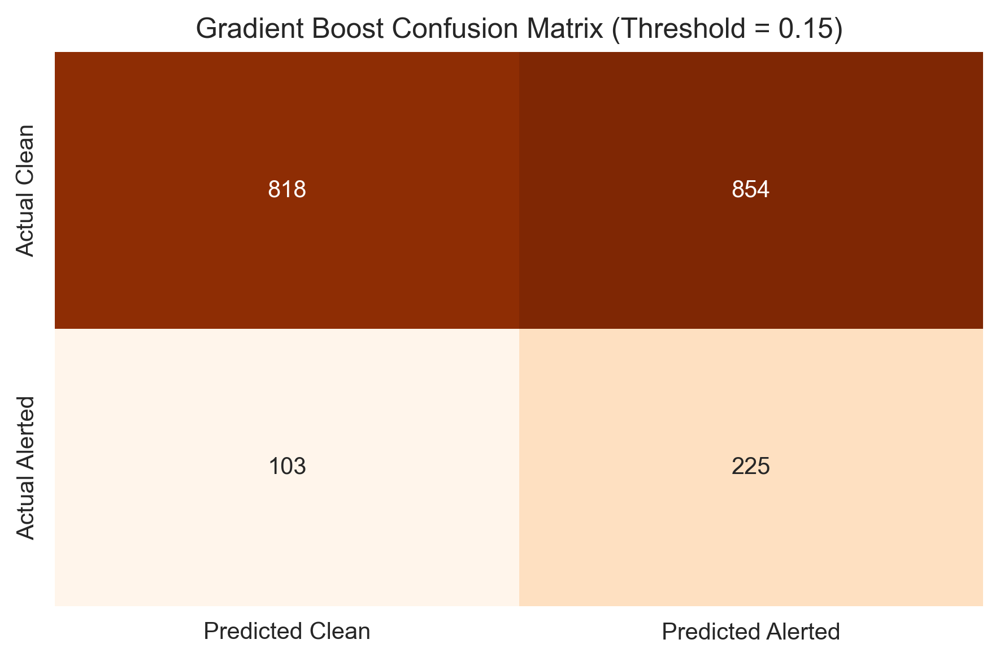


--- 5. Check Feature Importance ---
Top 5 Most Important Features:


,Feature,Importance
1,total_sent,0.01
9,behavior_5,0.00
2,total_received,0.00
3,close_balance,0.00
0,init_balance,0.00


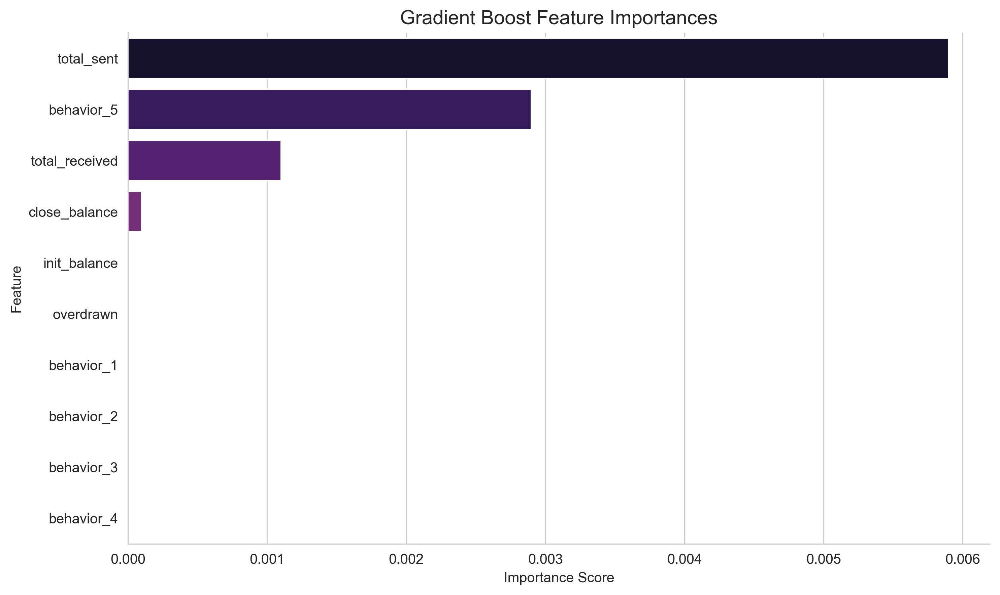

In [620]:
# --- 11.2 GB NRP Run ---

list_cols = ['fan_in_role', 'cycle_role']
run_drops = [
    'account_id', 'unique_alert_count', 'associated_alerts', 
    'alert_status', 'associated_alert_types', 'is_fraud',
    'associated_accounts', 'most_active_timestamp'
]

model_gb, features_gb, thresh_gb, f1_gb = tune_and_run_gb(
    df=accounts_expanded,
    list_columns=list_cols,
    columns_to_drop=run_drops,
    n_trials=30
)

### 12. GB Network Risk Propagation Model

In [622]:
# --- 12.1 GB Network Risk Propagation Pipeline ---

def run_gbnrp_model(
    df,
    list_columns,
    columns_to_drop, 
    pass_1_threshold=0.90, 
    test_size=0.2, 
    random_state=27, 
    gb_params=None,
    show_plots=True,
    verbose=True,
    abort_if_no_anchors=False,   
    min_anchors=5                
):
    """
    Executes a 2-pass Graph Machine Learning pipeline using Gradient Boosting. 
    Pass 1: Identifies high-confidence 'Anchor' accounts.
    Pass 2: Propagates risk to connected accounts and retrains.

    Args:
        - df (pd.DataFrame): input dataset containing account and transaction features
        - list_columns (list): columns containing list objects to be encoded
        - columns_to_drop (list): columns to remove before training – prevents data leakage & drops identifiers
        - pass_1_threshold (float, optional): probability threshold for an account to be flagged as an anchor
        - test_size (float, optional): proportion of the dataset to include in the test split
        - random_state (int, optional): RNG seed
        - gb_params (dict, optional): hyperparameters to pass to the model
        - show_plots (bool, optional): if True, renders the confusion matrix and feature importance visualisations
        - verbose (bool, optional): if True, prints pipeline progress, optimal threshold metrics, & the classification report
        - abort_if_no_anchors (bool, optional): if True, terminates the function early if minimum anchors aren't found
        - min_anchors (int, optional): minimum required anchors to proceed to pass 2
    
    Returns (tuple):
        - pass_1_model (sklearn HistGradientBoostingClassifier): the fully trained Pass 1 anchor model
        - pass_2_model (sklearn HistGradientBoostingClassifier): the fully trained Pass 2 contextual model (None if aborted)
        - feature_names (list): final list of feature column names used for Pass 2 training (None if aborted)
        - best_threshold (float): the optimised probability threshold calculated to maximise F1-score (None if aborted)
        - best_f1 (float): maximum F1-score achieved on the test set (0.0 if aborted)
    """
    if verbose: print(f"--- Starting Multi-Pass GB Pipeline (Pass 1 Threshold: {pass_1_threshold:.2f}) ---")
    
    ml_df = df.copy()
    y = ml_df['alert_status'].map({'alerted': 1, 'non-alerted': 0})
    network_meta = ml_df[['account_id', 'associated_accounts']].copy()
    
    drop_list = columns_to_drop + ['account_id', 'associated_accounts']
    ml_df = ml_df.drop(columns=[col for col in drop_list if col in ml_df.columns])

    for col in list_columns:
        if col in ml_df.columns:
            joined_strings = ml_df[col].apply(lambda x: '|'.join(map(str, x)) if isinstance(x, list) else '')
            dummies = joined_strings.str.get_dummies(sep='|').add_prefix(f"{col}_")
            ml_df = pd.concat([ml_df, dummies], axis=1).drop(columns=[col])

    if 'tx_behavior_id' in ml_df.columns:
        ml_df['tx_behavior_id'] = ml_df['tx_behavior_id'].astype(str)
        behavior_dummies = pd.get_dummies(ml_df['tx_behavior_id'], prefix='behavior').astype(int)
        ml_df = pd.concat([ml_df, behavior_dummies], axis=1).drop(columns=['tx_behavior_id'])

    # CRITICAL: Force float type for HistGradientBoostingClassifier compatibility
    X_base = ml_df.astype(float)

    X_train_base, X_test_base, y_train, y_test, meta_train, meta_test = train_test_split(
        X_base, y, network_meta, test_size=test_size, random_state=random_state, stratify=y
    )

    if gb_params is None:
        gb_params = {'max_iter': 100, 'random_state': random_state}

    # PASS 1: Anchor Model
    if verbose: print("\n[Pass 1] Training model to identify anchors")
    pass_1_model = HistGradientBoostingClassifier(**gb_params)
    pass_1_model.fit(X_train_base, y_train)

    train_probs = pass_1_model.predict_proba(X_train_base)[:, 1]
    test_probs = pass_1_model.predict_proba(X_test_base)[:, 1]

    train_anchors = set(meta_train[train_probs >= pass_1_threshold]['account_id'])
    test_anchors = set(meta_test[test_probs >= pass_1_threshold]['account_id'])
    all_known_anchors = train_anchors.union(test_anchors)
    
    if verbose:
        print(f"{ind}> [Pass 1] Found {len(train_anchors)} Anchors in Training set")
        print(f"{ind}> [Pass 1] Found {len(test_anchors)} Anchors in Testing set")

    # Abort Logic
    if abort_if_no_anchors and len(train_anchors) < min_anchors:
        if verbose: print(f"ABORTING PASS 2: Only {len(train_anchors)} anchors found (Minimum required: {min_anchors})")
        return pass_1_model, None, None, None, 0.0

    # NRP Logic
    if verbose: print("\n[Network Step] Propagating risk to associated accounts")
    
    def count_anchors(associated_list, anchor_set):
        if not isinstance(associated_list, list): return 0
        return len(set(associated_list).intersection(anchor_set))

    X_train_pass2 = X_train_base.copy()
    X_train_pass2['high_risk_connections'] = meta_train['associated_accounts'].apply(lambda x: count_anchors(x, train_anchors))

    X_test_pass2 = X_test_base.copy()
    X_test_pass2['high_risk_connections'] = meta_test['associated_accounts'].apply(lambda x: count_anchors(x, all_known_anchors))
    
    train_infections = (X_train_pass2['high_risk_connections'] > 0).sum()
    if verbose: print(f"[Network Step] {train_infections} training accounts flagged by association.")

    # PASS 2: Contextual Model
    if verbose: print("\n[Pass 2] Re-training model with network Context")
    pass_2_model = HistGradientBoostingClassifier(**gb_params)
    pass_2_model.fit(X_train_pass2, y_train)

    y_probs_pass2 = pass_2_model.predict_proba(X_test_pass2)[:, 1]

    precisions, recalls, thresholds = precision_recall_curve(y_test, y_probs_pass2)
    f1_scores = (2 * precisions[:-1] * recalls[:-1]) / (precisions[:-1] + recalls[:-1] + 1e-9)
    best_idx = np.argmax(f1_scores)
    best_threshold = thresholds[best_idx]
    best_f1 = f1_scores[best_idx]

    if verbose:
        print(f"\n--- Pass 2 Optimal Threshold: {best_threshold:.4f} ---")
        print(f"F1-Score:  {best_f1:.4f}")
        print(f"Precision: {precisions[best_idx]:.4f}")
        print(f"Recall:    {recalls[best_idx]:.4f}")

    final_preds = (y_probs_pass2 >= best_threshold).astype(int)

    # Plots
    if show_plots:
        cm = confusion_matrix(y_test, final_preds)
        plt.figure(figsize=(6, 4))
        sns.heatmap(cm, annot=True, fmt='d', cmap='Oranges', cbar=False,
                    xticklabels=['Predicted Clean', 'Predicted Alerted'],
                    yticklabels=['Actual Clean', 'Actual Alerted'])
        plt.title(f'Pass 2 Confusion Matrix (Threshold = {best_threshold:.2f})')
        plt.tight_layout()
        plt.show()

        print("--- Pass 2 Feature Importances ---")
        # Using Permutation Importance since HistGradientBoosting lacks feature_importances_
        result = permutation_importance(pass_2_model, X_test_pass2, y_test, n_repeats=5, random_state=random_state)
        fi_df = pd.DataFrame({'Feature': X_train_pass2.columns, 'Importance': result.importances_mean})
        fi_df = fi_df.sort_values(by='Importance', ascending=False)
        
        display(fi_df.head(6))

        plt.figure(figsize=(10, 6))
        sns.barplot(data=fi_df.head(10), x='Importance', y='Feature', hue='Feature', palette='magma', legend=False)
        plt.title('Pass 2 GB Feature Importances', fontsize=14)
        plt.xlabel('Importance Score')
        plt.ylabel('Feature')
        sns.despine()
        plt.tight_layout()
        plt.show()

    return pass_1_model, pass_2_model, X_train_pass2.columns.tolist(), best_threshold, best_f1


# --- Optuna Optimisation Wrapper ---

def tune_and_run_gbnrp(
    df, 
    list_columns, 
    columns_to_drop, 
    n_trials=30, 
    min_anchors=5,
    test_size=0.2,
    random_state=27
):
    """
    Wraps the Optuna objective function so it can dynamically accept 
    different configurations for the silent model runs.
    """
    
    def gbnrp_objective(trial):
        # Tune the GB architecture
        gb_params = {
            'max_iter': trial.suggest_int('max_iter', 100, 500),
            'max_depth': trial.suggest_int('max_depth', 3, 15),
            'learning_rate': trial.suggest_float('learning_rate', 0.01, 0.3, log=True),
            'l2_regularization': trial.suggest_float('l2_regularization', 1e-8, 10.0, log=True),
            'random_state': random_state
        }
        
        # Tune the anchor threshold aggressively (forcing it to find valid networks)
        dynamic_pass_1_threshold = trial.suggest_float('pass_1_threshold', 0.50, 0.95)

        # Run silently, but abort if it doesn't find enough anchors
        p1, p2, feats, thresh, f1 = run_gbnrp_model(
            df=df,
            list_columns=list_columns,
            columns_to_drop=columns_to_drop,
            pass_1_threshold=dynamic_pass_1_threshold,
            test_size=test_size,
            random_state=random_state,
            gb_params=gb_params,
            show_plots=False,  
            verbose=False,
            abort_if_no_anchors=True,  
            min_anchors=min_anchors    
        )

        return f1

    print("\nRunning Smart Optuna Search for GB Network Model")
    print("Trials with weak networks will be automatically aborted")
    print("-" * 50)

    # Run the optimisation
    gbnrp_study = optuna.create_study(direction='maximize')
    gbnrp_study.optimize(gbnrp_objective, n_trials=n_trials)

    print("--- Optimisation Complete ---")
    print(f"\nBest Final F1-Score Achieved: {gbnrp_study.best_value:.4f}")
    
    print("Optimal Parameters Found:")
    for key, value in gbnrp_study.best_params.items():
        print(f"  > {key}: {value}")
    print("-" * 50)

    # Final verbose run with best parameters
    print("\n--- Running Final GB Network Model ---")

    best_gbnrp_params = gbnrp_study.best_params
    best_pass_1_thresh = best_gbnrp_params.pop('pass_1_threshold')
    
    best_gbnrp_params['random_state'] = random_state

    # Run one last time with all visuals and no aborts
    final_p1, final_p2, final_feats, final_thresh, final_f1 = run_gbnrp_model(
        df=df,
        list_columns=list_columns,
        columns_to_drop=columns_to_drop,
        pass_1_threshold=best_pass_1_thresh,
        test_size=test_size,
        random_state=random_state,
        gb_params=best_gbnrp_params,
        show_plots=True,   
        verbose=True,
        abort_if_no_anchors=False  
    )
    
    return final_p1, final_p2, final_feats, final_thresh, final_f1


Running Smart Optuna Search for GB Network Model
Trials with weak networks will be automatically aborted
--------------------------------------------------
--- Optimisation Complete ---

Best Final F1-Score Achieved: 0.4936
Optimal Parameters Found:
  > max_iter: 371
  > max_depth: 6
  > learning_rate: 0.13920113250946078
  > l2_regularization: 1.2251521367533466e-06
  > pass_1_threshold: 0.5601032632487508
--------------------------------------------------

--- Running Final GB Network Model ---
--- Starting Multi-Pass GB Pipeline (Pass 1 Threshold: 0.56) ---

[Pass 1] Training model to identify anchors
   > [Pass 1] Found 1032 Anchors in Training set
   > [Pass 1] Found 99 Anchors in Testing set

[Network Step] Propagating risk to associated accounts
[Network Step] 6361 training accounts flagged by association.

[Pass 2] Re-training model with network Context

--- Pass 2 Optimal Threshold: 0.1696 ---
F1-Score:  0.4936
Precision: 0.3992
Recall:    0.6463


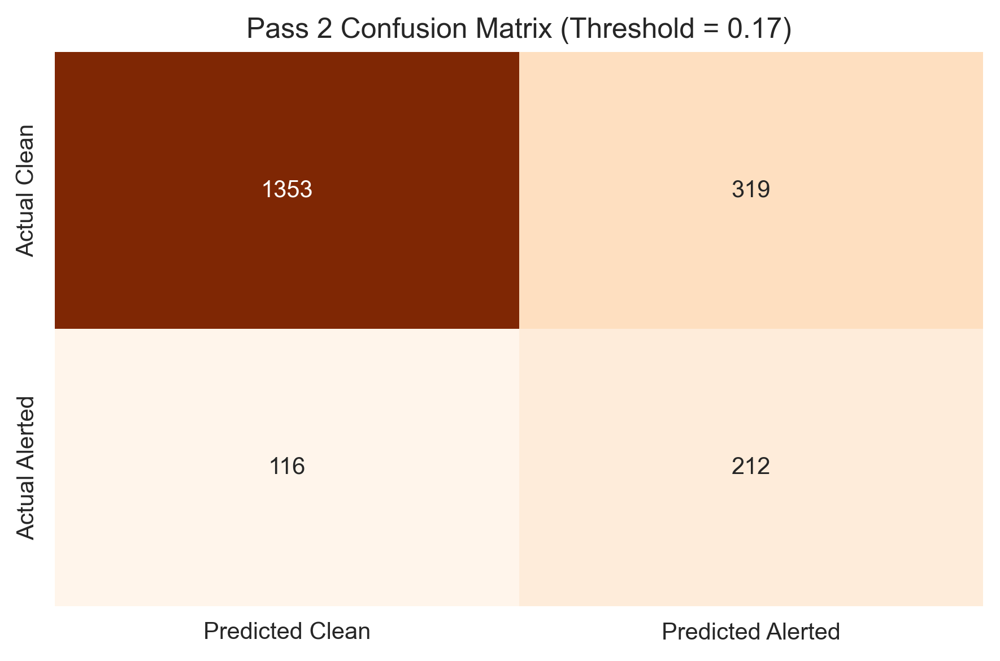

--- Pass 2 Feature Importances ---


,Feature,Importance
15,high_risk_connections,0.09
5,total_tx_sent,0.05
0,init_balance,0.03
7,total_money_sent,0.02
3,total_transactions,0.01
10,behavior_1,0.01


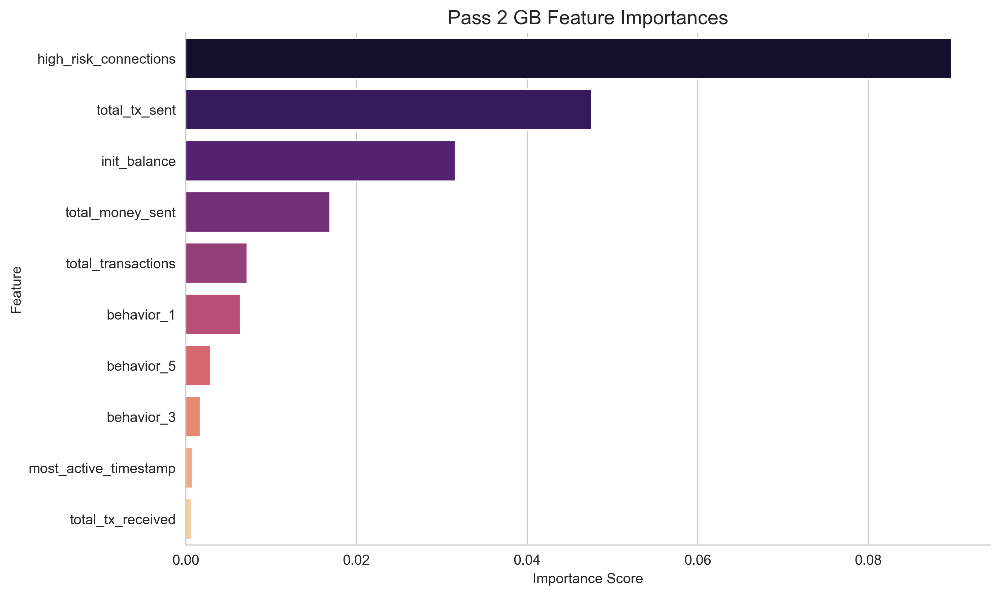

In [623]:
# --- 12.2 GB NRP Run ---

list_cols = ['fan_in_role', 'cycle_role', 'associated_accounts']
drop_cols = ['unique_alert_count', 'associated_alerts', 'alert_status', 'associated_alert_types', 'is_fraud']

# Catch the 5 variables now returned by the updated wrapper
model_gb_p1, model_gb_p2, final_gb_feats, final_gb_thresh, final_gb_f1_score = tune_and_run_gbnrp(
    df=accounts_expanded_2,
    list_columns=list_cols,
    columns_to_drop=drop_cols,
    n_trials=30,      
    min_anchors=10    
)

### 13. Model Comparison Dashboard

In [625]:
# --- 13.1 Comparison Pipeline ---

def plot_model_comparison(lr_scores, rf_scores, gb_scores, rfnrp_scores, gbnrp_scores):
    """
    Plots a grouped bar chart comparing Precision, Recall, and F1-Score across five models.
    Scores order: [Precision, Recall, F1-Score].
    """
    metrics = ['Precision', 'Recall', 'F1-Score']
    
    x = np.arange(len(metrics))  # the label locations
    width = 0.15  # Thinner bars to fit 5 per group

    fig, ax = plt.subplots(figsize=(12, 6))
    
    # Create the bars with mathematically staggered x-positions
    rects1 = ax.bar(x - 2*width, lr_scores, width, label='Logistic Regression', color='#2ca02c')   # Green
    rects2 = ax.bar(x - width, rf_scores, width, label='Random Forest', color='#98abc5')           # Light Blue
    rects3 = ax.bar(x, rfnrp_scores, width, label='Random Forest NRP', color='#1f77b4')            # Dark Blue
    rects4 = ax.bar(x + width, gb_scores, width, label='Gradient Boost', color='#ffbb78')          # Light Orange
    rects5 = ax.bar(x + 2*width, gbnrp_scores, width, label='Gradient Boost NRP', color='#ff7f0e') # Dark Orange

    # Add text for labels, title and custom x-axis tick labels
    ax.set_ylabel('Score (0.0 to 1.0)', fontsize=12)
    ax.set_title('Fraud Detection Model Performance Comparison', fontsize=16, pad=15)
    ax.set_xticks(x)
    ax.set_xticklabels(metrics, fontsize=12)
    ax.legend(loc='upper left', bbox_to_anchor=(1, 1))
    ax.set_ylim(0, 1.1) # Pushed to 1.1 to leave room for the text labels at the top

    # Add the exact numbers on top of the bars
    def autolabel(rects):
        """Attach a text label above each bar, displaying its height."""
        for rect in rects:
            height = rect.get_height()
            ax.annotate(f'{height:.2f}',
                        xy=(rect.get_x() + rect.get_width() / 2, height),
                        xytext=(0, 3),  # 3 points vertical offset
                        textcoords="offset points",
                        ha='center', va='bottom', fontsize=9)

    autolabel(rects1)
    autolabel(rects2)
    autolabel(rects3)
    autolabel(rects4)
    autolabel(rects5)

    # Clean up the visual borders
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)
    
    fig.tight_layout()
    plt.show()

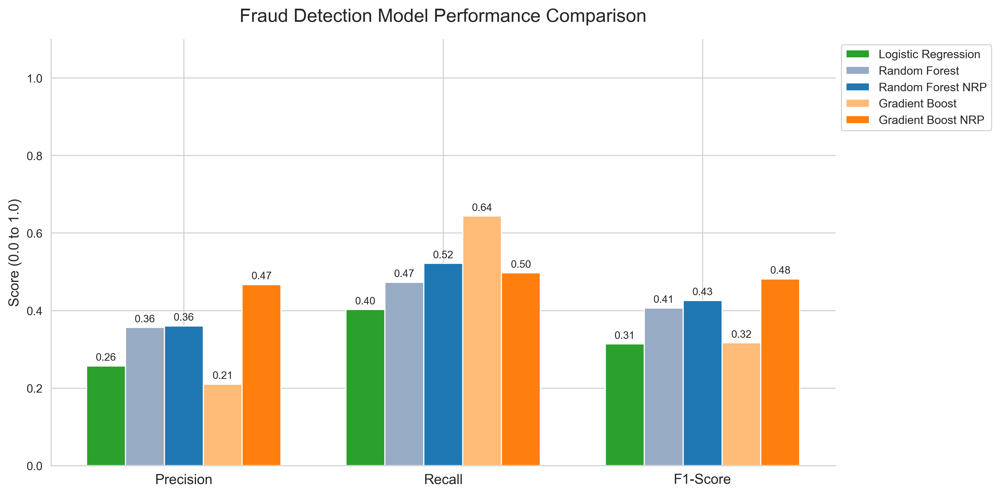

In [626]:
# --- 13.2 Execute Comparison ---

# Order: [Precision, Recall, F1-Score]
lr_scores = [0.2568, 0.4024, 0.3135]
rf_scores = [0.3563, 0.4726, 0.4063]
gb_scores = [0.2100, 0.6433, 0.3166]

rfnrp_scores = [0.3600, 0.5213, 0.4259] 
gbnrp_scores = [0.4670, 0.4970, 0.4815] 

plot_model_comparison(lr_scores, rf_scores, gb_scores, rfnrp_scores, gbnrp_scores)

### <span style="color:red">Observations</span>

- Gradient boosting does generally outperform the other methods, but there are major inconsistencies
- NRP generally outperforms the non-NRP models. However, it fluctuates wildly – likely the result of which anchors are established in the first pass; some have more connections than others. This is a major luck factor, which needs to be engineered out.
- Highest scores were firmly in the high-60's for precision & recall.

**Note:** The above graph may not be correct to the numbers in the other cells. The results can change run-to-run, which is why I didn't bother to automate this and kept manual score inputs. Helped with comparison.

## C. Enhanced Model Development

### 14. Stacked Model Development

In [630]:
# --- 14.1 Enhanced Model Pipeline ---

# Feature Engineering – NetworkX Centrality
def add_networkx_features(transactions_df, accounts_df, verbose=True):
    """
    Builds a directed graph of all transactions to calculate 
    PageRank and Degree Centrality for every account.

    Args:
        - transactions_df (pd.DataFrame): raw transaction ledger containing sender/receiver relationships
        - accounts_df (pd.DataFrame): account-level feature dataset to map the features back onto
        - verbose (bool, optional): if True, prints graph building progress to the console
    
    Returns:
        - enhanced_df (pd.DataFrame): the original accounts dataset with network centrality features appended
    """
    if verbose: print("--- Extracting NetworkX Graph Features ---")
    
    # Build a directed graph from the transaction ledger
    # Weight the edges by the transaction amount
    G = nx.from_pandas_edgelist(
        transactions_df,
        source='sender_account_id',
        target='receiver_account_id',
        edge_attr='tx_amount',
        create_using=nx.DiGraph()
    )
    
    if verbose: print(f"Graph built with {G.number_of_nodes()} accounts and {G.number_of_edges()} transaction paths")
    
    # Mathematically map how money flows through the network
    # PageRank: high score == money flows to this account from other highly connected accounts
    pagerank = nx.pagerank(G, weight='tx_amount')
    
    # In/Out Degree: the raw proportion of the network this account interacts with
    in_degree = nx.in_degree_centrality(G)
    out_degree = nx.out_degree_centrality(G)
    
    # Map back to a df
    nx_features = pd.DataFrame({
        'account_id': list(G.nodes()),
        'nx_pagerank': [pagerank.get(n, 0) for n in G.nodes()],
        'nx_in_degree': [in_degree.get(n, 0) for n in G.nodes()],
        'nx_out_degree': [out_degree.get(n, 0) for n in G.nodes()]
    })
    
    # Merge into accounts df
    enhanced_df = accounts_df.merge(nx_features, on='account_id', how='left')
    
    # Fill any disconnected accounts with 0
    nx_cols = ['nx_pagerank', 'nx_in_degree', 'nx_out_degree']
    enhanced_df[nx_cols] = enhanced_df[nx_cols].fillna(0)
    
    if verbose: print("NetworkX features successfully added to dataframe\n")
    return enhanced_df

# --- Core Model Pipeline ---
def run_stacked_model(
    df,
    list_columns,
    columns_to_drop, 
    test_size=0.2, 
    random_state=27, 
    show_plots=True,
    verbose=True
):
    """
    Preprocesses data, applies SMOTE for class balancing, trains a Stacking Classifier 
    (LR, RF, GB), optimises the decision threshold, and outputs evaluation metrics.

    Args:
        - df (pd.DataFrame): input dataset containing account and transaction features
        - list_columns (list): columns containing list objects to be encoded
        - columns_to_drop (list): columns to remove before training – prevents data leakage & drops identifiers
        - test_size (float, optional): proportion of the dataset to include in the test split
        - random_state (int, optional): RNG seed
        - show_plots (bool, optional): if True, renders the confusion matrix and meta-model weights
        - verbose (bool, optional): if True, prints pipeline progress, optimal threshold metrics, & the classification report
    
    Returns (tuple):
        - stack_model (sklearn StackingClassifier): the fully trained ensemble model
        - feature_names (list): final list of feature column names used for model training
        - best_threshold (float): the optimised probability threshold calculated to maximise F1-score
        - best_f1 (float): maximum F1-score achieved on the test set (using optimal threshold)
    """
    if verbose: print("--- Data Preprocessing ---")
    ml_df = df.copy()

    # Target Variable
    y = ml_df['alert_status'].map({'alerted': 1, 'non-alerted': 0})

    # Drop Leakage Columns
    ml_df = ml_df.drop(columns=[col for col in columns_to_drop if col in ml_df.columns])

    # Encode List Columns
    for col in list_columns:
        if col in ml_df.columns:
            joined_strings = ml_df[col].apply(lambda x: '|'.join(map(str, x)) if isinstance(x, list) else '')
            dummies = joined_strings.str.get_dummies(sep='|').add_prefix(f"{col}_")
            ml_df = pd.concat([ml_df, dummies], axis=1).drop(columns=[col])

    # Encode Categorical Columns
    if 'tx_behavior_id' in ml_df.columns:
        ml_df['tx_behavior_id'] = ml_df['tx_behavior_id'].astype(str)
        behavior_dummies = pd.get_dummies(ml_df['tx_behavior_id'], prefix='behavior').astype(int)
        ml_df = pd.concat([ml_df, behavior_dummies], axis=1).drop(columns=['tx_behavior_id'])

    # Finalise X, force float, and fill any lingering NaNs with 0
    X = ml_df.astype(float).fillna(0)
    
    if verbose:
        print(f"Feature Matrix (X) shape: {X.shape}")
        print(f"Target Vector (y) shape:  {y.shape}")
        
        print("\n--- Train/Test Split & SMOTE Balancing ---")
    
    # Train/Test Split
    X_train, X_test, y_train, y_test = train_test_split(
        X, y, test_size=test_size, random_state=random_state, stratify=y
    )

    # Only apply SMOTE to the training data
    smote = SMOTE(random_state=random_state)
    X_train_smote, y_train_smote = smote.fit_resample(X_train, y_train)
    
    if verbose:
        print(f"Original Training Set: {sum(y_train==0)} Clean, {sum(y_train==1)} Fraud")
        print(f"SMOTE Training Set:    {sum(y_train_smote==0)} Clean, {sum(y_train_smote==1)} Fraud")
        
        print("\n--- Assembling Stacking Classifier ---")
    
    # Define the Level-0 'Jury' Models
    level_0_estimators = [
        ('lr', LogisticRegression(max_iter=2000, random_state=random_state)),
        ('rf', RandomForestClassifier(n_estimators=300, max_depth=12, random_state=random_state, n_jobs=-1)),
        ('gb', HistGradientBoostingClassifier(max_iter=300, max_depth=10, learning_rate=0.05, random_state=random_state))
    ]

    # Define the Level-1 'Judge' Meta-Model
    level_1_estimator = LogisticRegression(random_state=random_state)

    # Build the Stack
    stack_model = StackingClassifier(
        estimators=level_0_estimators,
        final_estimator=level_1_estimator,
        cv=5, 
        n_jobs=-1
    )

    if verbose: print("Training Ultimate Stack")
    stack_model.fit(X_train_smote, y_train_smote)

    # Output Probabilities
    y_probs = stack_model.predict_proba(X_test)[:, 1]
    if verbose: print("Model training complete")

    if verbose: print("\n--- Threshold Optimisation & Evaluation ---")
    precisions, recalls, thresholds = precision_recall_curve(y_test, y_probs)
    f1_scores = (2 * precisions[:-1] * recalls[:-1]) / (precisions[:-1] + recalls[:-1] + 1e-9)
    best_idx = np.argmax(f1_scores)
    best_threshold = thresholds[best_idx]
    best_f1 = f1_scores[best_idx]

    if verbose:
        print(f"Best Threshold: {best_threshold:.4f}")
        print(f"F1-Score:       {best_f1:.4f}")
        print(f"Precision:      {precisions[best_idx]:.4f}")
        print(f"Recall:         {recalls[best_idx]:.4f}")

    final_preds = (y_probs >= best_threshold).astype(int)
    
    if verbose:
        print("\nClassification Report:")
        print(classification_report(y_test, final_preds, target_names=['Clean (0)', 'Alerted (1)']))

    # Plots
    if show_plots:
        cm = confusion_matrix(y_test, final_preds)
        plt.figure(figsize=(6, 4))
        sns.heatmap(cm, annot=True, fmt='d', cmap='Purples', cbar=False, # purple for stacked model
                    xticklabels=['Predicted Clean', 'Predicted Alerted'],
                    yticklabels=['Actual Clean', 'Actual Alerted'])
        plt.title(f'Stacking Classifier Confusion Matrix (Threshold = {best_threshold:.2f})')
        plt.tight_layout()
        plt.show()

        if verbose: print("\n--- Meta-Model Weight Check ---")
        meta_weights = stack_model.final_estimator_.coef_[0]
        model_names = [name for name, _ in level_0_estimators]
        
        weight_df = pd.DataFrame({'Model': model_names, 'Trust Weight': meta_weights}).sort_values(by='Trust Weight', ascending=False)
        display(weight_df)

    # Usual 4-element return tuple
    return stack_model, X.columns.tolist(), best_threshold, best_f1

--- Extracting NetworkX Graph Features ---
Graph built with 9999 accounts and 67722 transaction paths
NetworkX features successfully added to dataframe

--- Data Preprocessing ---
Feature Matrix (X) shape: (10000, 17)
Target Vector (y) shape:  (10000,)

--- Train/Test Split & SMOTE Balancing ---
Original Training Set: 6689 Clean, 1311 Fraud
SMOTE Training Set:    6689 Clean, 6689 Fraud

--- Assembling Stacking Classifier ---
Training Ultimate Stack
Model training complete

--- Threshold Optimisation & Evaluation ---
Best Threshold: 0.3900
F1-Score:       0.5976
Precision:      0.5976
Recall:         0.5976

Classification Report:
              precision    recall  f1-score   support

   Clean (0)       0.92      0.92      0.92      1672
 Alerted (1)       0.60      0.60      0.60       328

    accuracy                           0.87      2000
   macro avg       0.76      0.76      0.76      2000
weighted avg       0.87      0.87      0.87      2000



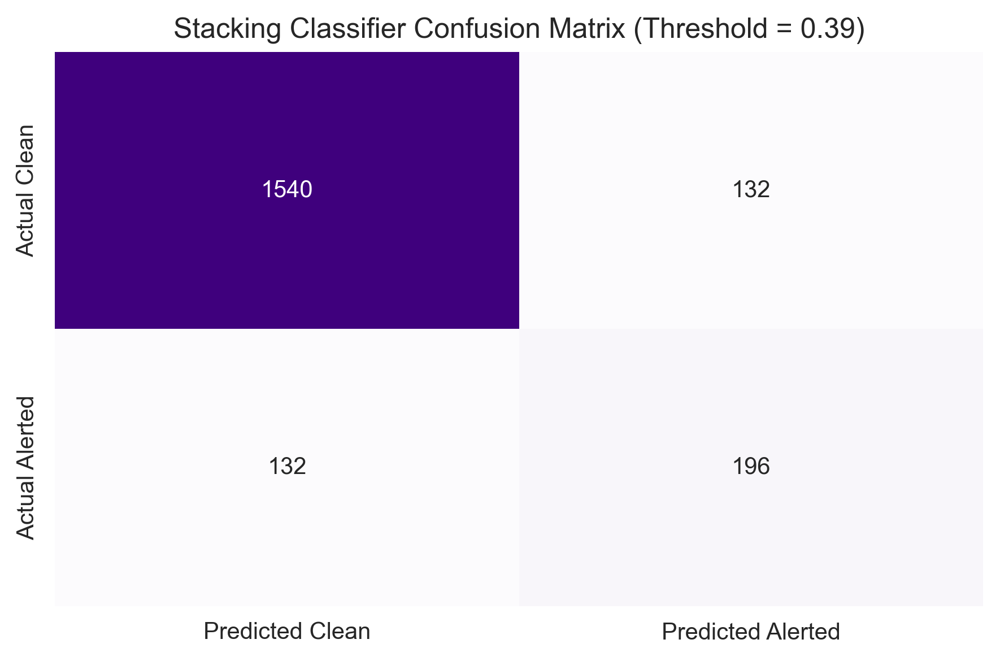


--- Meta-Model Weight Check ---


,Model,Trust Weight
1,rf,4.86
2,gb,3.43
0,lr,-2.03


In [631]:
# --- 14.2 Run Pipeline ---

# Get NewtworkX Features
accounts_ultimate = add_networkx_features(transactions, accounts_expanded_2)

# Run Main Model
list_cols = ['fan_in_role', 'cycle_role']
drops = [
    'account_id', 'unique_alert_count', 'associated_alerts', 
    'alert_status', 'associated_alert_types', 'is_fraud',
    'associated_accounts', 'most_active_timestamp'   
]

ultimate_model, ultimate_features, ultimate_thresh, ultimate_f1 = run_stacked_model(
    df=accounts_ultimate, 
    list_columns=list_cols, 
    columns_to_drop=drops
)

## D. Multi-Class Model Attempt

### 15. Multi-Class GB Model

In [690]:
# --- 15.1 Advanced Model Pipeline (Multi-Class) ---

def run_multiclass_model(
    df,
    list_columns,
    columns_to_drop, 
    test_size=0.2, 
    random_state=27, 
    gb_params=None,
    show_plots=True,
    verbose=True
):
    """
    Preprocesses data, maps multi-class targets, applies SMOTE for balancing, 
    trains a HistGradientBoostingClassifier, and outputs multi-class evaluation metrics.

    Args:
        - df (pd.DataFrame): input dataset containing account and transaction features
        - list_columns (list): columns containing list objects to be encoded
        - columns_to_drop (list): columns to remove before training to prevent data leakage
        - test_size (float, optional): proportion of the dataset to include in the test split
        - random_state (int, optional): RNG seed
        - gb_params (dict, optional): hyperparameters to pass to the model
        - show_plots (bool, optional): if True, renders the confusion matrix and feature importances
        - verbose (bool, optional): if True, prints pipeline progress and the classification report
    
    Returns (tuple):
        - gb_model (sklearn HistGradientBoostingClassifier): the fully trained multi-class model
        - feature_names (list): final list of feature column names used for model training
        - macro_f1 (float): the Macro F1-score achieved on the test set
    """
    if verbose: print("--- Data Preprocessing ---")
    ml_df = df.copy()

    # Define the Multi-Class Target Variable
    def map_alert_type(alert_list):
        if not isinstance(alert_list, list) or len(alert_list) == 0:
            return 'Clean'
        elif len(alert_list) == 1:
            return alert_list[0].title() # e.g., 'Fan_In', 'Cycle'
        else:
            return 'Multiple' # Accounts involved in >1 scheme

    y = ml_df['associated_alert_types'].apply(map_alert_type)
    
    # Store unique classes for chart labelling
    class_labels = sorted(y.unique().tolist())
    if verbose: 
        print(f"Target Classes Found: {class_labels}")

    # Drop Data Leakage Columns (fan_in_role & cycle_role)
    ml_df = ml_df.drop(columns=[col for col in columns_to_drop if col in ml_df.columns])

    # Encode List Columns
    for col in list_columns:
        if col in ml_df.columns:
            joined_strings = ml_df[col].apply(lambda x: '|'.join(map(str, x)) if isinstance(x, list) else '')
            dummies = joined_strings.str.get_dummies(sep='|').add_prefix(f"{col}_")
            ml_df = pd.concat([ml_df, dummies], axis=1).drop(columns=[col])

    # Encode Categorical Columns
    if 'tx_behavior_id' in ml_df.columns:
        ml_df['tx_behavior_id'] = ml_df['tx_behavior_id'].astype(str)
        behavior_dummies = pd.get_dummies(ml_df['tx_behavior_id'], prefix='behavior').astype(int)
        ml_df = pd.concat([ml_df, behavior_dummies], axis=1).drop(columns=['tx_behavior_id'])

    # Finalise X, force float, & fill any lingering NaNs with 0
    X = ml_df.astype(float).fillna(0)
    
    if verbose:
        print(f"Feature Matrix (X) shape: {X.shape}")
        print(f"Target Vector (y) shape:  {y.shape}")
        print("\n--- Train/Test Split & SMOTE Balancing ---")
    
    # Train/Test Split
    X_train, X_test, y_train, y_test = train_test_split(
        X, y, test_size=test_size, random_state=random_state, stratify=y
    )

    # Apply SMOTE to balance every class equally in the training set
    smote = SMOTE(random_state=random_state)
    X_train_smote, y_train_smote = smote.fit_resample(X_train, y_train)

    if verbose:
        print("Original Training Set Distribution:")
        print(y_train.value_counts().to_string())
        print("\nSMOTE Training Set Distribution:")
        print(y_train_smote.value_counts().to_string())
        print("\n--- Model Training ---")

    if gb_params is None:
        gb_params = {'random_state': random_state, 'max_iter': 200, 'max_depth': 10}
    elif 'random_state' not in gb_params:
        gb_params['random_state'] = random_state

    # GB library automatically detects multi-class targets
    gb_model = HistGradientBoostingClassifier(**gb_params)
    gb_model.fit(X_train_smote, y_train_smote)

    # In multi-class, take the standard predictions (highest probability wins)
    final_preds = gb_model.predict(X_test)
    if verbose: print("Model training complete")

    if verbose: print("\n--- Evaluation ---")
    
    # Use Macro F1 to treat every typology equally, regardless of size
    macro_f1 = f1_score(y_test, final_preds, average='macro')
    
    if verbose:
        print(f"Overall Macro F1-Score: {macro_f1:.4f}\n")
        print("Classification Report:")
        print(classification_report(y_test, final_preds, target_names=class_labels))

    # Plots
    if show_plots:
        cm = confusion_matrix(y_test, final_preds, labels=class_labels)
        plt.figure(figsize=(8, 6))
        
        # Plotting the confusion matrix for multi-class
        sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', cbar=False,
                    xticklabels=class_labels,
                    yticklabels=class_labels)
        plt.title('Multi-Class Confusion Matrix')
        plt.ylabel('Actual Typology')
        plt.xlabel('Predicted Typology')
        plt.tight_layout()
        plt.show()

        if verbose: print("\n--- Feature Importance Check ---")
        result = permutation_importance(gb_model, X_test, y_test, n_repeats=5, random_state=random_state)
        fi_df = pd.DataFrame({'Feature': X.columns, 'Importance': result.importances_mean})
        fi_df = fi_df.sort_values(by='Importance', ascending=False)
        
        display(fi_df.head(6))

        plt.figure(figsize=(10, 6))
        sns.barplot(data=fi_df.head(10), x='Importance', y='Feature', hue='Feature', palette='magma', legend=False)
        plt.title('Multi-Class GB Feature Importances', fontsize=14)
        plt.xlabel('Importance Score')
        plt.ylabel('Feature')
        sns.despine()
        plt.tight_layout()
        plt.show()
    
    # Return 3-element tuple
    return gb_model, X.columns.tolist(), macro_f1

--- Data Preprocessing ---
Target Classes Found: ['Clean', 'Cycle', 'Fan_In', 'Multiple']
Feature Matrix (X) shape: (10000, 17)
Target Vector (y) shape:  (10000,)

--- Train/Test Split & SMOTE Balancing ---
Original Training Set Distribution:
associated_alert_types
Clean       6689
Fan_In       613
Cycle        597
Multiple     101

SMOTE Training Set Distribution:
associated_alert_types
Clean       6689
Fan_In      6689
Cycle       6689
Multiple    6689

--- Model Training ---
Model training complete

--- Evaluation ---
Overall Macro F1-Score: 0.3956

Classification Report:
              precision    recall  f1-score   support

       Clean       0.89      0.97      0.93      1672
       Cycle       0.39      0.23      0.29       149
      Fan_In       0.26      0.13      0.17       154
    Multiple       0.22      0.16      0.19        25

    accuracy                           0.84      2000
   macro avg       0.44      0.37      0.40      2000
weighted avg       0.80      0.84     

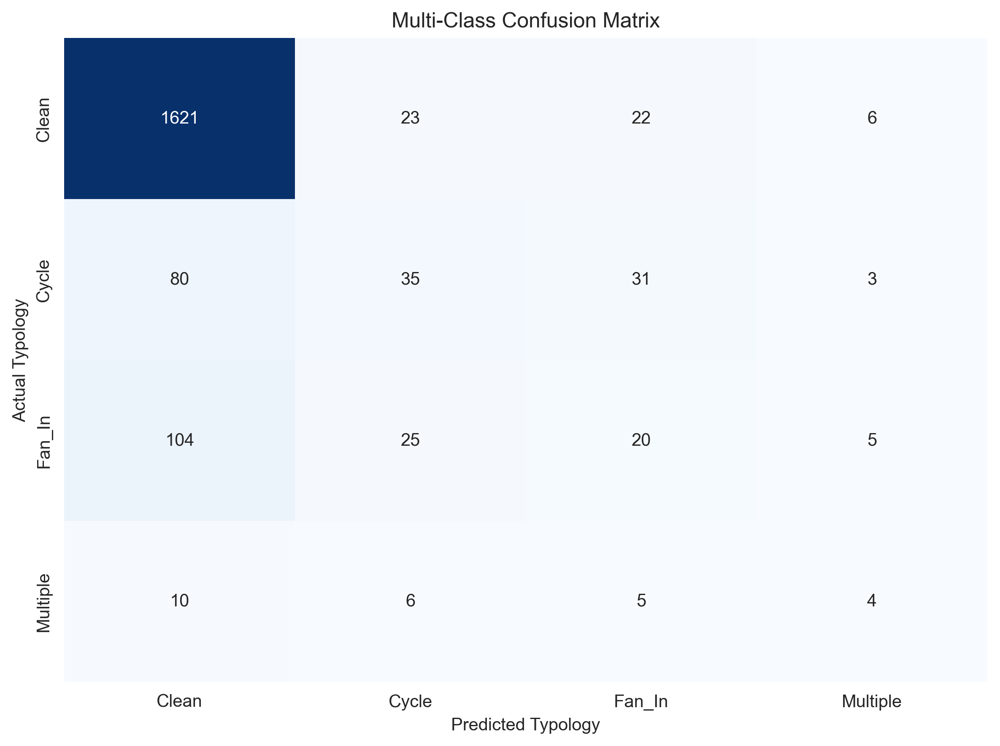


--- Feature Importance Check ---


,Feature,Importance
11,nx_out_degree,0.22
10,nx_in_degree,0.10
16,behavior_5,0.09
14,behavior_3,0.08
15,behavior_4,0.02
5,total_tx_sent,0.02


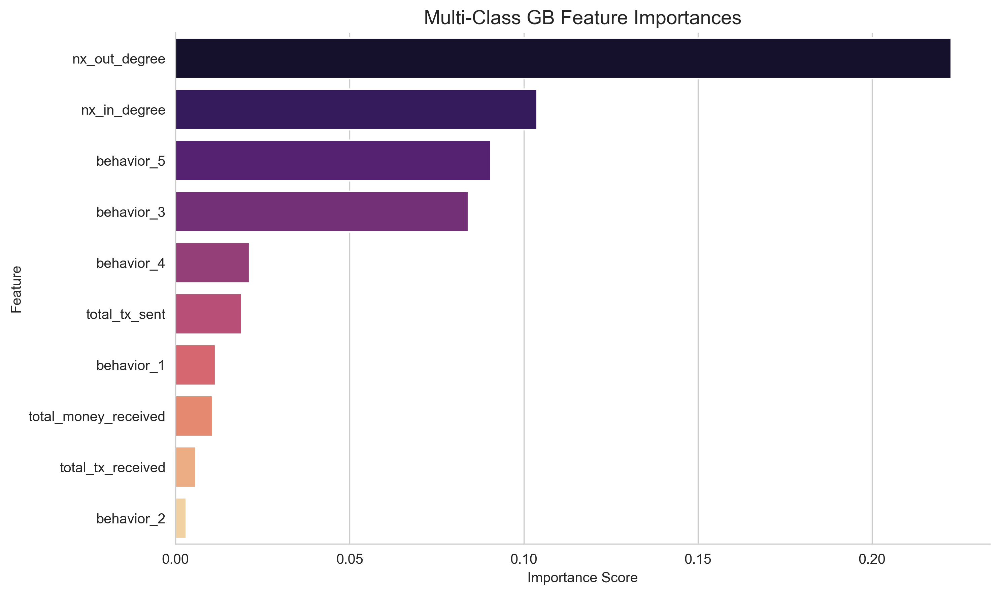

In [692]:
# --- 15.2 Run Multi-CLass Model ---

# No lists to encode – Roles dropped for leakage, accounts dropped for RAM
list_cols = []
drops = [
    'account_id', 'unique_alert_count', 'associated_alerts', 
    'alert_status', 'associated_alert_types', 'is_fraud',
    'most_active_timestamp', 'associated_accounts', # prevents 10,000 column RAM crash
    'fan_in_role', 'cycle_role'
]

model_mc, features_mc, f1_mc = run_multiclass_model(
    df=accounts_ultimate, 
    list_columns=list_cols, 
    columns_to_drop=drops,
    test_size=0.2,
    random_state=27,
    show_plots=True,
    verbose=True
)